In [1]:
from __future__ import absolute_import, division, print_function

import tensorflow as tf
tf.enable_eager_execution()
tf.VERSION

'1.12.0'

## Import data

In [2]:
import pathlib

DATADIR = './labeling_data'
data_root = pathlib.Path(DATADIR)
print(data_root)

labeling_data


In [3]:
all_image_paths = list(data_root.glob('*/*/*/*/*.jpg'))
all_image_paths = [str(path) for path in all_image_paths]

all_xml_paths = list(data_root.glob('*/*/*/*/*.xml'))
all_xml_paths = [str(path) for path in all_xml_paths]

image_count = len(all_image_paths)
xml_count = len(all_xml_paths)
image_count + xml_count

5272

In [4]:
all_image_paths[:10] + all_xml_paths[:10]

['labeling_data\\Images\\users\\kles90105\\257_data_set\\100n.jpg',
 'labeling_data\\Images\\users\\kles90105\\257_data_set\\100p.jpg',
 'labeling_data\\Images\\users\\kles90105\\257_data_set\\101n.jpg',
 'labeling_data\\Images\\users\\kles90105\\257_data_set\\101p.jpg',
 'labeling_data\\Images\\users\\kles90105\\257_data_set\\102n.jpg',
 'labeling_data\\Images\\users\\kles90105\\257_data_set\\102p.jpg',
 'labeling_data\\Images\\users\\kles90105\\257_data_set\\103n.jpg',
 'labeling_data\\Images\\users\\kles90105\\257_data_set\\103p.jpg',
 'labeling_data\\Images\\users\\kles90105\\257_data_set\\104n.jpg',
 'labeling_data\\Images\\users\\kles90105\\257_data_set\\104p.jpg',
 'labeling_data\\Annotations\\users\\kles90105\\257_data_set\\100n.xml',
 'labeling_data\\Annotations\\users\\kles90105\\257_data_set\\100p.xml',
 'labeling_data\\Annotations\\users\\kles90105\\257_data_set\\101n.xml',
 'labeling_data\\Annotations\\users\\kles90105\\257_data_set\\101p.xml',
 'labeling_data\\Annotations

In [5]:
import IPython.display as display

def caption_image(image_path):
    image_rel = pathlib.Path(image_path).relative_to(data_root)
    return image_rel
    

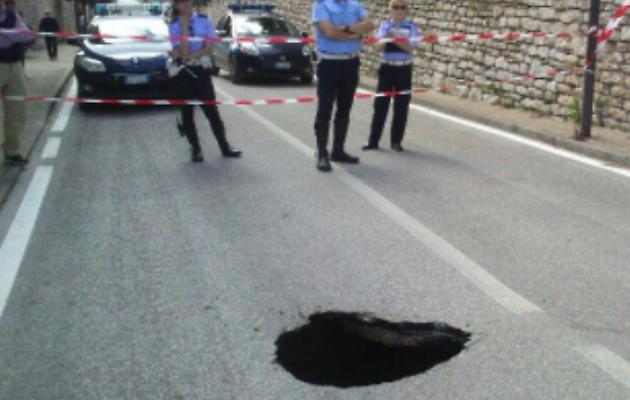

Images\users\kles90105\257_data_set\315p.jpg


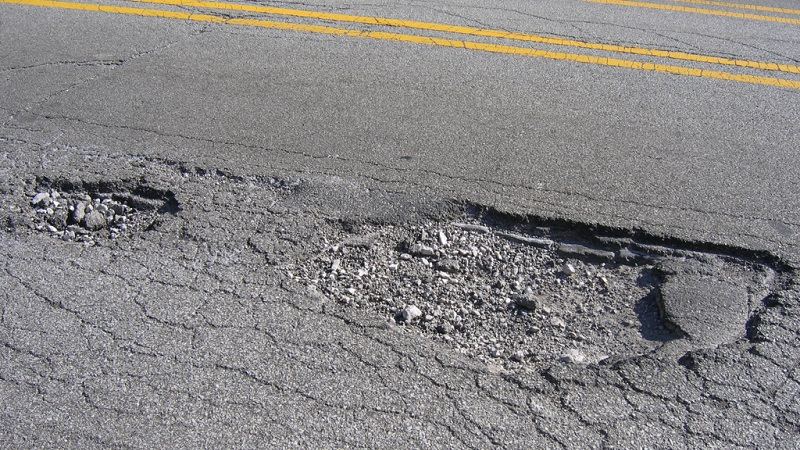

Images\users\kles90105\Positive Images\102.jpg


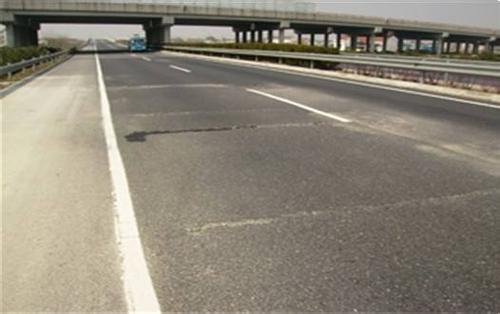

Images\users\kles90105\257_data_set\182p.jpg


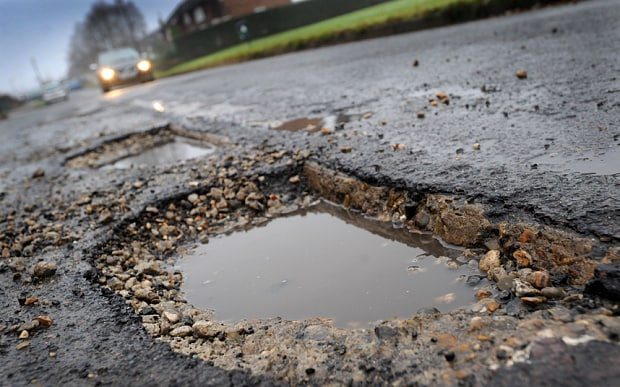

Images\users\kles90105\Positive Images\190.jpg


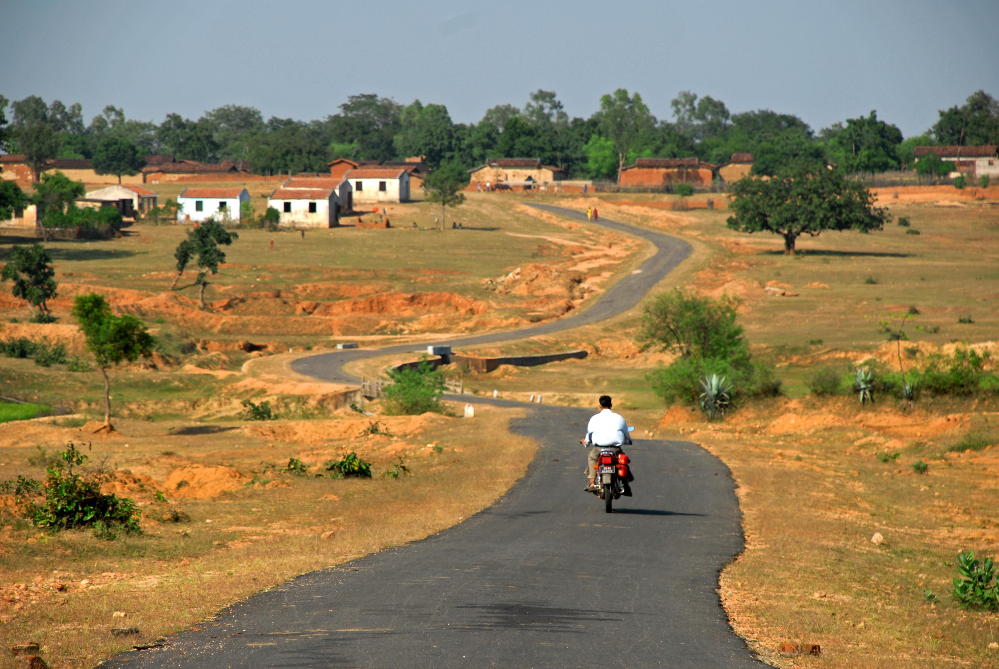

Images\users\kles90105\257_data_set\extra188.jpg


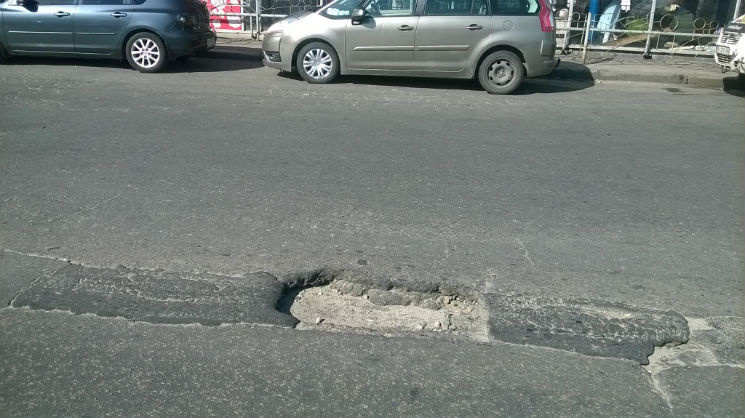

Images\users\kles90105\Positive Images\137.jpg


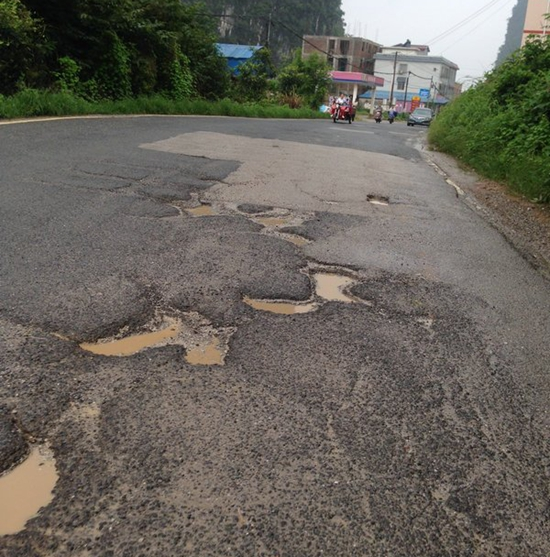

Images\users\kles90105\257_data_set\323p.jpg


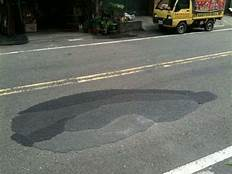

Images\users\kles90105\257_data_set\103p.jpg


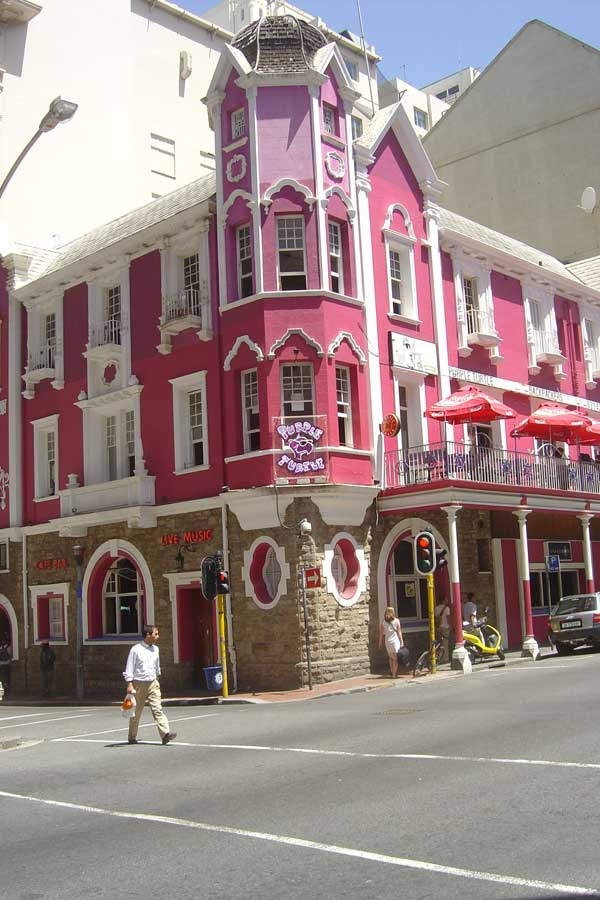

Images\users\kles90105\Negative Images\112.jpg


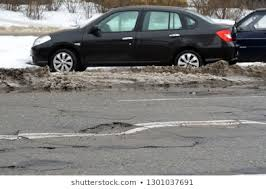

Images\users\kles90105\257_data_set\extra34.jpg


In [6]:
import random

for n in range(10):
  image_path = random.choice(all_image_paths)
  display.display(display.Image(image_path))
  print(caption_image(image_path))

## Prepare training data

In [7]:
import xml.etree.ElementTree as ET
import numpy as np
from array import *
from PIL import Image
import uuid

def xml_tree(x):
    for child in x:
        if(child.getchildren() == []):
            print(child.tag, ":", child.text)
        else:
            print(child.tag)
            xml_tree(child)

for i in range(len(all_image_paths)):
    tree = ET.parse(all_xml_paths[i])
    root = tree.getroot()
    xml_tree(root)
    print("")

    objs = root.findall("./object")

    x_list = []
    y_list = []
    for co in objs:
        print(co.find("./name").text)
        for node in co.findall("./polygon/pt"):
            print("point")
            children = node.getchildren()
            x = children[0].text
            y = children[1].text
            x_list.append(int(float(x)))
            y_list.append(int(float(y)))
            print(int(float(x)), int(float(y)))
        print("top-left", min(x_list), min(y_list))
        print("bottom-right", max(x_list), max(y_list))
        print()
    
        im = Image.open(all_image_paths[i])
        if(str(co.find("./name").text) == 'no pothole'):
            outfile = 'training_objects/pothole0-%s.png' % (str(uuid.uuid4()))
        elif(str(co.find("./name").text) == 'pothole'):
            if(co.find("./attributes").text == None):
                outfile = 'training_objects/pothole3-%s.png' % (str(uuid.uuid4()))
            else:
                outfile = 'training_objects/pothole%s-%s.png' % (str(co.find("./attributes").text), str(uuid.uuid4()))
        else:
            if(str(co.find("./name").text) == 'pothole1' or str(co.find("./name").text) == 'pothole2' 
               or str(co.find("./name").text) == 'pothole3' or str(co.find("./name").text) == 'pothole4'):
                outfile = 'training_objects/%s-%s.png' % (str(co.find("./name").text), str(uuid.uuid4()))
            elif(str(co.find("./name").text) == 'crack'):
                outfile = 'training_objects/pothole1-%s.png' % (str(uuid.uuid4()))
            else:
                outfile = 'training_objects/pothole0-%s.png' % (str(uuid.uuid4()))
        im.crop((min(x_list), min(y_list), max(x_list), max(y_list))).resize((640, 640)).save(outfile)
        print("Save as:", outfile)
        print()
        
        x_list = []
        y_list = []
    

filename : 100n.jpg
folder : users/robert4213//pothole_data/training_data
source
submittedBy : Shiyan Cai
imagesize
nrows : 800
ncols : 1200
object
name : paint
deleted : 0
verified : 0
occluded : no
attributes : None
parts
hasparts : None
ispartof : None
date : 21-Mar-2019 06:03:48
id : 0
polygon
username : anonymous
pt
x : 836
y : 508
pt
x : 825
y : 513
pt
x : 1052
y : 621
pt
x : 1089
y : 616
pt
x : 1074
y : 600

paint
point
836 508
point
825 513
point
1052 621
point
1089 616
point
1074 600
top-left 825 508
bottom-right 1089 621

Save as: training_objects/pothole0-79d66519-db4a-4785-968e-59d421350fd9.png

filename : 100p.jpg
folder : users/kles90105//257_data_set
source
submittedBy : Chen-Feng Huang
imagesize
nrows : 167
ncols : 250
object
name : pothole4
deleted : 0
verified : 0
occluded : yes
attributes : None
parts
hasparts : None
ispartof : None
date : 05-Apr-2019 20:01:53
id : 0
type : bounding_box
polygon
username : Bert
pt
x : 25
y : 128
pt
x : 137
y : 128
pt
x : 137
y : 160
p

Save as: training_objects/pothole1-40132204-e763-40ed-8ee1-49810ee2f403.png

filename : 106n.jpg
folder : users/robert4213//pothole_data/training_data
source
submittedBy : Shiyan Cai
imagesize
nrows : 600
ncols : 600
object
name : manhole
deleted : 0
verified : 0
occluded : no
attributes : None
parts
hasparts : None
ispartof : None
date : 21-Mar-2019 06:07:21
id : 0
type : bounding_box
polygon
username : anonymous
pt
x : 254
y : 303
pt
x : 313
y : 303
pt
x : 313
y : 324
pt
x : 254
y : 324

manhole
point
254 303
point
313 303
point
313 324
point
254 324
top-left 254 303
bottom-right 313 324

Save as: training_objects/pothole0-66ca9e16-e614-4ac7-8fd2-48008ffec81e.png

filename : 106p.jpg
folder : users/kles90105//257_data_set
source
submittedBy : Chen-Feng Huang
imagesize
nrows : 300
ncols : 169
object
name : pothole2
deleted : 0
verified : 0
occluded : no
attributes : None
parts
hasparts : None
ispartof : None
date : 21-Mar-2019 05:35:47
id : 0
type : bounding_box
polygon
username : Ber

Save as: training_objects/pothole0-0ed38edb-ae87-4cde-a860-0d0235510815.png

shadow
point
486 332
point
798 332
point
798 365
point
486 365
top-left 486 332
bottom-right 798 365

Save as: training_objects/pothole0-e05024db-5937-443a-826c-e9f2cd031ee9.png

shadow
point
505 305
point
639 305
point
639 325
point
505 325
top-left 505 305
bottom-right 639 325

Save as: training_objects/pothole0-d4be15f4-dbaf-4453-b126-3dc6a1a31c3d.png

filename : 111p.jpg
folder : users/kles90105//257_data_set
source
submittedBy : Chen-Feng Huang
imagesize
nrows : 161
ncols : 209
object
name : pothole1
deleted : 0
verified : 0
occluded : no
attributes : None
parts
hasparts : None
ispartof : None
date : 05-Apr-2019 20:04:47
id : 0
type : bounding_box
polygon
username : Bert
pt
x : 88
y : 71
pt
x : 208
y : 71
pt
x : 208
y : 160
pt
x : 88
y : 160
object
name : pothole1
deleted : 0
verified : 0
occluded : no
attributes : None
parts
hasparts : None
ispartof : None
date : 05-Apr-2019 20:04:52
id : 1
type : boundi

point
44 130
point
13 130
top-left 13 110
bottom-right 44 130

Save as: training_objects/pothole3-2162b2a3-78f2-45d6-b437-2afe861d713a.png

pothole3
point
3 135
point
46 135
point
46 157
point
3 157
top-left 3 135
bottom-right 46 157

Save as: training_objects/pothole3-8a41be2c-04a1-41cd-9eff-a751581d761b.png

pothole3
point
58 107
point
75 107
point
75 112
point
58 112
top-left 58 107
bottom-right 75 112

Save as: training_objects/pothole3-20059da4-855c-4605-b133-96c47c2c84a3.png

pothole3
point
54 115
point
68 115
point
68 123
point
54 123
top-left 54 115
bottom-right 68 123

Save as: training_objects/pothole3-72cbf7b5-4dd8-4776-95d7-221c7c61f211.png

pothole3
point
88 120
point
103 120
point
103 126
point
88 126
top-left 88 120
bottom-right 103 126

Save as: training_objects/pothole3-c46a1e45-b203-4d9a-8b95-bdd35ff2c81c.png

pothole3
point
99 116
point
113 116
point
113 121
point
99 121
top-left 99 116
bottom-right 113 121

Save as: training_objects/pothole3-1c245156-c468-4a9b-8136-

filename : 124p.jpg
folder : users/kles90105//257_data_set
source
submittedBy : Chen-Feng Huang
imagesize
nrows : 154
ncols : 273
object
name : pothole4
deleted : 0
verified : 0
occluded : no
attributes : None
parts
hasparts : None
ispartof : None
date : 05-Apr-2019 20:07:11
id : 0
type : bounding_box
polygon
username : Bert
pt
x : 27
y : 89
pt
x : 214
y : 89
pt
x : 214
y : 145
pt
x : 27
y : 145

pothole4
point
27 89
point
214 89
point
214 145
point
27 145
top-left 27 89
bottom-right 214 145

Save as: training_objects/pothole4-bf11c7a1-7f94-4cba-9ac7-2ad317ed54f2.png

filename : 125p.jpg
folder : users/kles90105//257_data_set
source
submittedBy : Chen-Feng Huang
imagesize
nrows : 159
ncols : 211
object
name : pothole2
deleted : 0
verified : 0
occluded : no
attributes : None
parts
hasparts : None
ispartof : None
date : 21-Mar-2019 05:47:23
id : 0
type : bounding_box
polygon
username : Bert
pt
x : 115
y : 135
pt
x : 134
y : 135
pt
x : 134
y : 142
pt
x : 115
y : 142

pothole2
point
115 13

filename : 133p.jpg
folder : users/kles90105//257_data_set
source
submittedBy : Chen-Feng Huang
imagesize
nrows : 228
ncols : 171
object
name : pothole2
deleted : 0
verified : 0
occluded : no
attributes : None
parts
hasparts : None
ispartof : None
date : 21-Mar-2019 05:49:40
id : 0
type : bounding_box
polygon
username : Bert
pt
x : 99
y : 64
pt
x : 151
y : 64
pt
x : 151
y : 93
pt
x : 99
y : 93
object
name : pothole2
deleted : 0
verified : 0
occluded : no
attributes : None
parts
hasparts : None
ispartof : None
date : 21-Mar-2019 05:49:45
id : 1
type : bounding_box
polygon
username : Bert
pt
x : 34
y : 154
pt
x : 91
y : 154
pt
x : 91
y : 188
pt
x : 34
y : 188
object
name : pothole2
deleted : 0
verified : 0
occluded : no
attributes : None
parts
hasparts : None
ispartof : None
date : 21-Mar-2019 05:49:49
id : 2
type : bounding_box
polygon
username : Bert
pt
x : 91
y : 117
pt
x : 141
y : 117
pt
x : 141
y : 164
pt
x : 91
y : 164
object
name : pothole2
deleted : 0
verified : 0
occluded : no
a

Save as: training_objects/pothole2-26164b03-37b9-4050-a566-a83b513c52c8.png

filename : 13n.jpg
folder : users/kles90105//257_data_set
source
submittedBy : Chen-Feng Huang
imagesize
nrows : 153
ncols : 273
object
name : pothole0
deleted : 0
verified : 0
occluded : no
attributes : None
parts
hasparts : None
ispartof : None
date : 21-Mar-2019 06:03:34
id : 0
type : bounding_box
polygon
username : Bert
pt
x : 34
y : 118
pt
x : 116
y : 118
pt
x : 116
y : 142
pt
x : 34
y : 142

pothole0
point
34 118
point
116 118
point
116 142
point
34 142
top-left 34 118
bottom-right 116 142

Save as: training_objects/pothole0-da7afe4c-afec-4cfa-870a-e28664b1b746.png

filename : 13p.jpg
folder : users/kles90105//257_data_set
source
submittedBy : Chen-Feng Huang
imagesize
nrows : 1049
ncols : 510
object
name : pothole4
deleted : 0
verified : 0
occluded : yes
attributes : None
parts
hasparts : None
ispartof : None
date : 21-Mar-2019 04:38:05
id : 0
type : bounding_box
polygon
username : anonymous
pt
x : 9
y 

Save as: training_objects/pothole1-27c5e42c-700c-464f-bed2-34b79c10d602.png

filename : 148p.jpg
folder : users/kles90105//257_data_set
source
submittedBy : Chen-Feng Huang
imagesize
nrows : 194
ncols : 259
object
name : pothole2
deleted : 0
verified : 0
occluded : no
attributes : None
parts
hasparts : None
ispartof : None
date : 05-Apr-2019 20:13:24
id : 0
type : bounding_box
polygon
username : Bert
pt
x : 120
y : 112
pt
x : 245
y : 112
pt
x : 245
y : 185
pt
x : 120
y : 185
object
name : pothole2
deleted : 0
verified : 0
occluded : no
attributes : None
parts
hasparts : None
ispartof : None
date : 05-Apr-2019 20:13:27
id : 1
type : bounding_box
polygon
username : Bert
pt
x : 57
y : 126
pt
x : 76
y : 126
pt
x : 76
y : 135
pt
x : 57
y : 135

pothole2
point
120 112
point
245 112
point
245 185
point
120 185
top-left 120 112
bottom-right 245 185

Save as: training_objects/pothole2-446ac5d3-a0a8-484b-8f84-dc26694f6500.png

pothole2
point
57 126
point
76 126
point
76 135
point
57 135
top-left

Save as: training_objects/pothole3-e1af4bff-3aaa-4f2a-818c-6bbaee7e5e83.png

pothole3
point
133 47
point
153 47
point
153 52
point
133 52
top-left 133 47
bottom-right 153 52

Save as: training_objects/pothole3-a9a90be3-9298-4ce4-9b94-a57da4d83a3c.png

pothole3
point
105 52
point
121 52
point
121 57
point
105 57
top-left 105 52
bottom-right 121 57

Save as: training_objects/pothole3-c8de22cd-f88d-435e-83f5-cb6aa8280b90.png

pothole3
point
123 43
point
144 43
point
144 48
point
123 48
top-left 123 43
bottom-right 144 48

Save as: training_objects/pothole3-4c664fc2-6ffa-4325-8b01-d2da02be247f.png

filename : 156p.jpg
folder : users/kles90105//257_data_set
source
submittedBy : Chen-Feng Huang
imagesize
nrows : 162
ncols : 287
object
name : pothole3
deleted : 0
verified : 0
occluded : no
attributes : None
parts
hasparts : None
ispartof : None
date : 05-Apr-2019 20:17:42
id : 0
type : bounding_box
polygon
username : Bert
pt
x : 51
y : 52
pt
x : 261
y : 52
pt
x : 261
y : 132
pt
x : 51
y : 132

filename : 163p.jpg
folder : users/kles90105//257_data_set
source
submittedBy : Chen-Feng Huang
imagesize
nrows : 162
ncols : 213
object
name : pothole3
deleted : 0
verified : 0
occluded : no
attributes : None
parts
hasparts : None
ispartof : None
date : 05-Apr-2019 20:18:46
id : 0
type : bounding_box
polygon
username : Bert
pt
x : 12
y : 42
pt
x : 196
y : 42
pt
x : 196
y : 141
pt
x : 12
y : 141

pothole3
point
12 42
point
196 42
point
196 141
point
12 141
top-left 12 42
bottom-right 196 141

Save as: training_objects/pothole3-92553663-5f3e-433e-b545-be86df1a5ce1.png

filename : 164p.jpg
folder : users/kles90105//257_data_set
source
submittedBy : Chen-Feng Huang
imagesize
nrows : 163
ncols : 217
object
name : pothole3
deleted : 0
verified : 0
occluded : no
attributes : None
parts
hasparts : None
ispartof : None
date : 05-Apr-2019 20:18:53
id : 0
type : bounding_box
polygon
username : Bert
pt
x : 34
y : 47
pt
x : 194
y : 47
pt
x : 194
y : 105
pt
x : 34
y : 105

pothole3
point
34 47
poin

Save as: training_objects/pothole3-58e741dc-5602-42c6-8414-b0e41f4da54e.png

pothole3
point
81 56
point
103 56
point
103 61
point
81 61
top-left 81 56
bottom-right 103 61

Save as: training_objects/pothole3-bb9c9c4a-7ff6-4118-9ff5-8b34f4a4f9a2.png

pothole3
point
151 144
point
185 144
point
185 156
point
151 156
top-left 151 144
bottom-right 185 156

Save as: training_objects/pothole3-3fc94381-822a-48f5-9846-4809e611eeb3.png

filename : 173p.jpg
folder : users/kles90105//257_data_set
source
submittedBy : Chen-Feng Huang
imagesize
nrows : 300
ncols : 200
object
name : pothole2
deleted : 0
verified : 0
occluded : no
attributes : None
parts
hasparts : None
ispartof : None
date : 05-Apr-2019 20:21:00
id : 0
type : bounding_box
polygon
username : Bert
pt
x : 26
y : 70
pt
x : 179
y : 70
pt
x : 179
y : 210
pt
x : 26
y : 210
object
name : pothole2
deleted : 0
verified : 0
occluded : no
attributes : None
parts
hasparts : None
ispartof : None
date : 05-Apr-2019 20:21:04
id : 1
type : bounding_bo

Save as: training_objects/pothole2-9f6308e8-9366-48b1-ac8c-ad65792238d3.png

filename : 17n.jpg
folder : users/kles90105//257_data_set
source
submittedBy : Chen-Feng Huang
imagesize
nrows : 164
ncols : 291
object
name : pothole0
deleted : 0
verified : 0
occluded : no
attributes : sewer cover
parts
hasparts : None
ispartof : None
date : 21-Mar-2019 06:04:20
id : 0
type : bounding_box
polygon
username : Bert
pt
x : 120
y : 59
pt
x : 169
y : 59
pt
x : 169
y : 73
pt
x : 120
y : 73
object
name : pothole0
deleted : 0
verified : 0
occluded : no
attributes : None
parts
hasparts : None
ispartof : None
date : 21-Mar-2019 06:04:24
id : 1
type : bounding_box
polygon
username : Bert
pt
x : 78
y : 91
pt
x : 209
y : 91
pt
x : 209
y : 149
pt
x : 78
y : 149

pothole0
point
120 59
point
169 59
point
169 73
point
120 73
top-left 120 59
bottom-right 169 73

Save as: training_objects/pothole0-299a05b8-6f58-4000-9efd-b9398384d63a.png

pothole0
point
78 91
point
209 91
point
209 149
point
78 149
top-left 78 

Save as: training_objects/pothole2-b3da8920-93bf-4c85-898d-9516c0c32588.png

pothole
point
392 108
point
182 108
point
182 159
point
392 159
top-left 182 108
bottom-right 392 159

Save as: training_objects/pothole1-b3961e66-ad32-4871-b3eb-513caa13dffd.png

pothole
point
290 75
point
228 75
point
228 90
point
290 90
top-left 228 75
bottom-right 290 90

Save as: training_objects/pothole1-7a51c366-7173-4425-bead-4023712dfca0.png

filename : 185p.jpg
folder : users/robert4213//pothole_data/training_data
source
submittedBy : Shiyan Cai
imagesize
nrows : 400
ncols : 600
object
name : pothole
deleted : 0
verified : 0
occluded : no
attributes : 3
parts
hasparts : None
ispartof : None
date : 18-Mar-2019 03:40:18
id : 0
type : bounding_box
polygon
username : Shiyan Cai
pt
x : 315
y : 203
pt
x : 11
y : 203
pt
x : 11
y : 263
pt
x : 315
y : 263

pothole
point
315 203
point
11 203
point
11 263
point
315 263
top-left 11 203
bottom-right 315 263

Save as: training_objects/pothole3-abb28863-5e12-4d4e-9

filename : 193p.jpg
folder : users/robert4213//pothole_data/training_data
source
submittedBy : Shiyan Cai
imagesize
nrows : 225
ncols : 300
object
name : pothole
deleted : 0
verified : 0
occluded : no
attributes : 3
parts
hasparts : None
ispartof : None
date : 18-Mar-2019 07:00:01
id : 0
type : bounding_box
polygon
username : Shiyan Cai
pt
x : 140
y : 113
pt
x : 230
y : 113
pt
x : 230
y : 154
pt
x : 140
y : 154

pothole
point
140 113
point
230 113
point
230 154
point
140 154
top-left 140 113
bottom-right 230 154

Save as: training_objects/pothole3-5377878b-9695-4ccf-bf3b-b55d944b7107.png

filename : 194p.jpg
folder : users/robert4213//pothole_data/training_data
source
submittedBy : Shiyan Cai
imagesize
nrows : 364
ncols : 550
object
name : pothole
deleted : 0
verified : 0
occluded : no
attributes : 2
parts
hasparts : None
ispartof : None
date : 18-Mar-2019 07:00:16
id : 0
type : bounding_box
polygon
username : Shiyan Cai
pt
x : 197
y : 222
pt
x : 398
y : 222
pt
x : 398
y : 270
pt
x : 1

Save as: training_objects/pothole2-7c9e026d-a338-4a0a-bf9a-c70746b1de5f.png

filename : 201p.jpg
folder : users/robert4213//pothole_data/training_data
source
submittedBy : Shiyan Cai
imagesize
nrows : 866
ncols : 1300
object
name : pothole
deleted : 0
verified : 0
occluded : no
attributes : 3
parts
hasparts : None
ispartof : None
date : 18-Mar-2019 07:06:32
id : 0
type : bounding_box
polygon
username : Shiyan Cai
pt
x : 229
y : 490
pt
x : 865
y : 490
pt
x : 865
y : 707
pt
x : 229
y : 707

pothole
point
229 490
point
865 490
point
865 707
point
229 707
top-left 229 490
bottom-right 865 707

Save as: training_objects/pothole3-767d8a14-576b-41c8-85ad-493e8f29f88f.png

filename : 202p.jpg
folder : users/robert4213//pothole_data/training_data
source
submittedBy : Shiyan Cai
imagesize
nrows : 332
ncols : 500
object
name : pothole
deleted : 0
verified : 0
occluded : no
attributes : 3
parts
hasparts : None
ispartof : None
date : 18-Mar-2019 07:06:39
id : 0
type : bounding_box
polygon
username 

filename : 211p.jpg
folder : users/robert4213//pothole_data/training_data
source
submittedBy : Shiyan Cai
imagesize
nrows : 281
ncols : 500
object
name : pothole
deleted : 0
verified : 0
occluded : no
attributes : 1
parts
hasparts : None
ispartof : None
date : 18-Mar-2019 07:10:01
id : 0
type : bounding_box
polygon
username : Shiyan Cai
pt
x : 117
y : 77
pt
x : 497
y : 77
pt
x : 497
y : 221
pt
x : 117
y : 221

pothole
point
117 77
point
497 77
point
497 221
point
117 221
top-left 117 77
bottom-right 497 221

Save as: training_objects/pothole1-9cb15874-0e78-46e3-a45b-271bb7c5fa98.png

filename : 212p.jpg
folder : users/robert4213//pothole_data/training_data
source
submittedBy : Shiyan Cai
imagesize
nrows : 626
ncols : 550
object
name : pothole
deleted : 0
verified : 0
occluded : no
attributes : 3
parts
hasparts : None
ispartof : None
date : 18-Mar-2019 07:10:08
id : 0
type : bounding_box
polygon
username : Shiyan Cai
pt
x : 189
y : 245
pt
x : 385
y : 245
pt
x : 385
y : 333
pt
x : 189
y 

315 399
top-left 315 197
bottom-right 594 399

Save as: training_objects/pothole4-a9871b03-178c-4e48-840c-2b16ac7919e3.png

filename : 220p.jpg
folder : users/robert4213//pothole_data/training_data
source
submittedBy : Shiyan Cai
imagesize
nrows : 195
ncols : 260
object
name : pothole
deleted : 0
verified : 0
occluded : no
attributes : 4
parts
hasparts : None
ispartof : None
date : 18-Mar-2019 07:12:48
id : 0
type : bounding_box
polygon
username : Shiyan Cai
pt
x : 87
y : 91
pt
x : 219
y : 91
pt
x : 219
y : 159
pt
x : 87
y : 159

pothole
point
87 91
point
219 91
point
219 159
point
87 159
top-left 87 91
bottom-right 219 159

Save as: training_objects/pothole4-387ca9d9-9679-48eb-96d7-9b87bb6f7c5a.png

filename : 221p.jpg
folder : users/robert4213//pothole_data/training_data
source
submittedBy : Shiyan Cai
imagesize
nrows : 375
ncols : 500
object
name : pothole
deleted : 0
verified : 0
occluded : no
attributes : 2
parts
hasparts : None
ispartof : None
date : 18-Mar-2019 07:12:55
id : 0
t

Save as: training_objects/pothole4-c8c0186d-66f5-4284-9b68-0b4c782c386a.png

filename : 227p.jpg
folder : users/robert4213//pothole_data/training_data
source
submittedBy : Shiyan Cai
imagesize
nrows : 183
ncols : 180
object
name : pothole
deleted : 0
verified : 0
occluded : no
attributes : 1
parts
hasparts : None
ispartof : None
date : 18-Mar-2019 07:16:37
id : 0
type : bounding_box
polygon
username : Shiyan Cai
pt
x : 176
y : 44
pt
x : 1
y : 44
pt
x : 1
y : 181
pt
x : 176
y : 181

pothole
point
176 44
point
1 44
point
1 181
point
176 181
top-left 1 44
bottom-right 176 181

Save as: training_objects/pothole1-7795cb70-5106-47be-858c-bb8dd71a2681.png

filename : 228p.jpg
folder : users/robert4213//pothole_data/training_data
source
submittedBy : Shiyan Cai
imagesize
nrows : 450
ncols : 600
object
name : pothole
deleted : 0
verified : 0
occluded : no
attributes : 1
parts
hasparts : None
ispartof : None
date : 18-Mar-2019 07:16:47
id : 0
type : bounding_box
polygon
username : Shiyan Cai
pt


Save as: training_objects/pothole3-ad25920b-ffa2-4e22-808a-196f7cc20745.png

pothole
point
44 220
point
76 220
point
76 240
point
44 240
top-left 44 220
bottom-right 76 240

Save as: training_objects/pothole2-85a428d4-29f2-4c3b-bd19-f7be489717b7.png

filename : 233p.jpg
folder : users/robert4213//pothole_data/training_data
source
submittedBy : Shiyan Cai
imagesize
nrows : 300
ncols : 400
object
name : pothole
deleted : 0
verified : 0
occluded : no
attributes : 1
parts
hasparts : None
ispartof : None
date : 18-Mar-2019 07:19:58
id : 0
polygon
username : Shiyan Cai
pt
x : 194
y : 99
pt
x : 51
y : 121
pt
x : 1
y : 161
pt
x : 3
y : 181
pt
x : 166
y : 250
pt
x : 399
y : 261
pt
x : 397
y : 191

pothole
point
194 99
point
51 121
point
1 161
point
3 181
point
166 250
point
399 261
point
397 191
top-left 1 99
bottom-right 399 261

Save as: training_objects/pothole1-5e933c9e-f0ff-4a81-ba50-6830d7ca086c.png

filename : 234p.jpg
folder : users/robert4213//pothole_data/training_data
source
submitte

filename : 243p.jpg
folder : users/robert4213//pothole_data/training_data
source
submittedBy : Shiyan Cai
imagesize
nrows : 496
ncols : 500
object
name : pothole
deleted : 0
verified : 0
occluded : no
attributes : 1
parts
hasparts : None
ispartof : None
date : 18-Mar-2019 07:21:39
id : 0
type : bounding_box
polygon
username : Shiyan Cai
pt
x : 432
y : 156
pt
x : 7
y : 156
pt
x : 7
y : 430
pt
x : 432
y : 430

pothole
point
432 156
point
7 156
point
7 430
point
432 430
top-left 7 156
bottom-right 432 430

Save as: training_objects/pothole1-4d6c4a01-4926-4546-9d3f-6761e882fcfd.png

filename : 244p.jpg
folder : users/robert4213//pothole_data/training_data
source
submittedBy : Shiyan Cai
imagesize
nrows : 573
ncols : 450
object
name : pothole
deleted : 0
verified : 0
occluded : no
attributes : 3
parts
hasparts : None
ispartof : None
date : 18-Mar-2019 07:21:48
id : 0
type : bounding_box
polygon
username : Shiyan Cai
pt
x : 20
y : 251
pt
x : 222
y : 251
pt
x : 222
y : 398
pt
x : 20
y : 398
o

filename : 252p.jpg
folder : users/robert4213//pothole_data/training_data
source
submittedBy : Shiyan Cai
imagesize
nrows : 321
ncols : 500
object
name : pothole
deleted : 0
verified : 0
occluded : no
attributes : 3
parts
hasparts : None
ispartof : None
date : 18-Mar-2019 07:23:18
id : 0
type : bounding_box
polygon
username : Shiyan Cai
pt
x : 60
y : 83
pt
x : 380
y : 83
pt
x : 380
y : 238
pt
x : 60
y : 238

pothole
point
60 83
point
380 83
point
380 238
point
60 238
top-left 60 83
bottom-right 380 238

Save as: training_objects/pothole3-a2ab0cc4-45f0-4c35-97ff-2d5d0251d66a.png

filename : 253p.jpg
folder : users/robert4213//pothole_data/training_data
source
submittedBy : Shiyan Cai
imagesize
nrows : 533
ncols : 400
object
name : pothole
deleted : 0
verified : 0
occluded : no
attributes : 3
parts
hasparts : None
ispartof : None
date : 18-Mar-2019 07:23:22
id : 0
type : bounding_box
polygon
username : Shiyan Cai
pt
x : 46
y : 343
pt
x : 389
y : 343
pt
x : 389
y : 436
pt
x : 46
y : 436



bottom-right 868 763

Save as: training_objects/pothole0-8591f378-c2bf-41ed-949f-f073c38d7e1b.png

filename : 260p.jpg
folder : users/robert4213//pothole_data/training_data
source
submittedBy : Shiyan Cai
imagesize
nrows : 266
ncols : 400
object
name : pothole
deleted : 0
verified : 0
occluded : no
attributes : 4
parts
hasparts : None
ispartof : None
date : 18-Mar-2019 07:25:09
id : 0
type : bounding_box
polygon
username : Shiyan Cai
pt
x : 53
y : 121
pt
x : 353
y : 121
pt
x : 353
y : 206
pt
x : 53
y : 206

pothole
point
53 121
point
353 121
point
353 206
point
53 206
top-left 53 121
bottom-right 353 206

Save as: training_objects/pothole4-3fd095d1-0968-4a36-8631-f8ce0da8e293.png

filename : 261p.jpg
folder : users/robert4213//pothole_data/training_data
source
submittedBy : Shiyan Cai
imagesize
nrows : 265
ncols : 400
object
name : pothole
deleted : 0
verified : 0
occluded : no
attributes : 3
parts
hasparts : None
ispartof : None
date : 18-Mar-2019 07:25:14
id : 0
type : bounding_box
p

Save as: training_objects/pothole3-f463696d-9172-4be3-99b0-59cda6a98099.png

filename : 275p.jpg
folder : users/robert4213//pothole_data/training_data
source
submittedBy : Shiyan Cai
imagesize
nrows : 332
ncols : 500
object
name : pothole
deleted : 0
verified : 0
occluded : no
attributes : 3
parts
hasparts : None
ispartof : None
date : 18-Mar-2019 07:27:02
id : 0
type : bounding_box
polygon
username : Shiyan Cai
pt
x : 118
y : 76
pt
x : 475
y : 76
pt
x : 475
y : 217
pt
x : 118
y : 217

pothole
point
118 76
point
475 76
point
475 217
point
118 217
top-left 118 76
bottom-right 475 217

Save as: training_objects/pothole3-b515d508-8909-4e1d-a89e-052de9729e2d.png

filename : 276p.jpg
folder : users/robert4213//pothole_data/training_data
source
submittedBy : Shiyan Cai
imagesize
nrows : 960
ncols : 1280
object
name : pothole
deleted : 0
verified : 0
occluded : no
attributes : 3
parts
hasparts : None
ispartof : None
date : 18-Mar-2019 07:27:09
id : 0
type : bounding_box
polygon
username : Shi

Save as: training_objects/pothole2-2f863ef6-fc27-4bc9-b5a3-9092891544dc.png

filename : 289p.jpg
folder : users/robert4213//pothole_data/training_data
source
submittedBy : Shiyan Cai
imagesize
nrows : 460
ncols : 680
object
name : pothole
deleted : 0
verified : 0
occluded : no
attributes : 4
parts
hasparts : None
ispartof : None
date : 18-Mar-2019 07:29:58
id : 0
type : bounding_box
polygon
username : Shiyan Cai
pt
x : 118
y : 280
pt
x : 443
y : 280
pt
x : 443
y : 358
pt
x : 118
y : 358
object
name : pothole
deleted : 0
verified : 0
occluded : no
attributes : 3
parts
hasparts : None
ispartof : None
date : 18-Mar-2019 07:30:02
id : 1
type : bounding_box
polygon
username : Shiyan Cai
pt
x : 435
y : 227
pt
x : 521
y : 227
pt
x : 521
y : 275
pt
x : 435
y : 275

pothole
point
118 280
point
443 280
point
443 358
point
118 358
top-left 118 280
bottom-right 443 358

Save as: training_objects/pothole4-a62d28f4-ca7e-4074-9134-ae7e7ab79be0.png

pothole
point
435 227
point
521 227
point
521 275
po

Save as: training_objects/pothole3-7026ffbe-2d61-4df9-b448-c5ea0f9efa3a.png

filename : 29n.jpg
folder : users/kles90105//257_data_set
source
submittedBy : Chen-Feng Huang
imagesize
nrows : 156
ncols : 233
object
name : pothole0
deleted : 0
verified : 0
occluded : no
attributes : None
parts
hasparts : None
ispartof : None
date : 21-Mar-2019 06:10:06
id : 0
type : bounding_box
polygon
username : Bert
pt
x : 52
y : 107
pt
x : 113
y : 107
pt
x : 113
y : 149
pt
x : 52
y : 149

pothole0
point
52 107
point
113 107
point
113 149
point
52 149
top-left 52 107
bottom-right 113 149

Save as: training_objects/pothole0-4f819845-e8dc-48cf-bd81-37fd72dc2713.png

filename : 29p.jpg
folder : users/kles90105//257_data_set
source
submittedBy : Chen-Feng Huang
imagesize
nrows : 173
ncols : 259
object
name : pothole1
deleted : 0
verified : 0
occluded : no
attributes : None
parts
hasparts : None
ispartof : None
date : 05-Apr-2019 19:55:35
id : 0
type : bounding_box
polygon
username : Bert
pt
x : 71
y : 134


filename : 304p.jpg
folder : users/robert4213//pothole_data/training_data
source
submittedBy : Shiyan Cai
imagesize
nrows : 468
ncols : 600
object
name : pothole
deleted : 0
verified : 0
occluded : no
attributes : 4
parts
hasparts : None
ispartof : None
date : 18-Mar-2019 07:33:57
id : 0
type : bounding_box
polygon
username : Shiyan Cai
pt
x : 91
y : 106
pt
x : 509
y : 106
pt
x : 509
y : 225
pt
x : 91
y : 225
object
name : pothole
deleted : 0
verified : 0
occluded : no
attributes : 3
parts
hasparts : None
ispartof : None
date : 18-Mar-2019 07:34:01
id : 1
type : bounding_box
polygon
username : Shiyan Cai
pt
x : 54
y : 234
pt
x : 169
y : 234
pt
x : 169
y : 290
pt
x : 54
y : 290
object
name : pothole
deleted : 0
verified : 0
occluded : no
attributes : 2
parts
hasparts : None
ispartof : None
date : 18-Mar-2019 07:34:12
id : 2
type : bounding_box
polygon
username : Shiyan Cai
pt
x : 443
y : 346
pt
x : 572
y : 346
pt
x : 572
y : 412
pt
x : 443
y : 412
object
name : pothole
deleted : 0
verif

Save as: training_objects/pothole3-544e377c-970c-4332-b942-f5b0d585b1be.png

pothole
point
20 957
point
6 1066
point
279 1080
point
603 1369
point
1133 1410
point
740 997
point
922 811
point
1070 718
point
853 522
point
1230 570
point
1650 760
point
1865 926
point
1897 795
point
1784 303
point
809 269
point
481 407
point
61 423
top-left 6 269
bottom-right 1897 1410

Save as: training_objects/pothole1-64c91ea4-48f8-4ccf-9c6e-1d067db5ca2e.png

pothole
point
991 811
point
684 912
point
894 1230
point
1290 1440
point
1446 1349
point
1495 1046
point
1232 843
top-left 684 811
bottom-right 1495 1440

Save as: training_objects/pothole3-b8fe9513-a746-4e33-bf7e-7e4d66d382dc.png

filename : 30n.jpg
folder : users/kles90105//257_data_set
source
submittedBy : Chen-Feng Huang
imagesize
nrows : 178
ncols : 266
object
name : pothole0
deleted : 0
verified : 0
occluded : no
attributes : None
parts
hasparts : None
ispartof : None
date : 21-Mar-2019 06:10:21
id : 0
type : bounding_box
polygon
username : B

Save as: training_objects/pothole4-ea184382-4466-4a44-b196-53da86c4ec0d.png

filename : 317p.jpg
folder : users/robert4213//pothole_data/training_data
source
submittedBy : Shiyan Cai
imagesize
nrows : 408
ncols : 610
object
name : pothole
deleted : 0
verified : 0
occluded : no
attributes : 3
parts
hasparts : None
ispartof : None
date : 18-Mar-2019 07:38:03
id : 0
type : bounding_box
polygon
username : Shiyan Cai
pt
x : 89
y : 255
pt
x : 183
y : 255
pt
x : 183
y : 282
pt
x : 89
y : 282
object
name : pothole
deleted : 0
verified : 0
occluded : no
attributes : 3
parts
hasparts : None
ispartof : None
date : 18-Mar-2019 07:38:11
id : 1
type : bounding_box
polygon
username : Shiyan Cai
pt
x : 410
y : 255
pt
x : 126
y : 255
pt
x : 126
y : 330
pt
x : 410
y : 330

pothole
point
89 255
point
183 255
point
183 282
point
89 282
top-left 89 255
bottom-right 183 282

Save as: training_objects/pothole3-327cd9cd-1049-48ce-834f-6795eb4b3575.png

pothole
point
410 255
point
126 255
point
126 330
point
4

Save as: training_objects/pothole3-d4a4ac7b-fb52-455c-97bf-48642b2a2c23.png

filename : 325p.jpg
folder : users/robert4213//pothole_data/training_data
source
submittedBy : Shiyan Cai
imagesize
nrows : 864
ncols : 1152
object
name : pothole
deleted : 0
verified : 0
occluded : no
attributes : 3
parts
hasparts : None
ispartof : None
date : 18-Mar-2019 07:40:41
id : 0
type : bounding_box
polygon
username : Shiyan Cai
pt
x : 271
y : 194
pt
x : 505
y : 194
pt
x : 505
y : 530
pt
x : 271
y : 530

pothole
point
271 194
point
505 194
point
505 530
point
271 530
top-left 271 194
bottom-right 505 530

Save as: training_objects/pothole3-c76de608-8d4c-4704-a6d9-8094100fd632.png

filename : 326p.jpg
folder : users/robert4213//pothole_data/training_data
source
submittedBy : Shiyan Cai
imagesize
nrows : 263
ncols : 400
object
name : pothole
deleted : 0
verified : 0
occluded : no
attributes : 4
parts
hasparts : None
ispartof : None
date : 18-Mar-2019 07:40:47
id : 0
type : bounding_box
polygon
username 

Save as: training_objects/pothole1-7c02b020-b1fb-4c44-a81b-327ba4ef8556.png

filename : 335p.jpg
folder : users/robert4213//pothole_data/training_data
source
submittedBy : Shiyan Cai
imagesize
nrows : 634
ncols : 960
object
name : pothole
deleted : 0
verified : 0
occluded : no
attributes : 3
parts
hasparts : None
ispartof : None
date : 18-Mar-2019 07:42:51
id : 0
polygon
username : Shiyan Cai
pt
x : 53
y : 401
pt
x : 161
y : 575
pt
x : 797
y : 540
pt
x : 736
y : 486
pt
x : 352
y : 483
pt
x : 259
y : 380

pothole
point
53 401
point
161 575
point
797 540
point
736 486
point
352 483
point
259 380
top-left 53 380
bottom-right 797 575

Save as: training_objects/pothole3-fa14b23c-8506-48c5-9cb6-037dad4f5c2e.png

filename : 336p.jpg
folder : users/robert4213//pothole_data/training_data
source
submittedBy : Shiyan Cai
imagesize
nrows : 256
ncols : 410
object
name : pothole
deleted : 0
verified : 0
occluded : no
attributes : 1
parts
hasparts : None
ispartof : None
date : 18-Mar-2019 07:43:04
id

filename : 343p.jpg
folder : users/robert4213//pothole_data/training_data
source
submittedBy : Shiyan Cai
imagesize
nrows : 378
ncols : 640
object
name : pothole
deleted : 0
verified : 0
occluded : no
attributes : 3
parts
hasparts : None
ispartof : None
date : 18-Mar-2019 07:46:47
id : 0
polygon
username : Shiyan Cai
pt
x : 192
y : 64
pt
x : 450
y : 251
pt
x : 451
y : 219
pt
x : 225
y : 41
pt
x : 196
y : 60
object
name : pothole
deleted : 0
verified : 0
occluded : no
attributes : 3
parts
hasparts : None
ispartof : None
date : 18-Mar-2019 07:46:53
id : 1
type : bounding_box
polygon
username : Shiyan Cai
pt
x : 89
y : 134
pt
x : 315
y : 134
pt
x : 315
y : 305
pt
x : 89
y : 305

pothole
point
192 64
point
450 251
point
451 219
point
225 41
point
196 60
top-left 192 41
bottom-right 451 251

Save as: training_objects/pothole3-809bf63e-dcdc-4748-96c5-d03f5d759ccc.png

pothole
point
89 134
point
315 134
point
315 305
point
89 305
top-left 89 134
bottom-right 315 305

Save as: training_objects

Save as: training_objects/pothole0-0e75080f-4dd4-4c08-935e-69558613b2f9.png

filename : 38p.jpg
folder : users/kles90105//257_data_set
source
submittedBy : Chen-Feng Huang
imagesize
nrows : 169
ncols : 300
object
name : pothole3
deleted : 0
verified : 0
occluded : no
attributes : None
parts
hasparts : None
ispartof : None
date : 21-Mar-2019 05:00:22
id : 0
type : bounding_box
polygon
username : anonymous
pt
x : 6
y : 56
pt
x : 290
y : 56
pt
x : 290
y : 162
pt
x : 6
y : 162

pothole3
point
6 56
point
290 56
point
290 162
point
6 162
top-left 6 56
bottom-right 290 162

Save as: training_objects/pothole3-cb3fbd09-924e-4359-bf09-beec157e8ef6.png

filename : 39n.jpg
folder : users/kles90105//257_data_set
source
submittedBy : Chen-Feng Huang
imagesize
nrows : 169
ncols : 254
object
name : pothole0
deleted : 0
verified : 0
occluded : no
attributes : None
parts
hasparts : None
ispartof : None
date : 21-Mar-2019 06:11:53
id : 0
type : bounding_box
polygon
username : Bert
pt
x : 86
y : 76
pt
x :

Save as: training_objects/pothole4-0be2df88-7c8b-4889-9902-dbaccb46108d.png

filename : 44n.jpg
folder : users/kles90105//257_data_set
source
submittedBy : Chen-Feng Huang
imagesize
nrows : 150
ncols : 200
object
name : pothole0
deleted : 0
verified : 0
occluded : no
attributes : None
parts
hasparts : None
ispartof : None
date : 05-Apr-2019 20:22:38
id : 0
type : bounding_box
polygon
username : Bert
pt
x : 63
y : 108
pt
x : 152
y : 108
pt
x : 152
y : 133
pt
x : 63
y : 133

pothole0
point
63 108
point
152 108
point
152 133
point
63 133
top-left 63 108
bottom-right 152 133

Save as: training_objects/pothole0-7e9954fd-6815-4968-a26d-f5a1d99d6e97.png

filename : 44p.jpg
folder : users/kles90105//257_data_set
source
submittedBy : Chen-Feng Huang
imagesize
nrows : 727
ncols : 542
object
name : pothole2
deleted : 0
verified : 0
occluded : no
attributes : None
parts
hasparts : None
ispartof : None
date : 21-Mar-2019 05:02:05
id : 0
type : bounding_box
polygon
username : anonymous
pt
x : 49
y :

Save as: training_objects/pothole2-3c83637e-9877-4d41-b75f-2efee766e43b.png

pothole2
point
105 47
point
148 47
point
148 69
point
105 69
top-left 105 47
bottom-right 148 69

Save as: training_objects/pothole2-619e86a2-3395-4250-abc2-e327fd30cdbf.png

pothole1
point
3 84
point
84 84
point
84 122
point
3 122
top-left 3 84
bottom-right 84 122

Save as: training_objects/pothole1-0ae8e6c6-360c-433c-a8e6-5c658014d279.png

pothole1
point
91 105
point
153 105
point
153 124
point
91 124
top-left 91 105
bottom-right 153 124

Save as: training_objects/pothole1-87ec3042-419c-4e3e-b124-37f8149fc504.png

pothole1
point
162 80
point
200 80
point
200 128
point
162 128
top-left 162 80
bottom-right 200 128

Save as: training_objects/pothole1-2779009c-9160-4856-b6c0-10ff7d50c2f8.png

pothole2
point
143 16
point
175 16
point
175 30
point
143 30
top-left 143 16
bottom-right 175 30

Save as: training_objects/pothole2-8f73b96b-9eb1-4e04-b392-5f82186154f7.png

pothole2
point
98 21
point
125 21
point
125 34
p

Save as: training_objects/pothole4-8e9053bf-b708-4f06-a1c9-2c5d4f352937.png

pothole1
point
203 90
point
272 90
point
272 129
point
203 129
top-left 203 90
bottom-right 272 129

Save as: training_objects/pothole1-4163a6d8-aae9-45c5-82d7-d24fca2363ca.png

filename : 58n.jpg
folder : users/kles90105//257_data_set
source
submittedBy : Chen-Feng Huang
imagesize
nrows : 300
ncols : 225
object
name : pothole0
deleted : 0
verified : 0
occluded : no
attributes : None
parts
hasparts : None
ispartof : None
date : 05-Apr-2019 20:24:32
id : 0
type : bounding_box
polygon
username : Bert
pt
x : 31
y : 154
pt
x : 79
y : 154
pt
x : 79
y : 190
pt
x : 31
y : 190

pothole0
point
31 154
point
79 154
point
79 190
point
31 190
top-left 31 154
bottom-right 79 190

Save as: training_objects/pothole0-cf78af8f-3d91-438d-b7c0-065461f6b874.png

filename : 58p.jpg
folder : users/kles90105//257_data_set
source
submittedBy : Chen-Feng Huang
imagesize
nrows : 152
ncols : 227
object
name : pothole1
deleted : 0
verifie

Save as: training_objects/pothole2-88dddf99-4b5c-42a0-8ab9-684fcd9826c6.png

pothole1
point
179 109
point
313 109
point
313 176
point
179 176
top-left 179 109
bottom-right 313 176

Save as: training_objects/pothole1-bd781406-cfdc-4d7c-a714-5d9f9dd07c04.png

filename : 63n.jpg
folder : users/kles90105//257_data_set
source
submittedBy : Chen-Feng Huang
imagesize
nrows : 173
ncols : 307
object
name : pothole0
deleted : 0
verified : 0
occluded : no
attributes : None
parts
hasparts : None
ispartof : None
date : 05-Apr-2019 20:25:03
id : 0
type : bounding_box
polygon
username : Bert
pt
x : 70
y : 59
pt
x : 115
y : 59
pt
x : 115
y : 88
pt
x : 70
y : 88

pothole0
point
70 59
point
115 59
point
115 88
point
70 88
top-left 70 59
bottom-right 115 88

Save as: training_objects/pothole0-c241aa36-34ee-4792-9de9-d0ceec2c0f08.png

filename : 63p.jpg
folder : users/kles90105//257_data_set
source
submittedBy : Chen-Feng Huang
imagesize
nrows : 176
ncols : 255
object
name : pothole2
deleted : 0
verified 

filename : 71n.jpg
folder : users/kles90105//257_data_set
source
submittedBy : Chen-Feng Huang
imagesize
nrows : 165
ncols : 219
object
name : pothole0
deleted : 0
verified : 0
occluded : no
attributes : sewer cover
parts
hasparts : None
ispartof : None
date : 21-Mar-2019 06:06:57
id : 0
type : bounding_box
polygon
username : Bert
pt
x : 33
y : 27
pt
x : 184
y : 27
pt
x : 184
y : 139
pt
x : 33
y : 139

pothole0
point
33 27
point
184 27
point
184 139
point
33 139
top-left 33 27
bottom-right 184 139

Save as: training_objects/pothole0-21e156d1-b8bb-496e-b8db-79899f709e2f.png

filename : 71p.jpg
folder : users/kles90105//257_data_set
source
submittedBy : Chen-Feng Huang
imagesize
nrows : 449
ncols : 800
object
name : pothole4
deleted : 0
verified : 0
occluded : yes
attributes : None
parts
hasparts : None
ispartof : None
date : 21-Mar-2019 05:17:00
id : 0
type : bounding_box
polygon
username : Bert
pt
x : 279
y : 112
pt
x : 485
y : 112
pt
x : 485
y : 274
pt
x : 279
y : 274

pothole4
point


Save as: training_objects/pothole0-e35e23e9-d95e-4243-b814-7e37f2fc04f0.png

filename : 76p.jpg
folder : users/kles90105//257_data_set
source
submittedBy : Chen-Feng Huang
imagesize
nrows : 300
ncols : 200
object
name : pothole3
deleted : 0
verified : 0
occluded : no
attributes : None
parts
hasparts : None
ispartof : None
date : 21-Mar-2019 05:18:25
id : 0
type : bounding_box
polygon
username : Bert
pt
x : 19
y : 198
pt
x : 115
y : 198
pt
x : 115
y : 260
pt
x : 19
y : 260
object
name : pothole2
deleted : 0
verified : 0
occluded : no
attributes : None
parts
hasparts : None
ispartof : None
date : 21-Mar-2019 05:18:29
id : 1
type : bounding_box
polygon
username : Bert
pt
x : 98
y : 121
pt
x : 114
y : 121
pt
x : 114
y : 130
pt
x : 98
y : 130
object
name : pothole2
deleted : 0
verified : 0
occluded : no
attributes : None
parts
hasparts : None
ispartof : None
date : 21-Mar-2019 05:18:34
id : 2
type : bounding_box
polygon
username : Bert
pt
x : 102
y : 107
pt
x : 112
y : 107
pt
x : 112
y : 11

pothole3
point
203 125
point
303 125
point
303 164
point
203 164
top-left 203 125
bottom-right 303 164

Save as: training_objects/pothole3-9e6b8981-47f9-4853-be6c-352a067087db.png

pothole2
point
196 177
point
238 177
point
238 208
point
196 208
top-left 196 177
bottom-right 238 208

Save as: training_objects/pothole2-42671a18-f380-4225-b3b9-60bfdd1907fa.png

filename : 7n.jpg
folder : users/kles90105//257_data_set
source
submittedBy : Chen-Feng Huang
imagesize
nrows : 161
ncols : 214
object
name : pothole0
deleted : 0
verified : 0
occluded : no
attributes : None
parts
hasparts : None
ispartof : None
date : 21-Mar-2019 06:02:29
id : 0
type : bounding_box
polygon
username : Bert
pt
x : 144
y : 129
pt
x : 177
y : 129
pt
x : 177
y : 153
pt
x : 144
y : 153

pothole0
point
144 129
point
177 129
point
177 153
point
144 153
top-left 144 129
bottom-right 177 153

Save as: training_objects/pothole0-ee531b17-5c8c-45b8-847f-95ee75fc3248.png

filename : 7p.jpg
folder : users/kles90105//257_data_se

filename : 83n.jpg
folder : users/robert4213//pothole_data/training_data
source
submittedBy : Shiyan Cai
imagesize
nrows : 330
ncols : 440
object
name : shadow
deleted : 0
verified : 0
occluded : no
attributes : None
parts
hasparts : None
ispartof : None
date : 21-Mar-2019 05:50:04
id : 0
polygon
username : anonymous
pt
x : 225
y : 228
pt
x : 296
y : 235
pt
x : 286
y : 247
pt
x : 171
y : 247
object
name : shadow
deleted : 0
verified : 0
occluded : no
attributes : None
parts
hasparts : None
ispartof : None
date : 21-Mar-2019 05:50:13
id : 1
polygon
username : anonymous
pt
x : 98
y : 254
pt
x : 275
y : 264
pt
x : 302
y : 272
pt
x : 286
y : 284
pt
x : 5
y : 290
pt
x : 1
y : 271
object
name : shadow
deleted : 0
verified : 0
occluded : no
attributes : None
parts
hasparts : None
ispartof : None
date : 21-Mar-2019 05:50:20
id : 2
type : bounding_box
polygon
username : anonymous
pt
x : 2
y : 292
pt
x : 133
y : 292
pt
x : 133
y : 299
pt
x : 2
y : 299

shadow
point
225 228
point
296 235
point
28

590 356
point
584 367
point
577 378
point
576 381
point
639 381
top-left 576 333
bottom-right 639 381

Save as: training_objects/pothole0-47657320-4c61-47f3-b549-5059c8f1be51.png

shadow
point
371 183
point
322 191
point
330 193
point
374 188
top-left 322 183
bottom-right 374 193

Save as: training_objects/pothole0-b4df90ed-87fe-47db-9b32-bff4ed8cb956.png

shadow
point
367 176
point
276 186
point
284 190
point
376 181
top-left 276 176
bottom-right 376 190

Save as: training_objects/pothole0-7d120f84-d4fe-45c5-b683-765d41b3d155.png

filename : 88p.jpg
folder : users/kles90105//257_data_set
source
submittedBy : Chen-Feng Huang
imagesize
nrows : 300
ncols : 199
object
name : pothole2
deleted : 0
verified : 0
occluded : no
attributes : None
parts
hasparts : None
ispartof : None
date : 21-Mar-2019 05:23:25
id : 0
type : bounding_box
polygon
username : Bert
pt
x : 1
y : 134
pt
x : 197
y : 134
pt
x : 197
y : 247
pt
x : 1
y : 247

pothole2
point
1 134
point
197 134
point
197 247
point
1 247
to

Save as: training_objects/pothole0-7f57dbdc-59e7-4b2d-8200-cc16c40b0473.png

shadow
point
204 246
point
248 246
point
248 257
point
204 257
top-left 204 246
bottom-right 248 257

Save as: training_objects/pothole0-12e222ff-8277-4903-b9f9-4baacb2e3741.png

shadow
point
186 345
point
247 345
point
247 370
point
186 370
top-left 186 345
bottom-right 247 370

Save as: training_objects/pothole0-6bfb5050-fef5-4add-a9e3-a6bd7fc0eabc.png

filename : 94p.jpg
folder : users/kles90105//257_data_set
source
submittedBy : Chen-Feng Huang
imagesize
nrows : 176
ncols : 264
object
name : pothole2
deleted : 0
verified : 0
occluded : yes
attributes : None
parts
hasparts : None
ispartof : None
date : 21-Mar-2019 05:25:23
id : 0
type : bounding_box
polygon
username : Bert
pt
x : 4
y : 38
pt
x : 259
y : 38
pt
x : 259
y : 173
pt
x : 4
y : 173

pothole2
point
4 38
point
259 38
point
259 173
point
4 173
top-left 4 38
bottom-right 259 173

Save as: training_objects/pothole2-3ff56ba4-9b32-420e-9eea-deb8adaf47ee.

filename : extra100.jpg
folder : users/kles90105//extra2
source
submittedBy : Chen-Feng Huang
imagesize
nrows : 168
ncols : 300
object
name : pothole2
deleted : 0
verified : 0
occluded : no
attributes : None
parts
hasparts : None
ispartof : None
date : 10-May-2019 19:26:30
id : 0
type : bounding_box
polygon
username : anonymous
pt
x : 63
y : 117
pt
x : 117
y : 117
pt
x : 117
y : 139
pt
x : 63
y : 139
object
name : pothole2
deleted : 0
verified : 0
occluded : no
attributes : None
parts
hasparts : None
ispartof : None
date : 10-May-2019 19:26:35
id : 1
type : bounding_box
polygon
username : anonymous
pt
x : 108
y : 72
pt
x : 168
y : 72
pt
x : 168
y : 114
pt
x : 108
y : 114
object
name : pothole2
deleted : 0
verified : 0
occluded : no
attributes : None
parts
hasparts : None
ispartof : None
date : 10-May-2019 19:26:38
id : 2
type : bounding_box
polygon
username : anonymous
pt
x : 222
y : 157
pt
x : 122
y : 157
pt
x : 122
y : 113
pt
x : 222
y : 113

pothole2
point
63 117
point
117 117
point

filename : extra113.jpg
folder : users/kles90105//extra2
source
submittedBy : Chen-Feng Huang
imagesize
nrows : 168
ncols : 300
object
name : pothole3
deleted : 0
verified : 0
occluded : no
attributes : None
parts
hasparts : None
ispartof : None
date : 10-May-2019 19:28:29
id : 0
type : bounding_box
polygon
username : anonymous
pt
x : 287
y : 127
pt
x : 12
y : 127
pt
x : 12
y : 51
pt
x : 287
y : 51

pothole3
point
287 127
point
12 127
point
12 51
point
287 51
top-left 12 51
bottom-right 287 127

Save as: training_objects/pothole3-1d94c0dd-306b-4bd4-8be3-26df7d344292.png

filename : extra114.jpg
folder : users/kles90105//extra2
source
submittedBy : Chen-Feng Huang
imagesize
nrows : 168
ncols : 300
object
name : pothole3
deleted : 0
verified : 0
occluded : no
attributes : None
parts
hasparts : None
ispartof : None
date : 10-May-2019 19:28:35
id : 0
type : bounding_box
polygon
username : anonymous
pt
x : 278
y : 154
pt
x : 8
y : 154
pt
x : 8
y : 47
pt
x : 278
y : 47

pothole3
point
278 15

filename : extra128.jpg
folder : users/kles90105//extra2
source
submittedBy : Chen-Feng Huang
imagesize
nrows : 183
ncols : 275
object
name : pothole1
deleted : 0
verified : 0
occluded : no
attributes : None
parts
hasparts : None
ispartof : None
date : 10-May-2019 19:31:32
id : 0
type : bounding_box
polygon
username : anonymous
pt
x : 218
y : 162
pt
x : 64
y : 162
pt
x : 64
y : 93
pt
x : 218
y : 93

pothole1
point
218 162
point
64 162
point
64 93
point
218 93
top-left 64 93
bottom-right 218 162

Save as: training_objects/pothole1-3fc3209e-d110-4d85-a7ee-c3be2060cb9d.png

filename : extra129.jpg
folder : users/kles90105//extra2
source
submittedBy : Chen-Feng Huang
imagesize
nrows : 160
ncols : 240
object
name : pothole2
deleted : 0
verified : 0
occluded : no
attributes : None
parts
hasparts : None
ispartof : None
date : 10-May-2019 19:31:38
id : 0
type : bounding_box
polygon
username : anonymous
pt
x : 210
y : 105
pt
x : 80
y : 105
pt
x : 80
y : 24
pt
x : 210
y : 24

pothole2
point
210 

filename : extra145.jpg
folder : users/kles90105//extra2
source
submittedBy : Chen-Feng Huang
imagesize
nrows : 183
ncols : 275
object
name : pothole0
deleted : 0
verified : 0
occluded : no
attributes : None
parts
hasparts : None
ispartof : None
date : 10-May-2019 19:33:42
id : 0
type : bounding_box
polygon
username : anonymous
pt
x : 217
y : 177
pt
x : 125
y : 177
pt
x : 125
y : 137
pt
x : 217
y : 137

pothole0
point
217 177
point
125 177
point
125 137
point
217 137
top-left 125 137
bottom-right 217 177

Save as: training_objects/pothole0-217315a9-271e-47d6-aaa2-c06541e52c85.png

filename : extra146.jpg
folder : users/kles90105//extra2
source
submittedBy : Chen-Feng Huang
imagesize
nrows : 225
ncols : 225
object
name : pothole3
deleted : 0
verified : 0
occluded : no
attributes : None
parts
hasparts : None
ispartof : None
date : 10-May-2019 19:33:47
id : 0
type : bounding_box
polygon
username : anonymous
pt
x : 171
y : 164
pt
x : 122
y : 164
pt
x : 122
y : 135
pt
x : 171
y : 135
object

4 171
point
4 145
point
250 145
top-left 4 145
bottom-right 250 171

Save as: training_objects/pothole3-31fdaa65-a463-43b3-8b11-7aba41cdb3a6.png

filename : extra157.jpg
folder : users/kles90105//extra2
source
submittedBy : Chen-Feng Huang
imagesize
nrows : 165
ncols : 305
object
name : pothole4
deleted : 0
verified : 0
occluded : no
attributes : None
parts
hasparts : None
ispartof : None
date : 10-May-2019 19:35:30
id : 0
type : bounding_box
polygon
username : anonymous
pt
x : 292
y : 157
pt
x : 18
y : 157
pt
x : 18
y : 17
pt
x : 292
y : 17

pothole4
point
292 157
point
18 157
point
18 17
point
292 17
top-left 18 17
bottom-right 292 157

Save as: training_objects/pothole4-302264c8-37bc-480e-9ff2-e522cc057914.png

filename : extra158.jpg
folder : users/kles90105//extra2
source
submittedBy : Chen-Feng Huang
imagesize
nrows : 183
ncols : 275
object
name : pothole3
deleted : 0
verified : 0
occluded : no
attributes : None
parts
hasparts : None
ispartof : None
date : 10-May-2019 19:37:06
id

Save as: training_objects/pothole1-355d7a42-2717-44fc-bb0e-72a594cd592a.png

pothole3
point
124 71
point
40 71
point
40 29
point
124 29
top-left 40 29
bottom-right 124 71

Save as: training_objects/pothole3-304fc3ca-12e9-43e2-9b40-852486d09a44.png

filename : extra171.jpg
folder : users/kles90105//extra2
source
submittedBy : Chen-Feng Huang
imagesize
nrows : 167
ncols : 303
object
name : pothole3
deleted : 0
verified : 0
occluded : no
attributes : None
parts
hasparts : None
ispartof : None
date : 10-May-2019 19:39:59
id : 0
type : bounding_box
polygon
username : anonymous
pt
x : 287
y : 130
pt
x : 101
y : 130
pt
x : 101
y : 56
pt
x : 287
y : 56

pothole3
point
287 130
point
101 130
point
101 56
point
287 56
top-left 101 56
bottom-right 287 130

Save as: training_objects/pothole3-f57e9841-5dca-4f87-a870-3170d546ea68.png

filename : extra172.jpg
folder : users/kles90105//extra2
source
submittedBy : Chen-Feng Huang
imagesize
nrows : 194
ncols : 259
object
name : pothole2
deleted : 0
verif

Save as: training_objects/pothole2-12e936ff-ff8f-4409-99b8-50cd9a1b8f2f.png

filename : extra178.jpg
folder : users/kles90105//extra2
source
submittedBy : Chen-Feng Huang
imagesize
nrows : 168
ncols : 300
object
name : pothole1
deleted : 0
verified : 0
occluded : no
attributes : None
parts
hasparts : None
ispartof : None
date : 10-May-2019 19:43:30
id : 0
type : bounding_box
polygon
username : anonymous
pt
x : 210
y : 164
pt
x : 9
y : 164
pt
x : 9
y : 16
pt
x : 210
y : 16

pothole1
point
210 164
point
9 164
point
9 16
point
210 16
top-left 9 16
bottom-right 210 164

Save as: training_objects/pothole1-d5317ff4-14ac-4a8f-9853-98bb6b5572e0.png

filename : extra179.jpg
folder : users/kles90105//extra2
source
submittedBy : Chen-Feng Huang
imagesize
nrows : 168
ncols : 299
object
name : pothole2
deleted : 0
verified : 0
occluded : no
attributes : None
parts
hasparts : None
ispartof : None
date : 10-May-2019 19:43:45
id : 0
type : bounding_box
polygon
username : anonymous
pt
x : 223
y : 142
p

filename : extra188.jpg
folder : users/kles90105//extra2
source
submittedBy : Chen-Feng Huang
imagesize
nrows : 2592
ncols : 3872
object
name : pothole0
deleted : 0
verified : 0
occluded : no
attributes : None
parts
hasparts : None
ispartof : None
date : 10-May-2019 19:45:59
id : 0
type : bounding_box
polygon
username : anonymous
pt
x : 2689
y : 2511
pt
x : 1732
y : 2511
pt
x : 1732
y : 1409
pt
x : 2689
y : 1409

pothole0
point
2689 2511
point
1732 2511
point
1732 1409
point
2689 1409
top-left 1732 1409
bottom-right 2689 2511

Save as: training_objects/pothole0-2fca7ae3-cda2-406c-9b82-5eab0cb6bc57.png

filename : extra189.jpg
folder : users/kles90105//extra2
source
submittedBy : Chen-Feng Huang
imagesize
nrows : 450
ncols : 900
object
name : pothole0
deleted : 0
verified : 0
occluded : no
attributes : None
parts
hasparts : None
ispartof : None
date : 10-May-2019 19:46:05
id : 0
type : bounding_box
polygon
username : anonymous
pt
x : 673
y : 431
pt
x : 423
y : 431
pt
x : 423
y : 318
pt


Save as: training_objects/pothole0-a7050d3d-4e1a-457d-b46f-a2a48af3d0eb.png

filename : extra2.jpg
folder : users/kles90105//extra2
source
submittedBy : Chen-Feng Huang
imagesize
nrows : 162
ncols : 311
object
name : pothole4
deleted : 0
verified : 0
occluded : no
attributes : None
parts
hasparts : None
ispartof : None
date : 10-May-2019 19:09:43
id : 0
type : bounding_box
polygon
username : anonymous
pt
x : 8
y : 77
pt
x : 263
y : 77
pt
x : 263
y : 154
pt
x : 8
y : 154

pothole4
point
8 77
point
263 77
point
263 154
point
8 154
top-left 8 77
bottom-right 263 154

Save as: training_objects/pothole4-4d6d7f9d-ab9c-4e53-ac8a-2086b419bb74.png

filename : extra20.jpg
folder : users/kles90105//extra2
source
submittedBy : Chen-Feng Huang
imagesize
nrows : 168
ncols : 300
object
name : pothole3
deleted : 0
verified : 0
occluded : no
attributes : None
parts
hasparts : None
ispartof : None
date : 10-May-2019 19:12:33
id : 0
type : bounding_box
polygon
username : anonymous
pt
x : 291
y : 159
pt
x

Save as: training_objects/pothole3-728fc99f-5014-4b85-9ece-5c6b91a175f7.png

filename : extra213.jpg
folder : users/kles90105//extra2
source
submittedBy : Chen-Feng Huang
imagesize
nrows : 390
ncols : 520
object
name : pothole3
deleted : 0
verified : 0
occluded : no
attributes : None
parts
hasparts : None
ispartof : None
date : 10-May-2019 19:49:06
id : 0
type : bounding_box
polygon
username : anonymous
pt
x : 451
y : 251
pt
x : 335
y : 251
pt
x : 335
y : 191
pt
x : 451
y : 191
object
name : pothole3
deleted : 0
verified : 0
occluded : no
attributes : None
parts
hasparts : None
ispartof : None
date : 10-May-2019 19:49:11
id : 1
type : bounding_box
polygon
username : anonymous
pt
x : 7
y : 238
pt
x : 92
y : 238
pt
x : 92
y : 289
pt
x : 7
y : 289
object
name : pothole3
deleted : 0
verified : 0
occluded : no
attributes : None
parts
hasparts : None
ispartof : None
date : 10-May-2019 19:49:15
id : 2
type : bounding_box
polygon
username : anonymous
pt
x : 180
y : 207
pt
x : 289
y : 207
pt
x 

Save as: training_objects/pothole0-88082524-1a75-46bc-8a71-375f785ca301.png

filename : extra222.jpg
folder : users/kles90105//extra2
source
submittedBy : Chen-Feng Huang
imagesize
nrows : 175
ncols : 289
object
name : pothole3
deleted : 0
verified : 0
occluded : no
attributes : None
parts
hasparts : None
ispartof : None
date : 10-May-2019 19:50:38
id : 0
type : bounding_box
polygon
username : anonymous
pt
x : 202
y : 165
pt
x : 3
y : 165
pt
x : 3
y : 79
pt
x : 202
y : 79

pothole3
point
202 165
point
3 165
point
3 79
point
202 79
top-left 3 79
bottom-right 202 165

Save as: training_objects/pothole3-61f1177f-4870-484e-8d1f-82f249736c2f.png

filename : extra223.jpg
folder : users/kles90105//extra2
source
submittedBy : Chen-Feng Huang
imagesize
nrows : 194
ncols : 259
object
name : pothole2
deleted : 0
verified : 0
occluded : no
attributes : None
parts
hasparts : None
ispartof : None
date : 10-May-2019 19:50:44
id : 0
type : bounding_box
polygon
username : anonymous
pt
x : 234
y : 108
p

Save as: training_objects/pothole1-24ea0734-8e66-4067-9fbd-39a2f8f5399a.png

filename : extra234.jpg
folder : users/kles90105//extra2
source
submittedBy : Chen-Feng Huang
imagesize
nrows : 177
ncols : 284
object
name : pothole3
deleted : 0
verified : 0
occluded : no
attributes : None
parts
hasparts : None
ispartof : None
date : 10-May-2019 20:16:00
id : 0
type : bounding_box
polygon
username : anonymous
pt
x : 207
y : 168
pt
x : 22
y : 168
pt
x : 22
y : 93
pt
x : 207
y : 93
object
name : pothole1
deleted : 0
verified : 0
occluded : no
attributes : None
parts
hasparts : None
ispartof : None
date : 10-May-2019 20:16:05
id : 1
type : bounding_box
polygon
username : anonymous
pt
x : 280
y : 93
pt
x : 110
y : 93
pt
x : 110
y : 53
pt
x : 280
y : 53

pothole3
point
207 168
point
22 168
point
22 93
point
207 93
top-left 22 93
bottom-right 207 168

Save as: training_objects/pothole3-2e892489-bf6d-4fad-9b79-7a5a55ed81dc.png

pothole1
point
280 93
point
110 93
point
110 53
point
280 53
top-left 1

filename : extra246.jpg
folder : users/kles90105//extra2
source
submittedBy : Chen-Feng Huang
imagesize
nrows : 159
ncols : 318
object
name : pothole2
deleted : 0
verified : 0
occluded : no
attributes : None
parts
hasparts : None
ispartof : None
date : 10-May-2019 20:18:24
id : 0
type : bounding_box
polygon
username : anonymous
pt
x : 42
y : 98
pt
x : 316
y : 98
pt
x : 316
y : 159
pt
x : 42
y : 159

pothole2
point
42 98
point
316 98
point
316 159
point
42 159
top-left 42 98
bottom-right 316 159

Save as: training_objects/pothole2-df278df0-3d0d-4ffd-b438-62d31ea19564.png

filename : extra247.jpg
folder : users/kles90105//extra2
source
submittedBy : Chen-Feng Huang
imagesize
nrows : 175
ncols : 289
object
name : pothole0
deleted : 0
verified : 0
occluded : no
attributes : None
parts
hasparts : None
ispartof : None
date : 10-May-2019 20:18:30
id : 0
type : bounding_box
polygon
username : anonymous
pt
x : 224
y : 168
pt
x : 28
y : 168
pt
x : 28
y : 85
pt
x : 224
y : 85

pothole0
point
224 

object
name : pothole3
deleted : 0
verified : 0
occluded : no
attributes : None
parts
hasparts : None
ispartof : None
date : 10-May-2019 20:21:28
id : 3
type : bounding_box
polygon
username : anonymous
pt
x : 50
y : 118
pt
x : 1
y : 118
pt
x : 1
y : 83
pt
x : 50
y : 83

pothole3
point
171 87
point
269 87
point
269 169
point
171 169
top-left 171 87
bottom-right 269 169

Save as: training_objects/pothole3-ac977dea-4860-434f-8543-a249bc0020b2.png

pothole3
point
63 90
point
167 90
point
167 153
point
63 153
top-left 63 90
bottom-right 167 153

Save as: training_objects/pothole3-14e8431a-3fae-4695-8f87-8c19432d4d5f.png

pothole3
point
147 37
point
211 37
point
211 56
point
147 56
top-left 147 37
bottom-right 211 56

Save as: training_objects/pothole3-4cba6020-90d4-498a-9896-15ea035c91da.png

pothole3
point
50 118
point
1 118
point
1 83
point
50 83
top-left 1 83
bottom-right 50 118

Save as: training_objects/pothole3-db032d07-cf23-4e5c-9775-1d9a2ff04980.png

filename : extra259.jpg
folder :

Save as: training_objects/pothole3-5ab143ea-6d32-40da-8f56-83be3bf0a6cd.png

pothole3
point
148 56
point
292 56
point
292 131
point
148 131
top-left 148 56
bottom-right 292 131

Save as: training_objects/pothole3-3f064d51-4e68-425f-9393-67d99f1ab807.png

pothole2
point
145 123
point
200 123
point
200 151
point
145 151
top-left 145 123
bottom-right 200 151

Save as: training_objects/pothole2-88d7fe36-1bcb-4c90-b420-4860efa80659.png

pothole2
point
70 144
point
3 144
point
3 103
point
70 103
top-left 3 103
bottom-right 70 144

Save as: training_objects/pothole2-399c2f2c-15ee-4bd2-b31f-052b3ad31526.png

filename : extra271.jpg
folder : users/kles90105//extra2
source
submittedBy : Chen-Feng Huang
imagesize
nrows : 168
ncols : 299
object
name : pothole2
deleted : 0
verified : 0
occluded : no
attributes : None
parts
hasparts : None
ispartof : None
date : 10-May-2019 20:22:30
id : 0
type : bounding_box
polygon
username : anonymous
pt
x : 156
y : 132
pt
x : 121
y : 132
pt
x : 121
y : 121
pt
x 

Save as: training_objects/pothole3-d160a859-2e5d-4beb-8840-453a650ea570.png

filename : extra29.jpg
folder : users/kles90105//extra2
source
submittedBy : Chen-Feng Huang
imagesize
nrows : 171
ncols : 294
object
name : pothole2
deleted : 0
verified : 0
occluded : no
attributes : None
parts
hasparts : None
ispartof : None
date : 10-May-2019 19:14:22
id : 0
type : bounding_box
polygon
username : anonymous
pt
x : 186
y : 140
pt
x : 17
y : 140
pt
x : 17
y : 86
pt
x : 186
y : 86

pothole2
point
186 140
point
17 140
point
17 86
point
186 86
top-left 17 86
bottom-right 186 140

Save as: training_objects/pothole2-4641d4eb-4029-4b39-98a7-c10b3aa911bf.png

filename : extra3.jpg
folder : users/kles90105//extra2
source
submittedBy : Chen-Feng Huang
imagesize
nrows : 194
ncols : 259
object
name : pothole4
deleted : 0
verified : 0
occluded : no
attributes : None
parts
hasparts : None
ispartof : None
date : 10-May-2019 19:09:53
id : 0
type : bounding_box
polygon
username : anonymous
pt
x : 251
y : 158

Save as: training_objects/pothole1-41fd0368-830b-4dc4-8573-513c7b0dc3f1.png

filename : extra388.jpg
folder : users/myu121//newdata2
source
submittedBy : MICHAEL YU
imagesize
nrows : 600
ncols : 800
object
name : pothole2
deleted : 0
verified : 0
occluded : no
attributes : None
parts
hasparts : None
ispartof : None
date : 09-May-2019 23:07:52
id : 0
polygon
username : mike
pt
x : 399
y : 252
pt
x : 523
y : 250
pt
x : 637
y : 293
pt
x : 703
y : 382
pt
x : 740
y : 483
pt
x : 714
y : 570
pt
x : 172
y : 535
pt
x : 175
y : 389
pt
x : 221
y : 309
pt
x : 279
y : 280
pt
x : 350
y : 274

pothole2
point
399 252
point
523 250
point
637 293
point
703 382
point
740 483
point
714 570
point
172 535
point
175 389
point
221 309
point
279 280
point
350 274
top-left 172 250
bottom-right 740 570

Save as: training_objects/pothole2-3ab67bd3-a1cc-495d-a806-44b10b02216b.png

filename : extra389.jpg
folder : users/myu121//newdata2
source
submittedBy : MICHAEL YU
imagesize
nrows : 600
ncols : 800
object
name :

Save as: training_objects/pothole1-3186a0e3-e379-4a27-bb16-b1fb4cb375fb.png

filename : extra398.jpg
folder : users/myu121//newdata2
source
submittedBy : MICHAEL YU
imagesize
nrows : 600
ncols : 800
object
name : pothole4
deleted : 0
verified : 0
occluded : no
attributes : None
parts
hasparts : None
ispartof : None
date : 09-May-2019 23:09:37
id : 0
polygon
username : mike
pt
x : 197
y : 302
pt
x : 387
y : 297
pt
x : 520
y : 291
pt
x : 596
y : 303
pt
x : 680
y : 350
pt
x : 687
y : 412
pt
x : 686
y : 435
pt
x : 671
y : 467
pt
x : 544
y : 535
pt
x : 222
y : 530
pt
x : 74
y : 423
pt
x : 58
y : 347

pothole4
point
197 302
point
387 297
point
520 291
point
596 303
point
680 350
point
687 412
point
686 435
point
671 467
point
544 535
point
222 530
point
74 423
point
58 347
top-left 58 291
bottom-right 687 535

Save as: training_objects/pothole4-32805088-2c7a-4f0c-af88-99cbb4a8038d.png

filename : extra399.jpg
folder : users/myu121//newdata2
source
submittedBy : MICHAEL YU
imagesize
nrows : 6

Save as: training_objects/pothole3-4f157896-a742-47ba-9f95-ab077df63f9f.png

filename : extra41.jpg
folder : users/kles90105//extra2
source
submittedBy : Chen-Feng Huang
imagesize
nrows : 194
ncols : 260
object
name : pothole2
deleted : 0
verified : 0
occluded : no
attributes : None
parts
hasparts : None
ispartof : None
date : 10-May-2019 19:19:13
id : 0
type : bounding_box
polygon
username : anonymous
pt
x : 201
y : 162
pt
x : 18
y : 162
pt
x : 18
y : 71
pt
x : 201
y : 71

pothole2
point
201 162
point
18 162
point
18 71
point
201 71
top-left 18 71
bottom-right 201 162

Save as: training_objects/pothole2-78a915dc-cc00-429f-beac-f8fa4b2c9881.png

filename : extra410.jpg
folder : users/myu121//newdata2
source
submittedBy : MICHAEL YU
imagesize
nrows : 600
ncols : 800
object
name : pothole2
deleted : 0
verified : 0
occluded : no
attributes : None
parts
hasparts : None
ispartof : None
date : 09-May-2019 23:12:23
id : 0
polygon
username : mike
pt
x : 272
y : 296
pt
x : 550
y : 304
pt
x : 66

229 146
point
229 95
point
321 95
top-left 229 95
bottom-right 321 146

Save as: training_objects/pothole3-07ec6454-80b8-4ec6-b95a-96f623528652.png

filename : extra420.jpg
folder : users/myu121//newdata2
source
submittedBy : MICHAEL YU
imagesize
nrows : 600
ncols : 800
object
name : pothole3
deleted : 0
verified : 0
occluded : no
attributes : None
parts
hasparts : None
ispartof : None
date : 09-May-2019 16:27:39
id : 0
polygon
username : anonymous
pt
x : 361
y : 359
pt
x : 494
y : 374
pt
x : 594
y : 375
pt
x : 683
y : 397
pt
x : 739
y : 431
pt
x : 741
y : 518
pt
x : 610
y : 557
pt
x : 454
y : 570
pt
x : 222
y : 516
pt
x : 206
y : 438
pt
x : 275
y : 369

pothole3
point
361 359
point
494 374
point
594 375
point
683 397
point
739 431
point
741 518
point
610 557
point
454 570
point
222 516
point
206 438
point
275 369
top-left 206 359
bottom-right 741 570

Save as: training_objects/pothole3-6261abac-ba39-4ad5-a96d-9deb10168ffb.png

filename : extra421.jpg
folder : users/myu121//newdata2
so

filename : extra432.jpg
folder : users/myu121//newdata2
source
submittedBy : MICHAEL YU
imagesize
nrows : 600
ncols : 800
object
name : pothole4
deleted : 0
verified : 0
occluded : no
attributes : None
parts
hasparts : None
ispartof : None
date : 09-May-2019 16:29:05
id : 0
polygon
username : anonymous
pt
x : 400
y : 188
pt
x : 602
y : 204
pt
x : 731
y : 234
pt
x : 794
y : 273
pt
x : 796
y : 379
pt
x : 713
y : 491
pt
x : 621
y : 545
pt
x : 443
y : 552
pt
x : 298
y : 532
pt
x : 241
y : 485
pt
x : 247
y : 280

pothole4
point
400 188
point
602 204
point
731 234
point
794 273
point
796 379
point
713 491
point
621 545
point
443 552
point
298 532
point
241 485
point
247 280
top-left 241 188
bottom-right 796 552

Save as: training_objects/pothole4-2462c100-2822-4d85-a638-f9328635449a.png

filename : extra433.jpg
folder : users/myu121//newdata2
source
submittedBy : MICHAEL YU
imagesize
nrows : 600
ncols : 800
object
name : pothole4
deleted : 0
verified : 0
occluded : no
attributes : None
parts

Save as: training_objects/pothole3-62083219-042b-4bcb-b039-391ab3cec768.png

filename : extra443.jpg
folder : users/myu121//newdata2
source
submittedBy : MICHAEL YU
imagesize
nrows : 600
ncols : 800
object
name : pothole4
deleted : 0
verified : 0
occluded : no
attributes : None
parts
hasparts : None
ispartof : None
date : 09-May-2019 16:30:26
id : 0
polygon
username : anonymous
pt
x : 119
y : 385
pt
x : 93
y : 466
pt
x : 217
y : 580
pt
x : 382
y : 578
pt
x : 474
y : 512
pt
x : 488
y : 469
pt
x : 424
y : 375
pt
x : 320
y : 335
pt
x : 197
y : 333

pothole4
point
119 385
point
93 466
point
217 580
point
382 578
point
474 512
point
488 469
point
424 375
point
320 335
point
197 333
top-left 93 333
bottom-right 488 580

Save as: training_objects/pothole4-775178a3-a474-4a73-a2fe-4eb3932d45a7.png

filename : extra444.jpg
folder : users/myu121//newdata2
source
submittedBy : MICHAEL YU
imagesize
nrows : 600
ncols : 800
object
name : pothole1
deleted : 0
verified : 0
occluded : no
attributes : No

filename : extra455.jpg
folder : users/myu121//newdata2
source
submittedBy : MICHAEL YU
imagesize
nrows : 600
ncols : 800
object
name : pothole1
deleted : 0
verified : 0
occluded : no
attributes : None
parts
hasparts : None
ispartof : None
date : 09-May-2019 16:32:33
id : 0
polygon
username : anonymous
pt
x : 231
y : 261
pt
x : 602
y : 581
pt
x : 460
y : 592
pt
x : 134
y : 270

pothole1
point
231 261
point
602 581
point
460 592
point
134 270
top-left 134 261
bottom-right 602 592

Save as: training_objects/pothole1-550af6c8-c871-4a76-8ba3-24b016555bae.png

filename : extra456.jpg
folder : users/myu121//newdata2
source
submittedBy : MICHAEL YU
imagesize
nrows : 600
ncols : 800
object
name : pothole3
deleted : 0
verified : 0
occluded : no
attributes : None
parts
hasparts : None
ispartof : None
date : 09-May-2019 16:32:39
id : 0
polygon
username : anonymous
pt
x : 329
y : 179
pt
x : 729
y : 264
pt
x : 698
y : 487
pt
x : 93
y : 461
pt
x : 103
y : 248

pothole3
point
329 179
point
729 264
po

filename : extra467.jpg
folder : users/myu121//newdata2
source
submittedBy : MICHAEL YU
imagesize
nrows : 600
ncols : 800
object
name : pothole2
deleted : 0
verified : 0
occluded : no
attributes : None
parts
hasparts : None
ispartof : None
date : 09-May-2019 16:40:04
id : 0
polygon
username : anonymous
pt
x : 284
y : 326
pt
x : 547
y : 344
pt
x : 562
y : 424
pt
x : 164
y : 423
pt
x : 178
y : 366

pothole2
point
284 326
point
547 344
point
562 424
point
164 423
point
178 366
top-left 164 326
bottom-right 562 424

Save as: training_objects/pothole2-c579ed36-2884-4925-9ff8-364c0337fb70.png

filename : extra468.jpg
folder : users/myu121//newdata2
source
submittedBy : MICHAEL YU
imagesize
nrows : 600
ncols : 800
object
name : pothole4
deleted : 0
verified : 0
occluded : no
attributes : None
parts
hasparts : None
ispartof : None
date : 09-May-2019 16:40:12
id : 0
polygon
username : anonymous
pt
x : 44
y : 415
pt
x : 515
y : 333
pt
x : 765
y : 425
pt
x : 771
y : 585
pt
x : 87
y : 581

pothole

filename : extra479.jpg
folder : users/myu121//newdata2
source
submittedBy : MICHAEL YU
imagesize
nrows : 600
ncols : 800
object
name : pothole3
deleted : 0
verified : 0
occluded : no
attributes : None
parts
hasparts : None
ispartof : None
date : 09-May-2019 19:38:43
id : 0
polygon
username : anonymous
pt
x : 305
y : 160
pt
x : 771
y : 259
pt
x : 627
y : 537
pt
x : 74
y : 318
pt
x : 216
y : 130
pt
x : 301
y : 158

pothole3
point
305 160
point
771 259
point
627 537
point
74 318
point
216 130
point
301 158
top-left 74 130
bottom-right 771 537

Save as: training_objects/pothole3-0387e1d9-a4ad-47ff-9eed-83c1343cf57c.png

filename : extra48.jpg
folder : users/kles90105//extra2
source
submittedBy : Chen-Feng Huang
imagesize
nrows : 150
ncols : 335
object
name : pothole3
deleted : 0
verified : 0
occluded : no
attributes : None
parts
hasparts : None
ispartof : None
date : 10-May-2019 19:20:02
id : 0
type : bounding_box
polygon
username : anonymous
pt
x : 332
y : 143
pt
x : 167
y : 143
pt
x : 1

filename : extra491.jpg
folder : users/myu121//newdata2
source
submittedBy : MICHAEL YU
imagesize
nrows : 600
ncols : 800
object
name : pothole2
deleted : 0
verified : 0
occluded : no
attributes : None
parts
hasparts : None
ispartof : None
date : 09-May-2019 19:40:02
id : 0
polygon
username : anonymous
pt
x : 220
y : 158
pt
x : 321
y : 148
pt
x : 397
y : 174
pt
x : 397
y : 241
pt
x : 336
y : 281
pt
x : 229
y : 278
pt
x : 185
y : 222
pt
x : 210
y : 154
object
name : pothole2
deleted : 0
verified : 0
occluded : no
attributes : None
parts
hasparts : None
ispartof : None
date : 09-May-2019 19:40:05
id : 1
polygon
username : anonymous
pt
x : 388
y : 303
pt
x : 478
y : 308
pt
x : 598
y : 338
pt
x : 623
y : 409
pt
x : 530
y : 471
pt
x : 420
y : 476
pt
x : 343
y : 454
pt
x : 315
y : 404
pt
x : 322
y : 350
pt
x : 363
y : 312

pothole2
point
220 158
point
321 148
point
397 174
point
397 241
point
336 281
point
229 278
point
185 222
point
210 154
top-left 185 148
bottom-right 397 281

Save as: tr

Save as: training_objects/pothole1-4a2736b4-1d5e-4aba-ac7f-5b01b4333658.png

filename : extra501.jpg
folder : users/myu121//newdata2
source
submittedBy : MICHAEL YU
imagesize
nrows : 600
ncols : 800
object
name : pothole3
deleted : 0
verified : 0
occluded : no
attributes : None
parts
hasparts : None
ispartof : None
date : 09-May-2019 19:41:05
id : 0
polygon
username : anonymous
pt
x : 435
y : 88
pt
x : 567
y : 80
pt
x : 696
y : 85
pt
x : 781
y : 107
pt
x : 797
y : 117
pt
x : 786
y : 381
pt
x : 271
y : 530
pt
x : 18
y : 561
pt
x : 36
y : 265

pothole3
point
435 88
point
567 80
point
696 85
point
781 107
point
797 117
point
786 381
point
271 530
point
18 561
point
36 265
top-left 18 80
bottom-right 797 561

Save as: training_objects/pothole3-6b78f212-bb56-4418-b8bf-ce0517627891.png

filename : extra502.jpg
folder : users/myu121//newdata2
source
submittedBy : MICHAEL YU
imagesize
nrows : 600
ncols : 800
object
name : pothole1
deleted : 0
verified : 0
occluded : no
attributes : None
parts


Save as: training_objects/pothole2-7eece78a-113f-4374-9fe3-44ab1758bd5d.png

pothole2
point
244 105
point
313 103
point
306 126
point
274 127
point
241 117
top-left 241 103
bottom-right 313 127

Save as: training_objects/pothole2-7d227e22-9fb6-4dc9-9528-4b8691885cb1.png

filename : extra517.jpg
folder : users/myu121//newdata2
source
submittedBy : MICHAEL YU
imagesize
nrows : 189
ncols : 266
object
name : pothole3
deleted : 0
verified : 0
occluded : no
attributes : None
parts
hasparts : None
ispartof : None
date : 09-May-2019 23:17:50
id : 0
polygon
username : mike
pt
x : 90
y : 46
pt
x : 150
y : 46
pt
x : 207
y : 61
pt
x : 238
y : 83
pt
x : 248
y : 103
pt
x : 244
y : 129
pt
x : 230
y : 141
pt
x : 208
y : 151
pt
x : 148
y : 161
pt
x : 109
y : 165
pt
x : 60
y : 140
pt
x : 42
y : 104
pt
x : 51
y : 79
pt
x : 77
y : 56

pothole3
point
90 46
point
150 46
point
207 61
point
238 83
point
248 103
point
244 129
point
230 141
point
208 151
point
148 161
point
109 165
point
60 140
point
42 104
poi

filename : extra532.jpg
folder : users/myu121//newdata2
source
submittedBy : MICHAEL YU
imagesize
nrows : 168
ncols : 300
object
name : pothole2
deleted : 0
verified : 0
occluded : no
attributes : None
parts
hasparts : None
ispartof : None
date : 09-May-2019 23:24:04
id : 0
polygon
username : mike
pt
x : 124
y : 84
pt
x : 237
y : 85
pt
x : 244
y : 163
pt
x : 71
y : 160
pt
x : 76
y : 114

pothole2
point
124 84
point
237 85
point
244 163
point
71 160
point
76 114
top-left 71 84
bottom-right 244 163

Save as: training_objects/pothole2-a101cd50-76ab-4a77-a4ef-1b4434d08b4b.png

filename : extra533.jpg
folder : users/myu121//newdata2
source
submittedBy : MICHAEL YU
imagesize
nrows : 192
ncols : 262
object
name : pothole2
deleted : 0
verified : 0
occluded : no
attributes : None
parts
hasparts : None
ispartof : None
date : 09-May-2019 23:24:09
id : 0
polygon
username : mike
pt
x : 58
y : 76
pt
x : 100
y : 76
pt
x : 137
y : 97
pt
x : 136
y : 130
pt
x : 101
y : 149
pt
x : 23
y : 154
pt
x : 18
y 

filename : extra543.jpg
folder : users/myu121//newdata2
source
submittedBy : MICHAEL YU
imagesize
nrows : 600
ncols : 800
object
name : pothole2
deleted : 0
verified : 0
occluded : no
attributes : None
parts
hasparts : None
ispartof : None
date : 09-May-2019 23:30:41
id : 0
polygon
username : mike
pt
x : 90
y : 237
pt
x : 282
y : 229
pt
x : 304
y : 263
pt
x : 293
y : 286
pt
x : 248
y : 306
pt
x : 50
y : 295
pt
x : 55
y : 255
object
name : pothole2
deleted : 0
verified : 0
occluded : no
attributes : None
parts
hasparts : None
ispartof : None
date : 09-May-2019 23:30:48
id : 1
polygon
username : mike
pt
x : 169
y : 354
pt
x : 286
y : 331
pt
x : 396
y : 339
pt
x : 502
y : 359
pt
x : 544
y : 424
pt
x : 553
y : 490
pt
x : 534
y : 535
pt
x : 467
y : 570
pt
x : 393
y : 576
pt
x : 222
y : 558
pt
x : 121
y : 489
pt
x : 103
y : 406
object
name : pothole2
deleted : 0
verified : 0
occluded : no
attributes : None
parts
hasparts : None
ispartof : None
date : 09-May-2019 23:30:55
id : 2
polygon
usern

Save as: training_objects/pothole4-32abf026-d52c-4d88-b136-335e8d70d265.png

filename : extra553.jpg
folder : users/myu121//newdata2
source
submittedBy : MICHAEL YU
imagesize
nrows : 600
ncols : 800
object
name : pothole1
deleted : 0
verified : 0
occluded : no
attributes : None
parts
hasparts : None
ispartof : None
date : 09-May-2019 23:35:58
id : 0
polygon
username : mike
pt
x : 242
y : 50
pt
x : 91
y : 270
pt
x : 750
y : 303
pt
x : 699
y : 173

pothole1
point
242 50
point
91 270
point
750 303
point
699 173
top-left 91 50
bottom-right 750 303

Save as: training_objects/pothole1-162bd056-297b-48a1-bbe7-14de2ed20437.png

filename : extra554.jpg
folder : users/myu121//newdata2
source
submittedBy : MICHAEL YU
imagesize
nrows : 600
ncols : 800
object
name : pothole2
deleted : 0
verified : 0
occluded : no
attributes : None
parts
hasparts : None
ispartof : None
date : 09-May-2019 23:36:04
id : 0
polygon
username : mike
pt
x : 239
y : 264
pt
x : 538
y : 242
pt
x : 673
y : 303
pt
x : 583
y : 4

filename : extra565.jpg
folder : users/myu121//newdata2
source
submittedBy : MICHAEL YU
imagesize
nrows : 600
ncols : 800
object
name : pothole1
deleted : 0
verified : 0
occluded : no
attributes : None
parts
hasparts : None
ispartof : None
date : 09-May-2019 23:37:54
id : 0
polygon
username : mike
pt
x : 307
y : 270
pt
x : 439
y : 264
pt
x : 614
y : 265
pt
x : 726
y : 299
pt
x : 745
y : 325
pt
x : 677
y : 423
pt
x : 506
y : 494
pt
x : 259
y : 511
pt
x : 61
y : 494
pt
x : 51
y : 314

pothole1
point
307 270
point
439 264
point
614 265
point
726 299
point
745 325
point
677 423
point
506 494
point
259 511
point
61 494
point
51 314
top-left 51 264
bottom-right 745 511

Save as: training_objects/pothole1-6cadf253-ec0d-4810-94e6-37b2c59eeaec.png

filename : extra566.jpg
folder : users/myu121//newdata2
source
submittedBy : MICHAEL YU
imagesize
nrows : 600
ncols : 800
object
name : pothole1
deleted : 0
verified : 0
occluded : no
attributes : None
parts
hasparts : None
ispartof : None
date : 09-

Save as: training_objects/pothole2-b95c7c43-80ad-4b5e-950f-c15d4f06be09.png

filename : extra576.jpg
folder : users/myu121//newdata2
source
submittedBy : MICHAEL YU
imagesize
nrows : 600
ncols : 800
object
name : pothole2
deleted : 0
verified : 0
occluded : no
attributes : None
parts
hasparts : None
ispartof : None
date : 09-May-2019 23:39:10
id : 0
polygon
username : mike
pt
x : 305
y : 163
pt
x : 300
y : 379
pt
x : 481
y : 375
pt
x : 504
y : 145

pothole2
point
305 163
point
300 379
point
481 375
point
504 145
top-left 300 145
bottom-right 504 379

Save as: training_objects/pothole2-67a1749b-de0d-41b9-b80d-1c4016fbf038.png

filename : extra577.jpg
folder : users/myu121//newdata2
source
submittedBy : MICHAEL YU
imagesize
nrows : 600
ncols : 800
object
name : pothole1
deleted : 0
verified : 0
occluded : no
attributes : None
parts
hasparts : None
ispartof : None
date : 09-May-2019 23:39:19
id : 0
polygon
username : mike
pt
x : 605
y : 162
pt
x : 426
y : 514
pt
x : 724
y : 517
pt
x : 757

Save as: training_objects/pothole1-eabd253e-70dd-4631-99a9-12941442ae8d.png

filename : extra589.jpg
folder : users/myu121//newdata2
source
submittedBy : MICHAEL YU
imagesize
nrows : 600
ncols : 800
object
name : pothole2
deleted : 0
verified : 0
occluded : no
attributes : None
parts
hasparts : None
ispartof : None
date : 09-May-2019 23:41:09
id : 0
polygon
username : mike
pt
x : 224
y : 135
pt
x : 138
y : 236
pt
x : 192
y : 370
pt
x : 210
y : 445
pt
x : 217
y : 558
pt
x : 240
y : 580
pt
x : 625
y : 385
pt
x : 625
y : 236
pt
x : 581
y : 173
pt
x : 466
y : 134
pt
x : 369
y : 136

pothole2
point
224 135
point
138 236
point
192 370
point
210 445
point
217 558
point
240 580
point
625 385
point
625 236
point
581 173
point
466 134
point
369 136
top-left 138 134
bottom-right 625 580

Save as: training_objects/pothole2-ee52bd00-1f7a-4537-8acd-209a8cc17229.png

filename : extra59.jpg
folder : users/kles90105//extra2
source
submittedBy : Chen-Feng Huang
imagesize
nrows : 183
ncols : 275
object
n

filename : extra600.jpg
folder : users/myu121//newdata2
source
submittedBy : MICHAEL YU
imagesize
nrows : 194
ncols : 260
object
name : pothole0
deleted : 0
verified : 0
occluded : no
attributes : None
parts
hasparts : None
ispartof : None
date : 09-May-2019 23:44:15
id : 0
polygon
username : mike
pt
x : 43
y : 49
pt
x : 130
y : 162
pt
x : 245
y : 105
pt
x : 249
y : 67
pt
x : 196
y : 39
pt
x : 99
y : 31

pothole0
point
43 49
point
130 162
point
245 105
point
249 67
point
196 39
point
99 31
top-left 43 31
bottom-right 249 162

Save as: training_objects/pothole0-2757ed85-c246-46f6-9a82-fd3d31a812aa.png

filename : extra601.jpg
folder : users/myu121//newdata2
source
submittedBy : MICHAEL YU
imagesize
nrows : 194
ncols : 259
object
name : pothole0
deleted : 0
verified : 0
occluded : no
attributes : None
parts
hasparts : None
ispartof : None
date : 09-May-2019 23:44:20
id : 0
polygon
username : mike
pt
x : 24
y : 83
pt
x : 29
y : 117
pt
x : 148
y : 107
pt
x : 122
y : 72
object
name : pothol

filename : extra613.jpg
folder : users/robert4213//pothole_data/extra2
source
submittedBy : Shiyan Cai
imagesize
nrows : 168
ncols : 300
object
name : pothole3
deleted : 0
verified : 0
occluded : no
attributes : None
parts
hasparts : None
ispartof : None
date : 10-May-2019 03:36:12
id : 0
type : bounding_box
polygon
username : anonymous
pt
x : 19
y : 97
pt
x : 134
y : 97
pt
x : 134
y : 138
pt
x : 19
y : 138

pothole3
point
19 97
point
134 97
point
134 138
point
19 138
top-left 19 97
bottom-right 134 138

Save as: training_objects/pothole3-d1670ffb-8a0e-4a55-856e-2354f19c2333.png

filename : extra614.jpg
folder : users/robert4213//pothole_data/extra2
source
submittedBy : Shiyan Cai
imagesize
nrows : 163
ncols : 310
object
name : pothole3
deleted : 0
verified : 0
occluded : no
attributes : None
parts
hasparts : None
ispartof : None
date : 10-May-2019 03:36:22
id : 0
type : bounding_box
polygon
username : anonymous
pt
x : 305
y : 42
pt
x : 3
y : 42
pt
x : 3
y : 154
pt
x : 305
y : 154

pot

filename : extra628.jpg
folder : users/robert4213//pothole_data/extra2
source
submittedBy : Shiyan Cai
imagesize
nrows : 168
ncols : 299
object
name : pothole3
deleted : 0
verified : 0
occluded : no
attributes : None
parts
hasparts : None
ispartof : None
date : 10-May-2019 03:38:01
id : 0
type : bounding_box
polygon
username : anonymous
pt
x : 85
y : 129
pt
x : 168
y : 129
pt
x : 168
y : 156
pt
x : 85
y : 156
object
name : pothole3
deleted : 0
verified : 0
occluded : no
attributes : None
parts
hasparts : None
ispartof : None
date : 10-May-2019 03:38:05
id : 1
type : bounding_box
polygon
username : anonymous
pt
x : 186
y : 99
pt
x : 227
y : 99
pt
x : 227
y : 125
pt
x : 186
y : 125

pothole3
point
85 129
point
168 129
point
168 156
point
85 156
top-left 85 129
bottom-right 168 156

Save as: training_objects/pothole3-02b3cd0c-c95c-4c49-b19d-5c668bafcb72.png

pothole3
point
186 99
point
227 99
point
227 125
point
186 125
top-left 186 99
bottom-right 227 125

Save as: training_objects/potho

filename : extra642.jpg
folder : users/robert4213//pothole_data/extra2
source
submittedBy : Shiyan Cai
imagesize
nrows : 225
ncols : 169
object
name : pothole2
deleted : 0
verified : 0
occluded : no
attributes : None
parts
hasparts : None
ispartof : None
date : 10-May-2019 03:39:53
id : 0
type : bounding_box
polygon
username : anonymous
pt
x : 27
y : 65
pt
x : 145
y : 65
pt
x : 145
y : 191
pt
x : 27
y : 191

pothole2
point
27 65
point
145 65
point
145 191
point
27 191
top-left 27 65
bottom-right 145 191

Save as: training_objects/pothole2-0bde4cca-db5b-4a76-af85-52b37bbbbdba.png

filename : extra643.jpg
folder : users/robert4213//pothole_data/extra2
source
submittedBy : Shiyan Cai
imagesize
nrows : 194
ncols : 259
object
name : pothole2
deleted : 0
verified : 0
occluded : no
attributes : None
parts
hasparts : None
ispartof : None
date : 10-May-2019 03:39:57
id : 0
type : bounding_box
polygon
username : anonymous
pt
x : 103
y : 72
pt
x : 135
y : 72
pt
x : 135
y : 92
pt
x : 103
y : 92
ob

Save as: training_objects/pothole3-8cda7f94-5ba4-420b-bf5c-528bebea28c3.png

filename : extra652.jpg
folder : users/robert4213//pothole_data/extra2
source
submittedBy : Shiyan Cai
imagesize
nrows : 203
ncols : 248
object
name : pothole3
deleted : 0
verified : 0
occluded : no
attributes : None
parts
hasparts : None
ispartof : None
date : 10-May-2019 03:41:19
id : 0
type : bounding_box
polygon
username : anonymous
pt
x : 65
y : 76
pt
x : 167
y : 76
pt
x : 167
y : 117
pt
x : 65
y : 117

pothole3
point
65 76
point
167 76
point
167 117
point
65 117
top-left 65 76
bottom-right 167 117

Save as: training_objects/pothole3-bcea1e6c-f23d-4002-b853-dd883cce76b3.png

filename : extra653.jpg
folder : users/robert4213//pothole_data/extra2
source
submittedBy : Shiyan Cai
imagesize
nrows : 168
ncols : 300
object
name : pothole2
deleted : 0
verified : 0
occluded : no
attributes : None
parts
hasparts : None
ispartof : None
date : 10-May-2019 03:41:25
id : 0
type : bounding_box
polygon
username : anonymo

x : 5
y : 45
pt
x : 186
y : 45
pt
x : 186
y : 144
pt
x : 5
y : 144

pothole0
point
5 45
point
186 45
point
186 144
point
5 144
top-left 5 45
bottom-right 186 144

Save as: training_objects/pothole0-4a0c1b6e-c7ce-45dc-a10c-18a97e5787fe.png

filename : extra672.jpg
folder : users/robert4213//pothole_data/extra2
source
submittedBy : Shiyan Cai
imagesize
nrows : 194
ncols : 259
object
name : pothole3
deleted : 0
verified : 0
occluded : no
attributes : None
parts
hasparts : None
ispartof : None
date : 10-May-2019 03:43:18
id : 0
type : bounding_box
polygon
username : anonymous
pt
x : 103
y : 102
pt
x : 182
y : 102
pt
x : 182
y : 155
pt
x : 103
y : 155

pothole3
point
103 102
point
182 102
point
182 155
point
103 155
top-left 103 102
bottom-right 182 155

Save as: training_objects/pothole3-dcfde74b-202c-496f-b9e2-7e68da1c4528.png

filename : extra673.jpg
folder : users/robert4213//pothole_data/extra2
source
submittedBy : Shiyan Cai
imagesize
nrows : 194
ncols : 259
object
name : pothole3
del

Save as: training_objects/pothole3-4e7ee84a-46b2-4f7b-a634-a34d2ee69150.png

filename : extra689.jpg
folder : users/robert4213//pothole_data/extra2
source
submittedBy : Shiyan Cai
imagesize
nrows : 183
ncols : 275
object
name : pothole3
deleted : 0
verified : 0
occluded : no
attributes : None
parts
hasparts : None
ispartof : None
date : 10-May-2019 03:47:43
id : 0
type : bounding_box
polygon
username : anonymous
pt
x : 50
y : 107
pt
x : 260
y : 107
pt
x : 260
y : 180
pt
x : 50
y : 180

pothole3
point
50 107
point
260 107
point
260 180
point
50 180
top-left 50 107
bottom-right 260 180

Save as: training_objects/pothole3-6517fafd-0290-46a5-a857-88b596498c29.png

filename : extra69.jpg
folder : users/kles90105//extra2
source
submittedBy : Chen-Feng Huang
imagesize
nrows : 177
ncols : 284
object
name : pothole3
deleted : 0
verified : 0
occluded : no
attributes : None
parts
hasparts : None
ispartof : None
date : 10-May-2019 19:21:50
id : 0
type : bounding_box
polygon
username : anonymous
pt

Save as: training_objects/pothole2-e734881e-ecd3-4bea-ac67-be751683437f.png

filename : extra705.jpg
folder : users/robert4213//pothole_data/extra2
source
submittedBy : Shiyan Cai
imagesize
nrows : 225
ncols : 225
object
name : pothole3
deleted : 0
verified : 0
occluded : no
attributes : None
parts
hasparts : None
ispartof : None
date : 10-May-2019 03:49:57
id : 0
type : bounding_box
polygon
username : anonymous
pt
x : 88
y : 94
pt
x : 223
y : 94
pt
x : 223
y : 141
pt
x : 88
y : 141
object
name : pothole3
deleted : 0
verified : 0
occluded : no
attributes : None
parts
hasparts : None
ispartof : None
date : 10-May-2019 03:50:02
id : 1
type : bounding_box
polygon
username : anonymous
pt
x : 116
y : 145
pt
x : 224
y : 145
pt
x : 224
y : 179
pt
x : 116
y : 179

pothole3
point
88 94
point
223 94
point
223 141
point
88 141
top-left 88 94
bottom-right 223 141

Save as: training_objects/pothole3-20456307-147b-411f-823e-a0d2800df4b7.png

pothole3
point
116 145
point
224 145
point
224 179
point
1

point
172 136
point
100 136
top-left 100 79
bottom-right 172 136

Save as: training_objects/pothole3-45f5deeb-0d57-482c-a53e-64a3e1caa06d.png

filename : extra719.jpg
folder : users/robert4213//pothole_data/extra2
source
submittedBy : Shiyan Cai
imagesize
nrows : 178
ncols : 283
object
name : pothole3
deleted : 0
verified : 0
occluded : no
attributes : None
parts
hasparts : None
ispartof : None
date : 10-May-2019 03:52:34
id : 0
type : bounding_box
polygon
username : anonymous
pt
x : 85
y : 87
pt
x : 275
y : 87
pt
x : 275
y : 177
pt
x : 85
y : 177

pothole3
point
85 87
point
275 87
point
275 177
point
85 177
top-left 85 87
bottom-right 275 177

Save as: training_objects/pothole3-d4fb3ae8-4bf8-4867-b813-58ece4bc15c3.png

filename : extra72.jpg
folder : users/kles90105//extra2
source
submittedBy : Chen-Feng Huang
imagesize
nrows : 189
ncols : 266
object
name : pothole2
deleted : 0
verified : 0
occluded : no
attributes : None
parts
hasparts : None
ispartof : None
date : 10-May-2019 19:22:

Save as: training_objects/pothole0-aec12d5b-87fb-4b56-969f-b15257094ac0.png

filename : extra735.jpg
folder : users/robert4213//pothole_data/extra2
source
submittedBy : Shiyan Cai
imagesize
nrows : 168
ncols : 300
object
name : pothole3
deleted : 0
verified : 0
occluded : no
attributes : None
parts
hasparts : None
ispartof : None
date : 10-May-2019 03:57:21
id : 0
type : bounding_box
polygon
username : anonymous
pt
x : 22
y : 14
pt
x : 260
y : 14
pt
x : 260
y : 88
pt
x : 22
y : 88

pothole3
point
22 14
point
260 14
point
260 88
point
22 88
top-left 22 14
bottom-right 260 88

Save as: training_objects/pothole3-513b808c-32fa-4ec6-b864-f7a1912e741a.png

filename : extra736.jpg
folder : users/robert4213//pothole_data/extra2
source
submittedBy : Shiyan Cai
imagesize
nrows : 183
ncols : 275
object
name : pothole1
deleted : 0
verified : 0
occluded : no
attributes : None
parts
hasparts : None
ispartof : None
date : 10-May-2019 03:57:29
id : 0
type : bounding_box
polygon
username : anonymous
pt

filename : extra75.jpg
folder : users/kles90105//extra2
source
submittedBy : Chen-Feng Huang
imagesize
nrows : 262
ncols : 192
object
name : pothole4
deleted : 0
verified : 0
occluded : no
attributes : None
parts
hasparts : None
ispartof : None
date : 10-May-2019 19:22:34
id : 0
type : bounding_box
polygon
username : anonymous
pt
x : 184
y : 249
pt
x : 7
y : 249
pt
x : 7
y : 153
pt
x : 184
y : 153

pothole4
point
184 249
point
7 249
point
7 153
point
184 153
top-left 7 153
bottom-right 184 249

Save as: training_objects/pothole4-4129ce82-7dd1-4704-996a-a1ceb37e52d2.png

filename : extra750.jpg
folder : users/robert4213//pothole_data/extra2
source
submittedBy : Shiyan Cai
imagesize
nrows : 190
ncols : 266
object
name : pothole3
deleted : 0
verified : 0
occluded : no
attributes : None
parts
hasparts : None
ispartof : None
date : 10-May-2019 03:59:36
id : 0
type : bounding_box
polygon
username : anonymous
pt
x : 3
y : 113
pt
x : 251
y : 113
pt
x : 251
y : 169
pt
x : 3
y : 169

pothole3
po

filename : extra782.jpg
folder : users/robert4213//pothole_data/extra2
source
submittedBy : Shiyan Cai
imagesize
nrows : 185
ncols : 273
object
name : pothole0
deleted : 0
verified : 0
occluded : no
attributes : None
parts
hasparts : None
ispartof : None
date : 10-May-2019 04:01:02
id : 0
type : bounding_box
polygon
username : anonymous
pt
x : 4
y : 5
pt
x : 272
y : 5
pt
x : 272
y : 183
pt
x : 4
y : 183

pothole0
point
4 5
point
272 5
point
272 183
point
4 183
top-left 4 5
bottom-right 272 183

Save as: training_objects/pothole0-fcc245a6-8055-4290-84ad-8966b33d0302.png

filename : extra783.jpg
folder : users/robert4213//pothole_data/extra2
source
submittedBy : Shiyan Cai
imagesize
nrows : 180
ncols : 279
object
name : pothole0
deleted : 0
verified : 0
occluded : no
attributes : None
parts
hasparts : None
ispartof : None
date : 10-May-2019 04:01:07
id : 0
type : bounding_box
polygon
username : anonymous
pt
x : 8
y : 7
pt
x : 277
y : 7
pt
x : 277
y : 176
pt
x : 8
y : 176

pothole0
point


Save as: training_objects/pothole0-4b2fdaeb-16e5-4208-8d66-28ccd0440dcc.png

pothole1
point
13 116
point
62 116
point
62 193
point
13 193
top-left 13 116
bottom-right 62 193

Save as: training_objects/pothole1-0e9dae41-ea01-48c6-abc8-df3733f078df.png

filename : extra796.jpg
folder : users/robert4213//pothole_data/extra2
source
submittedBy : Shiyan Cai
imagesize
nrows : 174
ncols : 290
object
name : pothole0
deleted : 0
verified : 0
occluded : no
attributes : None
parts
hasparts : None
ispartof : None
date : 10-May-2019 04:03:27
id : 0
type : bounding_box
polygon
username : anonymous
pt
x : 59
y : 87
pt
x : 228
y : 87
pt
x : 228
y : 153
pt
x : 59
y : 153

pothole0
point
59 87
point
228 87
point
228 153
point
59 153
top-left 59 87
bottom-right 228 153

Save as: training_objects/pothole0-b7e7aef7-6d4b-4c83-b3e0-0598d5b7f0f6.png

filename : extra797.jpg
folder : users/robert4213//pothole_data/extra2
source
submittedBy : Shiyan Cai
imagesize
nrows : 259
ncols : 194
object
name : pothole0
d

Save as: training_objects/pothole2-03585d9d-e644-4572-95aa-7fbf4b3a77e9.png

pothole2
point
1973 1601
point
2151 1601
point
2151 1675
point
1973 1675
top-left 1973 1601
bottom-right 2151 1675

Save as: training_objects/pothole2-9ac71871-0018-4136-b3e6-b50796aa4b2a.png

filename : extra805.jpg
folder : users/robert4213//pothole_data/extra2
source
submittedBy : Shiyan Cai
imagesize
nrows : 2760
ncols : 3680
object
name : pothole3
deleted : 0
verified : 0
occluded : no
attributes : None
parts
hasparts : None
ispartof : None
date : 10-May-2019 04:06:46
id : 0
type : bounding_box
polygon
username : anonymous
pt
x : 1744
y : 1709
pt
x : 1954
y : 1709
pt
x : 1954
y : 1803
pt
x : 1744
y : 1803

pothole3
point
1744 1709
point
1954 1709
point
1954 1803
point
1744 1803
top-left 1744 1709
bottom-right 1954 1803

Save as: training_objects/pothole3-109ead63-afe1-46c3-b65b-59056ea526fb.png

filename : extra806.jpg
folder : users/robert4213//pothole_data/extra2
source
submittedBy : Shiyan Cai
imagesiz

Save as: training_objects/pothole0-5cb2f432-0460-40f8-bee3-c8ee27ed16ec.png

filename : extra816.jpg
folder : users/robert4213//pothole_data/extra2
source
submittedBy : Shiyan Cai
imagesize
nrows : 2760
ncols : 3680
object
name : pothole0
deleted : 0
verified : 0
occluded : no
attributes : None
parts
hasparts : None
ispartof : None
date : 10-May-2019 04:10:30
id : 0
type : bounding_box
polygon
username : anonymous
pt
x : 1202
y : 1155
pt
x : 3450
y : 1155
pt
x : 3450
y : 1849
pt
x : 1202
y : 1849

pothole0
point
1202 1155
point
3450 1155
point
3450 1849
point
1202 1849
top-left 1202 1155
bottom-right 3450 1849

Save as: training_objects/pothole0-3b0ce332-e3d1-4d41-9768-3daa546b7ec8.png

filename : extra817.jpg
folder : users/robert4213//pothole_data/extra2
source
submittedBy : Shiyan Cai
imagesize
nrows : 2760
ncols : 3680
object
name : pothole0
deleted : 0
verified : 0
occluded : no
attributes : None
parts
hasparts : None
ispartof : None
date : 10-May-2019 04:10:35
id : 0
type : bound

111 170
top-left 111 104
bottom-right 191 170

Save as: training_objects/pothole3-5f0ca871-8c55-46b9-8eba-974a222bf0ec.png

filename : extra83.jpg
folder : users/kles90105//extra2
source
submittedBy : Chen-Feng Huang
imagesize
nrows : 168
ncols : 300
object
name : pothole0
deleted : 0
verified : 0
occluded : no
attributes : None
parts
hasparts : None
ispartof : None
date : 10-May-2019 19:23:41
id : 0
type : bounding_box
polygon
username : anonymous
pt
x : 231
y : 132
pt
x : 99
y : 132
pt
x : 99
y : 98
pt
x : 231
y : 98

pothole0
point
231 132
point
99 132
point
99 98
point
231 98
top-left 99 98
bottom-right 231 132

Save as: training_objects/pothole0-74e80b60-fd60-4b81-b7c5-d6167080b1a7.png

filename : extra830.jpg
folder : users/robert4213//pothole_data/extra2
source
submittedBy : Shiyan Cai
imagesize
nrows : 168
ncols : 300
object
name : pothole3
deleted : 0
verified : 0
occluded : no
attributes : None
parts
hasparts : None
ispartof : None
date : 10-May-2019 04:12:26
id : 0
type : bo

filename : extra844.jpg
folder : users/robert4213//pothole_data/extra2
source
submittedBy : Shiyan Cai
imagesize
nrows : 179
ncols : 282
object
name : pothole0
deleted : 0
verified : 0
occluded : no
attributes : None
parts
hasparts : None
ispartof : None
date : 10-May-2019 04:18:33
id : 0
type : bounding_box
polygon
username : anonymous
pt
x : 37
y : 29
pt
x : 266
y : 29
pt
x : 266
y : 166
pt
x : 37
y : 166

pothole0
point
37 29
point
266 29
point
266 166
point
37 166
top-left 37 29
bottom-right 266 166

Save as: training_objects/pothole0-b32671b2-3bbe-4e6a-a850-2066d31d74bb.png

filename : extra845.jpg
folder : users/robert4213//pothole_data/extra2
source
submittedBy : Shiyan Cai
imagesize
nrows : 183
ncols : 275
object
name : pothole0
deleted : 0
verified : 0
occluded : no
attributes : None
parts
hasparts : None
ispartof : None
date : 10-May-2019 04:18:37
id : 0
type : bounding_box
polygon
username : anonymous
pt
x : 54
y : 57
pt
x : 260
y : 57
pt
x : 260
y : 175
pt
x : 54
y : 175

p

Save as: training_objects/pothole3-1b12ecdd-d980-4e6f-8f0f-0b5a8c2f7107.png

filename : extra88.jpg
folder : users/kles90105//extra2
source
submittedBy : Chen-Feng Huang
imagesize
nrows : 183
ncols : 275
object
name : pothole3
deleted : 0
verified : 0
occluded : no
attributes : None
parts
hasparts : None
ispartof : None
date : 10-May-2019 19:24:39
id : 0
type : bounding_box
polygon
username : anonymous
pt
x : 217
y : 134
pt
x : 78
y : 134
pt
x : 78
y : 64
pt
x : 217
y : 64
object
name : pothole2
deleted : 0
verified : 0
occluded : no
attributes : None
parts
hasparts : None
ispartof : None
date : 10-May-2019 19:24:44
id : 1
type : bounding_box
polygon
username : anonymous
pt
x : 19
y : 34
pt
x : 88
y : 34
pt
x : 88
y : 65
pt
x : 19
y : 65

pothole3
point
217 134
point
78 134
point
78 64
point
217 64
top-left 78 64
bottom-right 217 134

Save as: training_objects/pothole3-93e6d6ed-61db-4837-87ce-62f8a5eea01c.png

pothole2
point
19 34
point
88 34
point
88 65
point
19 65
top-left 19 34
bott

Save as: training_objects/pothole0-b4ea54b7-7a15-4c13-b944-5474ead0e71e.png

filename : pothole_neg101.jpg
folder : users/myu121//newdata
source
submittedBy : MICHAEL YU
imagesize
nrows : 2048
ncols : 1536
object
name : pothole0
deleted : 0
verified : 0
occluded : no
attributes : None
parts
hasparts : None
ispartof : None
date : 02-May-2019 05:46:51
id : 0
polygon
username : anonymous
pt
x : 151
y : 207
pt
x : 806
y : 1800
pt
x : 1493
y : 1636
pt
x : 663
y : 176
pt
x : 136
y : 195

pothole0
point
151 207
point
806 1800
point
1493 1636
point
663 176
point
136 195
top-left 136 176
bottom-right 1493 1800

Save as: training_objects/pothole0-cb81cc28-29ab-4a8a-ad4b-68f28e2e4d3d.png

filename : pothole_neg102.jpg
folder : users/myu121//newdata
source
submittedBy : MICHAEL YU
imagesize
nrows : 1098
ncols : 1500
object
name : pothole0
deleted : 0
verified : 0
occluded : no
attributes : None
parts
hasparts : None
ispartof : None
date : 02-May-2019 05:47:46
id : 0
polygon
username : anonymous
pt

Save as: training_objects/pothole0-ce46c8a7-f57f-464e-b766-747dce303082.png

filename : pothole_neg114.jpg
folder : users/myu121//newdata
source
submittedBy : MICHAEL YU
imagesize
nrows : 600
ncols : 800
object
name : pothole0
deleted : 0
verified : 0
occluded : no
attributes : None
parts
hasparts : None
ispartof : None
date : 02-May-2019 05:49:34
id : 0
polygon
username : anonymous
pt
x : 202
y : 104
pt
x : 180
y : 308
pt
x : 637
y : 317
pt
x : 620
y : 102

pothole0
point
202 104
point
180 308
point
637 317
point
620 102
top-left 180 102
bottom-right 637 317

Save as: training_objects/pothole0-5d32390e-2c48-4611-acc6-0673c7d80867.png

filename : pothole_neg115.jpg
folder : users/myu121//newdata
source
submittedBy : MICHAEL YU
imagesize
nrows : 1936
ncols : 2592
object
name : pothole0
deleted : 0
verified : 0
occluded : no
attributes : None
parts
hasparts : None
ispartof : None
date : 02-May-2019 05:51:49
id : 0
polygon
username : anonymous
pt
x : 1798
y : 1370
pt
x : 1836
y : 1661
pt


Save as: training_objects/pothole0-817084b1-6a92-4b81-b7b9-9f992090efcf.png

filename : pothole_neg122.jpg
folder : users/robert4213//pothole_data/extra_data
source
submittedBy : Shiyan Cai
imagesize
nrows : 1224
ncols : 1632
object
name : pothole0
deleted : 0
verified : 0
occluded : no
attributes : None
parts
hasparts : None
ispartof : None
date : 02-May-2019 04:36:47
id : 0
type : bounding_box
polygon
username : anonymous
pt
x : 863
y : 815
pt
x : 1112
y : 815
pt
x : 1112
y : 949
pt
x : 863
y : 949

pothole0
point
863 815
point
1112 815
point
1112 949
point
863 949
top-left 863 815
bottom-right 1112 949

Save as: training_objects/pothole0-489877fa-1620-4529-b393-47b84655ea20.png

filename : pothole_neg123.jpg
folder : users/robert4213//pothole_data/extra_data
source
submittedBy : Shiyan Cai
imagesize
nrows : 1167
ncols : 750
object
name : pothole0
deleted : 0
verified : 0
occluded : no
attributes : None
parts
hasparts : None
ispartof : None
date : 02-May-2019 04:37:06
id : 0
type : b

Save as: training_objects/pothole0-bc6ca856-17a8-4eeb-8b34-7df8870c0306.png

filename : pothole_neg133.jpg
folder : users/robert4213//pothole_data/extra_data
source
submittedBy : Shiyan Cai
imagesize
nrows : 853
ncols : 682
object
name : pothole0
deleted : 1
verified : 0
occluded : no
attributes : None
parts
hasparts : None
ispartof : None
date : 02-May-2019 04:40:34
id : 0
type : bounding_box
polygon
username : anonymous
pt
x : 202
y : 610
pt
x : 484
y : 610
pt
x : 484
y : 713
pt
x : 202
y : 713
object
name : pothole0
deleted : 0
verified : 0
occluded : no
attributes : None
parts
hasparts : None
ispartof : None
date : 02-May-2019 04:40:43
id : 1
type : bounding_box
polygon
username : anonymous
pt
x : 84
y : 557
pt
x : 611
y : 557
pt
x : 611
y : 817
pt
x : 84
y : 817

pothole0
point
202 610
point
484 610
point
484 713
point
202 713
top-left 202 610
bottom-right 484 713

Save as: training_objects/pothole0-e5122896-ac0f-4f19-b348-a5162368b2ae.png

pothole0
point
84 557
point
611 557
poin

Save as: training_objects/pothole0-597195cf-1278-493f-aa38-6e6a6f355980.png

filename : pothole_neg142.jpg
folder : users/robert4213//pothole_data/extra_data
source
submittedBy : Shiyan Cai
imagesize
nrows : 957
ncols : 1300
object
name : pothole0
deleted : 0
verified : 0
occluded : no
attributes : None
parts
hasparts : None
ispartof : None
date : 02-May-2019 04:42:00
id : 0
type : bounding_box
polygon
username : anonymous
pt
x : 551
y : 474
pt
x : 940
y : 474
pt
x : 940
y : 652
pt
x : 551
y : 652

pothole0
point
551 474
point
940 474
point
940 652
point
551 652
top-left 551 474
bottom-right 940 652

Save as: training_objects/pothole0-76c3bd8a-fa48-415f-bd82-6ed4759e2b4b.png

filename : pothole_neg143.jpg
folder : users/robert4213//pothole_data/extra_data
source
submittedBy : Shiyan Cai
imagesize
nrows : 768
ncols : 1024
object
name : pothole0
deleted : 0
verified : 0
occluded : no
attributes : None
parts
hasparts : None
ispartof : None
date : 02-May-2019 04:42:05
id : 0
type : boundin

filename : pothole_neg156.jpg
folder : users/robert4213//pothole_data/extra_data
source
submittedBy : Shiyan Cai
imagesize
nrows : 334
ncols : 500
object
name : pothole0
deleted : 0
verified : 0
occluded : no
attributes : None
parts
hasparts : None
ispartof : None
date : 02-May-2019 04:46:29
id : 0
type : bounding_box
polygon
username : anonymous
pt
x : 285
y : 99
pt
x : 476
y : 99
pt
x : 476
y : 154
pt
x : 285
y : 154
object
name : pothole0
deleted : 0
verified : 0
occluded : no
attributes : None
parts
hasparts : None
ispartof : None
date : 02-May-2019 04:46:34
id : 1
type : bounding_box
polygon
username : anonymous
pt
x : 2
y : 0
pt
x : 497
y : 0
pt
x : 497
y : 330
pt
x : 2
y : 330

pothole0
point
285 99
point
476 99
point
476 154
point
285 154
top-left 285 99
bottom-right 476 154

Save as: training_objects/pothole0-c4bcdb07-10b5-41a5-8482-37a97357a4f2.png

pothole0
point
2 0
point
497 0
point
497 330
point
2 330
top-left 2 0
bottom-right 497 330

Save as: training_objects/pothole0-b

filename : pothole_neg163.jpg
folder : users/robert4213//pothole_data/extra_data
source
submittedBy : Shiyan Cai
imagesize
nrows : 461
ncols : 592
object
name : pothole0
deleted : 0
verified : 0
occluded : no
attributes : None
parts
hasparts : None
ispartof : None
date : 02-May-2019 04:47:26
id : 0
type : bounding_box
polygon
username : anonymous
pt
x : 35
y : 47
pt
x : 534
y : 47
pt
x : 534
y : 407
pt
x : 35
y : 407

pothole0
point
35 47
point
534 47
point
534 407
point
35 407
top-left 35 47
bottom-right 534 407

Save as: training_objects/pothole0-17b98be7-c5a5-4315-928f-3492dc832ea8.png

filename : pothole_neg164.jpg
folder : users/robert4213//pothole_data/extra_data
source
submittedBy : Shiyan Cai
imagesize
nrows : 480
ncols : 640
object
name : pothole0
deleted : 0
verified : 0
occluded : no
attributes : None
parts
hasparts : None
ispartof : None
date : 02-May-2019 04:47:32
id : 0
type : bounding_box
polygon
username : anonymous
pt
x : 69
y : 38
pt
x : 415
y : 38
pt
x : 415
y : 376


Save as: training_objects/pothole0-6116ddf5-0188-42b9-a931-b4e0dfaf6a5c.png

filename : pothole_neg172.jpg
folder : users/robert4213//pothole_data/extra_data
source
submittedBy : Shiyan Cai
imagesize
nrows : 417
ncols : 625
object
name : pothole0
deleted : 0
verified : 0
occluded : no
attributes : None
parts
hasparts : None
ispartof : None
date : 02-May-2019 04:50:22
id : 0
type : bounding_box
polygon
username : anonymous
pt
x : 162
y : 286
pt
x : 238
y : 286
pt
x : 238
y : 319
pt
x : 162
y : 319
object
name : pothole0
deleted : 0
verified : 0
occluded : no
attributes : None
parts
hasparts : None
ispartof : None
date : 02-May-2019 05:30:24
id : 1
type : bounding_box
polygon
username : anonymous
pt
x : 90
y : 196
pt
x : 2
y : 196
pt
x : 2
y : 277
pt
x : 90
y : 277

pothole0
point
162 286
point
238 286
point
238 319
point
162 319
top-left 162 286
bottom-right 238 319

Save as: training_objects/pothole0-c0d162de-1e67-4e94-996c-24edcafe0698.png

pothole0
point
90 196
point
2 196
point
2 27

Save as: training_objects/pothole0-3a552a0c-bdaf-4540-963a-501f6e70df46.png

filename : pothole_neg182.jpg
folder : users/pwy0424//pothole_extra/negative
source
submittedBy : Weiyang Pan
imagesize
nrows : 318
ncols : 450
object
name : sewer cover0
deleted : 0
verified : 0
occluded : no
attributes : 0
parts
hasparts : None
ispartof : None
date : 03-May-2019 09:07:42
id : 0
type : bounding_box
polygon
username : pwy0424
pt
x : 8
y : 98
pt
x : 288
y : 98
pt
x : 288
y : 229
pt
x : 8
y : 229

sewer cover0
point
8 98
point
288 98
point
288 229
point
8 229
top-left 8 98
bottom-right 288 229

Save as: training_objects/pothole0-1715a5e0-c717-41b1-9530-46ceed96fcff.png

filename : pothole_neg183.jpg
folder : users/pwy0424//pothole_extra/negative
source
submittedBy : Weiyang Pan
imagesize
nrows : 401
ncols : 534
object
name : sewer cover0
deleted : 0
verified : 0
occluded : no
attributes : 0
parts
hasparts : None
ispartof : None
date : 03-May-2019 09:08:18
id : 0
type : bounding_box
polygon
usern

Save as: training_objects/pothole0-c7782f13-0ffb-43d3-b1d5-903f3918c033.png

filename : pothole_neg196.jpg
folder : users/pwy0424//pothole_extra/negative
source
submittedBy : Weiyang Pan
imagesize
nrows : 342
ncols : 608
object
name : sewer cover0
deleted : 0
verified : 0
occluded : no
attributes : 0
parts
hasparts : None
ispartof : None
date : 03-May-2019 09:13:43
id : 0
type : bounding_box
polygon
username : pwy0424
pt
x : 3
y : 140
pt
x : 606
y : 140
pt
x : 606
y : 341
pt
x : 3
y : 341

sewer cover0
point
3 140
point
606 140
point
606 341
point
3 341
top-left 3 140
bottom-right 606 341

Save as: training_objects/pothole0-0c299c96-8bd6-4bdb-8f92-eeac69fd6e9e.png

filename : pothole_neg197.jpg
folder : users/pwy0424//pothole_extra/negative
source
submittedBy : Weiyang Pan
imagesize
nrows : 360
ncols : 640
object
name : sewer cover0
deleted : 0
verified : 0
occluded : no
attributes : 0
parts
hasparts : None
ispartof : None
date : 03-May-2019 09:13:56
id : 0
type : bounding_box
polygon


Save as: training_objects/pothole0-303dc16b-973e-4df8-9065-27f94607bb03.png

filename : pothole_neg205.jpg
folder : users/pwy0424//pothole_extra/negative
source
submittedBy : Weiyang Pan
imagesize
nrows : 937
ncols : 818
object
name : sewer cover0
deleted : 0
verified : 0
occluded : no
attributes : 0
parts
hasparts : None
ispartof : None
date : 03-May-2019 09:17:16
id : 0
type : bounding_box
polygon
username : pwy0424
pt
x : 326
y : 756
pt
x : 544
y : 756
pt
x : 544
y : 563
pt
x : 326
y : 563
object
name : sewer cover1
deleted : 0
verified : 0
occluded : no
attributes : 0
parts
hasparts : None
ispartof : None
date : 03-May-2019 09:17:33
id : 1
type : bounding_box
polygon
username : pwy0424
pt
x : 717
y : 749
pt
x : 357
y : 749
pt
x : 357
y : 933
pt
x : 717
y : 933

sewer cover0
point
326 756
point
544 756
point
544 563
point
326 563
top-left 326 563
bottom-right 544 756

Save as: training_objects/pothole0-bf2e30c9-f0b4-48ac-8a1f-e0e4c03eac33.png

sewer cover1
point
717 749
point
357 74

Save as: training_objects/pothole0-4d4c9647-097a-4922-94bc-7248208f4a5e.png

noise
point
878 137
point
1901 137
point
1901 1027
point
878 1027
top-left 878 137
bottom-right 1901 1027

Save as: training_objects/pothole0-75f1d1ca-3c40-4e8d-9927-646a7332fdf7.png

filename : pothole_neg22.jpg
folder : users/kles90105//extra_data
source
submittedBy : Chen-Feng Huang
imagesize
nrows : 853
ncols : 682
object
name : pothole0
deleted : 0
verified : 0
occluded : no
attributes : None
parts
hasparts : None
ispartof : None
date : 02-May-2019 20:46:38
id : 0
type : bounding_box
polygon
username : Bert
pt
x : 124
y : 314
pt
x : 421
y : 314
pt
x : 421
y : 493
pt
x : 124
y : 493

pothole0
point
124 314
point
421 314
point
421 493
point
124 493
top-left 124 314
bottom-right 421 493

Save as: training_objects/pothole0-7bfaefd2-a9b4-4199-9b61-15a5b6c4e41a.png

filename : pothole_neg220.jpg
folder : users/pwy0424//pothole_extra/negative
source
submittedBy : Weiyang Pan
imagesize
nrows : 956
ncols : 1300
ob

Save as: training_objects/pothole0-e3c63406-97a4-4b78-8124-c15ab9ef89bb.png

filename : pothole_neg232.jpg
folder : users/pwy0424//pothole_extra/negative
source
submittedBy : Weiyang Pan
imagesize
nrows : 1400
ncols : 2000
object
name : noise
deleted : 0
verified : 0
occluded : no
attributes : 0
parts
hasparts : None
ispartof : None
date : 03-May-2019 09:03:51
id : 0
type : bounding_box
polygon
username : pwy0424
pt
x : 301
y : 745
pt
x : 1695
y : 745
pt
x : 1695
y : 1327
pt
x : 301
y : 1327

noise
point
301 745
point
1695 745
point
1695 1327
point
301 1327
top-left 301 745
bottom-right 1695 1327

Save as: training_objects/pothole0-40c6d6ec-69b1-4ee3-bb54-a85f96b34e8f.png

filename : pothole_neg233.jpg
folder : users/pwy0424//pothole_extra/negative
source
submittedBy : Weiyang Pan
imagesize
nrows : 519
ncols : 778
object
name : sewer cover0
deleted : 0
verified : 0
occluded : no
attributes : 0
parts
hasparts : None
ispartof : None
date : 03-May-2019 09:03:05
id : 0
type : bounding_box


Save as: training_objects/pothole0-0485c575-5732-4968-9b7f-380075c1c7c5.png

filename : pothole_neg33.jpg
folder : users/kles90105//extra_data
source
submittedBy : Chen-Feng Huang
imagesize
nrows : 267
ncols : 474
object
name : pothole0
deleted : 0
verified : 0
occluded : no
attributes : None
parts
hasparts : None
ispartof : None
date : 02-May-2019 20:47:49
id : 0
type : bounding_box
polygon
username : Bert
pt
x : 86
y : 141
pt
x : 253
y : 141
pt
x : 253
y : 217
pt
x : 86
y : 217

pothole0
point
86 141
point
253 141
point
253 217
point
86 217
top-left 86 141
bottom-right 253 217

Save as: training_objects/pothole0-f0e641dd-3473-4429-bcf0-fd71ef9214d2.png

filename : pothole_neg35.jpg
folder : users/kles90105//extra_data
source
submittedBy : Chen-Feng Huang
imagesize
nrows : 1390
ncols : 855
object
name : pothole0
deleted : 0
verified : 0
occluded : no
attributes : None
parts
hasparts : None
ispartof : None
date : 02-May-2019 20:47:54
id : 0
type : bounding_box
polygon
username : Bert
p

Save as: training_objects/pothole0-a484f69f-7c9c-47e7-ba8b-2eaf0eaa21fb.png

filename : pothole_neg48.jpg
folder : users/kles90105//extra_data
source
submittedBy : Chen-Feng Huang
imagesize
nrows : 449
ncols : 600
object
name : pothole0
deleted : 0
verified : 0
occluded : no
attributes : None
parts
hasparts : None
ispartof : None
date : 02-May-2019 20:50:06
id : 0
type : bounding_box
polygon
username : Bert
pt
x : 162
y : 261
pt
x : 348
y : 261
pt
x : 348
y : 373
pt
x : 162
y : 373

pothole0
point
162 261
point
348 261
point
348 373
point
162 373
top-left 162 261
bottom-right 348 373

Save as: training_objects/pothole0-6410b583-b0c0-418b-9577-15b33bf51219.png

filename : pothole_neg49.jpg
folder : users/kles90105//extra_data
source
submittedBy : Chen-Feng Huang
imagesize
nrows : 1333
ncols : 2000
object
name : pothole0
deleted : 0
verified : 0
occluded : no
attributes : None
parts
hasparts : None
ispartof : None
date : 02-May-2019 20:50:11
id : 0
type : bounding_box
polygon
username : 

filename : pothole_neg60.jpg
folder : users/myu121//newdata
source
submittedBy : MICHAEL YU
imagesize
nrows : 2448
ncols : 3264
object
name : pothole0
deleted : 0
verified : 0
occluded : no
attributes : None
parts
hasparts : None
ispartof : None
date : 02-May-2019 05:35:58
id : 0
polygon
username : anonymous
pt
x : 865
y : 1808
pt
x : 1350
y : 350
pt
x : 1918
y : 348
pt
x : 2107
y : 1813

pothole0
point
865 1808
point
1350 350
point
1918 348
point
2107 1813
top-left 865 348
bottom-right 2107 1813

Save as: training_objects/pothole0-0a09cb6e-1fb8-410e-9302-413f7ffc26d2.png

filename : pothole_neg61.jpg
folder : users/myu121//newdata
source
submittedBy : MICHAEL YU
imagesize
nrows : 375
ncols : 500
object
name : pothole0
deleted : 0
verified : 0
occluded : no
attributes : None
parts
hasparts : None
ispartof : None
date : 02-May-2019 05:36:07
id : 0
polygon
username : anonymous
pt
x : 166
y : 189
pt
x : 364
y : 214
pt
x : 354
y : 303
pt
x : 109
y : 288

pothole0
point
166 189
point
364 21

Save as: training_objects/pothole0-6fd2cdad-e331-4d46-bdf7-a7e0aef362ac.png

filename : pothole_neg76.jpg
folder : users/myu121//newdata
source
submittedBy : MICHAEL YU
imagesize
nrows : 194
ncols : 259
object
name : pothole4
deleted : 0
verified : 0
occluded : no
attributes : None
parts
hasparts : None
ispartof : None
date : 02-May-2019 05:38:05
id : 0
polygon
username : anonymous
pt
x : 34
y : 82
pt
x : 152
y : 93
pt
x : 156
y : 148
pt
x : 22
y : 137

pothole4
point
34 82
point
152 93
point
156 148
point
22 137
top-left 22 82
bottom-right 156 148

Save as: training_objects/pothole4-817a6039-cc72-403a-bcd5-b69d622ee5ba.png

filename : pothole_neg77.jpg
folder : users/myu121//newdata
source
submittedBy : MICHAEL YU
imagesize
nrows : 444
ncols : 720
object
name : pothole0
deleted : 0
verified : 0
occluded : no
attributes : None
parts
hasparts : None
ispartof : None
date : 02-May-2019 05:38:11
id : 0
polygon
username : anonymous
pt
x : 275
y : 26
pt
x : 581
y : 43
pt
x : 597
y : 290
pt
x

filename : pothole_neg91.jpg
folder : users/myu121//newdata
source
submittedBy : MICHAEL YU
imagesize
nrows : 450
ncols : 800
object
name : pothole0
deleted : 0
verified : 0
occluded : no
attributes : None
parts
hasparts : None
ispartof : None
date : 02-May-2019 05:45:07
id : 0
polygon
username : anonymous
pt
x : 5
y : 198
pt
x : 793
y : 198
pt
x : 792
y : 446
pt
x : 7
y : 443

pothole0
point
5 198
point
793 198
point
792 446
point
7 443
top-left 5 198
bottom-right 793 446

Save as: training_objects/pothole0-f8f24992-8363-4761-814a-3fc300ce7e1e.png

filename : pothole_neg92.jpg
folder : users/myu121//newdata
source
submittedBy : MICHAEL YU
imagesize
nrows : 1927
ncols : 2816
object
name : pothole0
deleted : 0
verified : 0
occluded : no
attributes : None
parts
hasparts : None
ispartof : None
date : 02-May-2019 05:45:53
id : 0
polygon
username : anonymous
pt
x : 97
y : 343
pt
x : 1822
y : 345
pt
x : 1762
y : 1818
pt
x : 19
y : 1820

pothole0
point
97 343
point
1822 345
point
1762 1818
po

Save as: training_objects/pothole2-133f6282-d1d8-4f2c-b883-a162510dcf57.png

pothole3
point
2226 1187
point
989 1187
point
989 852
point
2226 852
top-left 989 852
bottom-right 2226 1187

Save as: training_objects/pothole3-46ce8ad4-a483-4691-a96d-3ed353487a71.png

pothole3
point
544 596
point
1673 596
point
1673 893
point
544 893
top-left 544 596
bottom-right 1673 893

Save as: training_objects/pothole3-ab443840-d839-4340-8f92-27b61a695af3.png

filename : pothole_pos104.jpg
folder : users/kles90105//extra_data
source
submittedBy : Chen-Feng Huang
imagesize
nrows : 401
ncols : 534
object
name : pothole2
deleted : 0
verified : 0
occluded : no
attributes : None
parts
hasparts : None
ispartof : None
date : 02-May-2019 21:15:26
id : 0
type : bounding_box
polygon
username : Bert
pt
x : 15
y : 242
pt
x : 530
y : 242
pt
x : 530
y : 394
pt
x : 15
y : 394

pothole2
point
15 242
point
530 242
point
530 394
point
15 394
top-left 15 242
bottom-right 530 394

Save as: training_objects/pothole2-e3947b

Save as: training_objects/pothole1-82e57a51-8505-4f28-bf1f-06a4e5c2c3fd.png

pothole1
point
895 1238
point
2418 1238
point
2418 1656
point
895 1656
top-left 895 1238
bottom-right 2418 1656

Save as: training_objects/pothole1-79220a0b-d869-4282-9b2f-86919d7f6eea.png

filename : pothole_pos114.jpg
folder : users/kles90105//extra_data
source
submittedBy : Chen-Feng Huang
imagesize
nrows : 405
ncols : 540
object
name : pothole2
deleted : 0
verified : 0
occluded : no
attributes : None
parts
hasparts : None
ispartof : None
date : 02-May-2019 21:17:05
id : 0
type : bounding_box
polygon
username : Bert
pt
x : 443
y : 199
pt
x : 84
y : 199
pt
x : 84
y : 143
pt
x : 443
y : 143
object
name : pothole1
deleted : 0
verified : 0
occluded : no
attributes : None
parts
hasparts : None
ispartof : None
date : 02-May-2019 21:17:10
id : 1
type : bounding_box
polygon
username : Bert
pt
x : 390
y : 389
pt
x : 26
y : 389
pt
x : 26
y : 225
pt
x : 390
y : 225
object
name : pothole1
deleted : 0
verified : 0
occlu

Save as: training_objects/pothole1-96f0f019-1f7d-4588-9a58-6032be0215ce.png

filename : pothole_pos125.jpg
folder : users/kles90105//extra_data
source
submittedBy : Chen-Feng Huang
imagesize
nrows : 1012
ncols : 1300
object
name : pothole1
deleted : 0
verified : 0
occluded : no
attributes : None
parts
hasparts : None
ispartof : None
date : 02-May-2019 21:22:00
id : 0
type : bounding_box
polygon
username : Bert
pt
x : 1214
y : 837
pt
x : 117
y : 837
pt
x : 117
y : 240
pt
x : 1214
y : 240
object
name : pothole2
deleted : 0
verified : 0
occluded : no
attributes : None
parts
hasparts : None
ispartof : None
date : 02-May-2019 21:22:04
id : 1
type : bounding_box
polygon
username : Bert
pt
x : 861
y : 596
pt
x : 404
y : 596
pt
x : 404
y : 323
pt
x : 861
y : 323

pothole1
point
1214 837
point
117 837
point
117 240
point
1214 240
top-left 117 240
bottom-right 1214 837

Save as: training_objects/pothole1-2979bc75-5124-47d7-b9b8-cc9a199f0135.png

pothole2
point
861 596
point
404 596
point
404 323

Save as: training_objects/pothole1-23b5832b-9667-4e39-a210-4d500f3babb4.png

filename : pothole_pos138.jpg
folder : users/kles90105//extra_data
source
submittedBy : Chen-Feng Huang
imagesize
nrows : 271
ncols : 361
object
name : pothole2
deleted : 0
verified : 0
occluded : no
attributes : None
parts
hasparts : None
ispartof : None
date : 02-May-2019 21:24:39
id : 0
type : bounding_box
polygon
username : Bert
pt
x : 355
y : 206
pt
x : 8
y : 206
pt
x : 8
y : 31
pt
x : 355
y : 31

pothole2
point
355 206
point
8 206
point
8 31
point
355 31
top-left 8 31
bottom-right 355 206

Save as: training_objects/pothole2-d112cad4-2cbd-4b23-b3f2-83b2de04a9aa.png

filename : pothole_pos139.jpg
folder : users/kles90105//extra_data
source
submittedBy : Chen-Feng Huang
imagesize
nrows : 447
ncols : 640
object
name : pothole2
deleted : 0
verified : 0
occluded : no
attributes : None
parts
hasparts : None
ispartof : None
date : 02-May-2019 21:24:45
id : 0
type : bounding_box
polygon
username : Bert
pt
x : 533

Save as: training_objects/pothole3-d848740a-cf9f-4012-9e44-18ebb9549a19.png

filename : pothole_pos146.jpg
folder : users/kles90105//extra_data
source
submittedBy : Chen-Feng Huang
imagesize
nrows : 224
ncols : 300
object
name : pothole3
deleted : 0
verified : 0
occluded : no
attributes : None
parts
hasparts : None
ispartof : None
date : 02-May-2019 23:43:58
id : 0
type : bounding_box
polygon
username : Bert
pt
x : 278
y : 211
pt
x : 96
y : 211
pt
x : 96
y : 60
pt
x : 278
y : 60

pothole3
point
278 211
point
96 211
point
96 60
point
278 60
top-left 96 60
bottom-right 278 211

Save as: training_objects/pothole3-8aee0cd2-f3b5-49b2-80bc-ddcaa6af7f06.png

filename : pothole_pos147.jpg
folder : users/kles90105//extra_data
source
submittedBy : Chen-Feng Huang
imagesize
nrows : 500
ncols : 669
object
name : pothole1
deleted : 0
verified : 0
occluded : no
attributes : None
parts
hasparts : None
ispartof : None
date : 02-May-2019 23:44:04
id : 0
type : bounding_box
polygon
username : Bert
pt
x 

filename : pothole_pos157.jpg
folder : users/kles90105//extra_data
source
submittedBy : Chen-Feng Huang
imagesize
nrows : 675
ncols : 1200
object
name : pothole3
deleted : 0
verified : 0
occluded : no
attributes : None
parts
hasparts : None
ispartof : None
date : 02-May-2019 23:46:12
id : 0
type : bounding_box
polygon
username : Bert
pt
x : 324
y : 616
pt
x : 53
y : 616
pt
x : 53
y : 486
pt
x : 324
y : 486
object
name : pothole2
deleted : 0
verified : 0
occluded : no
attributes : None
parts
hasparts : None
ispartof : None
date : 02-May-2019 23:46:16
id : 1
type : bounding_box
polygon
username : Bert
pt
x : 825
y : 527
pt
x : 621
y : 527
pt
x : 621
y : 387
pt
x : 825
y : 387
object
name : pothole3
deleted : 0
verified : 0
occluded : no
attributes : None
parts
hasparts : None
ispartof : None
date : 02-May-2019 23:46:19
id : 2
type : bounding_box
polygon
username : Bert
pt
x : 749
y : 354
pt
x : 525
y : 354
pt
x : 525
y : 236
pt
x : 749
y : 236
object
name : pothole3
deleted : 0
verified 

Save as: training_objects/pothole3-76847495-6015-4fcd-9e4e-eb128df29a33.png

filename : pothole_pos165.jpg
folder : users/kles90105//extra_data
source
submittedBy : Chen-Feng Huang
imagesize
nrows : 564
ncols : 1002
object
name : pothole3
deleted : 0
verified : 0
occluded : no
attributes : None
parts
hasparts : None
ispartof : None
date : 02-May-2019 23:47:43
id : 0
type : bounding_box
polygon
username : Bert
pt
x : 700
y : 447
pt
x : 312
y : 447
pt
x : 312
y : 215
pt
x : 700
y : 215

pothole3
point
700 447
point
312 447
point
312 215
point
700 215
top-left 312 215
bottom-right 700 447

Save as: training_objects/pothole3-286727a9-aa36-44cf-a214-3a9549068921.png

filename : pothole_pos166.jpg
folder : users/kles90105//extra_data
source
submittedBy : Chen-Feng Huang
imagesize
nrows : 720
ncols : 1280
object
name : pothole2
deleted : 0
verified : 0
occluded : no
attributes : None
parts
hasparts : None
ispartof : None
date : 02-May-2019 23:47:51
id : 0
type : bounding_box
polygon
username 

Save as: training_objects/pothole3-45613073-138d-41e2-b35e-d2846b5af71d.png

pothole3
point
924 254
point
1112 254
point
1112 291
point
924 291
top-left 924 254
bottom-right 1112 291

Save as: training_objects/pothole3-472781c1-a82c-498f-905c-dcaee6afb131.png

filename : pothole_pos173.jpg
folder : users/kles90105//extra_data
source
submittedBy : Chen-Feng Huang
imagesize
nrows : 720
ncols : 1280
object
name : pothole2
deleted : 0
verified : 0
occluded : no
attributes : None
parts
hasparts : None
ispartof : None
date : 02-May-2019 23:53:09
id : 0
type : bounding_box
polygon
username : Bert
pt
x : 8
y : 442
pt
x : 1127
y : 442
pt
x : 1127
y : 689
pt
x : 8
y : 689

pothole2
point
8 442
point
1127 442
point
1127 689
point
8 689
top-left 8 442
bottom-right 1127 689

Save as: training_objects/pothole2-ae3de2ec-914e-440f-a7e7-ef5faf0960c7.png

filename : pothole_pos174.jpg
folder : users/kles90105//extra_data
source
submittedBy : Chen-Feng Huang
imagesize
nrows : 636
ncols : 1272
object
name

Save as: training_objects/pothole0-1912905b-da09-40fc-87b3-f37066c536cc.png

filename : pothole_pos187.jpg
folder : users/myu121//newdata
source
submittedBy : MICHAEL YU
imagesize
nrows : 1590
ncols : 2525
object
name : pothole1
deleted : 0
verified : 0
occluded : no
attributes : None
parts
hasparts : None
ispartof : None
date : 02-May-2019 06:00:54
id : 0
polygon
username : anonymous
pt
x : 381
y : 620
pt
x : 1545
y : 631
pt
x : 2170
y : 839
pt
x : 2063
y : 1180
pt
x : 1395
y : 1317
pt
x : 907
y : 1357
pt
x : 606
y : 1230
pt
x : 271
y : 997

pothole1
point
381 620
point
1545 631
point
2170 839
point
2063 1180
point
1395 1317
point
907 1357
point
606 1230
point
271 997
top-left 271 620
bottom-right 2170 1357

Save as: training_objects/pothole1-5d8a785d-8e1e-4b5a-bb4b-cf14f2eacee6.png

filename : pothole_pos188.jpg
folder : users/myu121//newdata
source
submittedBy : MICHAEL YU
imagesize
nrows : 687
ncols : 1024
object
name : pothole2
deleted : 0
verified : 0
occluded : no
attributes : N

Save as: training_objects/pothole2-d382719a-dfb6-4673-a47b-a3b4dfa0ff1b.png

filename : pothole_pos196.jpg
folder : users/myu121//newdata
source
submittedBy : MICHAEL YU
imagesize
nrows : 329
ncols : 496
object
name : pothole4
deleted : 0
verified : 0
occluded : no
attributes : None
parts
hasparts : None
ispartof : None
date : 02-May-2019 06:25:11
id : 0
polygon
username : anonymous
pt
x : 157
y : 135
pt
x : 93
y : 206
pt
x : 284
y : 229
pt
x : 342
y : 151

pothole4
point
157 135
point
93 206
point
284 229
point
342 151
top-left 93 135
bottom-right 342 229

Save as: training_objects/pothole4-2ecd806d-2d54-46fe-9370-52c8d0e9ceea.png

filename : pothole_pos197.jpg
folder : users/myu121//newdata
source
submittedBy : MICHAEL YU
imagesize
nrows : 1080
ncols : 1920
object
name : pothole2
deleted : 0
verified : 0
occluded : no
attributes : None
parts
hasparts : None
ispartof : None
date : 02-May-2019 06:25:17
id : 0
polygon
username : anonymous
pt
x : 1270
y : 721
pt
x : 1477
y : 916
pt
x : 1

Save as: training_objects/pothole3-3ab9127d-6d9c-484e-abc2-59785eea532a.png

filename : pothole_pos209.jpg
folder : users/myu121//newdata
source
submittedBy : MICHAEL YU
imagesize
nrows : 300
ncols : 700
object
name : pothole1
deleted : 0
verified : 0
occluded : no
attributes : None
parts
hasparts : None
ispartof : None
date : 02-May-2019 06:26:44
id : 0
polygon
username : anonymous
pt
x : 279
y : 16
pt
x : 125
y : 299
pt
x : 671
y : 288
pt
x : 649
y : 147
pt
x : 559
y : 80
pt
x : 457
y : 45
pt
x : 434
y : 24
pt
x : 383
y : 11
pt
x : 278
y : 12

pothole1
point
279 16
point
125 299
point
671 288
point
649 147
point
559 80
point
457 45
point
434 24
point
383 11
point
278 12
top-left 125 11
bottom-right 671 299

Save as: training_objects/pothole1-c2fb7d63-e686-4b60-8d73-f5cabac9e470.png

filename : pothole_pos21.jpg
folder : users/kles90105//extra_data
source
submittedBy : Chen-Feng Huang
imagesize
nrows : 293
ncols : 172
object
name : pothole3
deleted : 0
verified : 0
occluded : no
attri

Save as: training_objects/pothole2-672b4c6b-42db-43c6-bf54-3a0a3bb24196.png

filename : pothole_pos221.jpg
folder : users/myu121//newdata
source
submittedBy : MICHAEL YU
imagesize
nrows : 576
ncols : 768
object
name : pothole3
deleted : 0
verified : 0
occluded : no
attributes : None
parts
hasparts : None
ispartof : None
date : 02-May-2019 06:31:01
id : 0
polygon
username : anonymous
pt
x : 342
y : 300
pt
x : 471
y : 295
pt
x : 549
y : 301
pt
x : 579
y : 316
pt
x : 547
y : 355
pt
x : 458
y : 374
pt
x : 381
y : 377
pt
x : 311
y : 363
pt
x : 313
y : 323

pothole3
point
342 300
point
471 295
point
549 301
point
579 316
point
547 355
point
458 374
point
381 377
point
311 363
point
313 323
top-left 311 295
bottom-right 579 377

Save as: training_objects/pothole3-5ae105e4-7205-4054-845b-7d24491c1723.png

filename : pothole_pos222.jpg
folder : users/myu121//newdata
source
submittedBy : MICHAEL YU
imagesize
nrows : 770
ncols : 1200
object
name : pothole1
deleted : 0
verified : 0
occluded : no
a

Save as: training_objects/pothole4-e6bc712c-239d-476b-9280-c5a0b91daf67.png

filename : pothole_pos233.jpg
folder : users/myu121//newdata
source
submittedBy : MICHAEL YU
imagesize
nrows : 215
ncols : 380
object
name : pothole3
deleted : 0
verified : 0
occluded : no
attributes : None
parts
hasparts : None
ispartof : None
date : 02-May-2019 06:32:58
id : 0
polygon
username : anonymous
pt
x : 53
y : 105
pt
x : 154
y : 76
pt
x : 259
y : 71
pt
x : 307
y : 83
pt
x : 367
y : 139
pt
x : 364
y : 183
pt
x : 358
y : 200
pt
x : 279
y : 206
pt
x : 105
y : 196
pt
x : 27
y : 167

pothole3
point
53 105
point
154 76
point
259 71
point
307 83
point
367 139
point
364 183
point
358 200
point
279 206
point
105 196
point
27 167
top-left 27 71
bottom-right 367 206

Save as: training_objects/pothole3-0cd16ef5-4849-48bf-8133-e209005a41a0.png

filename : pothole_pos234.jpg
folder : users/myu121//newdata
source
submittedBy : MICHAEL YU
imagesize
nrows : 853
ncols : 1280
object
name : pothole3
deleted : 0
verifie

Save as: training_objects/pothole4-30407b7c-c402-4278-b186-7c1393917fab.png

filename : pothole_pos243.jpg
folder : users/myu121//newdata
source
submittedBy : MICHAEL YU
imagesize
nrows : 253
ncols : 380
object
name : pothole3
deleted : 0
verified : 0
occluded : no
attributes : None
parts
hasparts : None
ispartof : None
date : 02-May-2019 06:35:15
id : 0
polygon
username : anonymous
pt
x : 188
y : 206
pt
x : 214
y : 208
pt
x : 224
y : 222
pt
x : 219
y : 237
pt
x : 190
y : 240
pt
x : 166
y : 235
pt
x : 157
y : 225
pt
x : 153
y : 211
pt
x : 165
y : 203

pothole3
point
188 206
point
214 208
point
224 222
point
219 237
point
190 240
point
166 235
point
157 225
point
153 211
point
165 203
top-left 153 203
bottom-right 224 240

Save as: training_objects/pothole3-648adc19-f897-4104-ace3-2e94769eb92e.png

filename : pothole_pos244.jpg
folder : users/myu121//newdata
source
submittedBy : MICHAEL YU
imagesize
nrows : 253
ncols : 380
object
name : pothole1
deleted : 0
verified : 0
occluded : no
at

Save as: training_objects/pothole2-687658e7-2b9b-4127-92fd-b5fbc04f34e1.png

filename : pothole_pos255.jpg
folder : users/myu121//newdata
source
submittedBy : MICHAEL YU
imagesize
nrows : 957
ncols : 1300
object
name : pothole2
deleted : 0
verified : 0
occluded : no
attributes : None
parts
hasparts : None
ispartof : None
date : 02-May-2019 06:40:10
id : 0
polygon
username : anonymous
pt
x : 553
y : 410
pt
x : 475
y : 473
pt
x : 418
y : 607
pt
x : 384
y : 709
pt
x : 390
y : 777
pt
x : 624
y : 821
pt
x : 898
y : 816
pt
x : 1010
y : 768
pt
x : 1029
y : 656
pt
x : 877
y : 537

pothole2
point
553 410
point
475 473
point
418 607
point
384 709
point
390 777
point
624 821
point
898 816
point
1010 768
point
1029 656
point
877 537
top-left 384 410
bottom-right 1029 821

Save as: training_objects/pothole2-f112d2ce-a0a1-422a-8425-52a331269660.png

filename : pothole_pos256.jpg
folder : users/myu121//newdata
source
submittedBy : MICHAEL YU
imagesize
nrows : 434
ncols : 651
object
name : pothole4
de

Save as: training_objects/pothole3-c452e446-6cac-445c-a7cc-c9f284e82449.png

filename : pothole_pos267.jpg
folder : users/myu121//newdata
source
submittedBy : MICHAEL YU
imagesize
nrows : 300
ncols : 450
object
name : pothole3
deleted : 0
verified : 0
occluded : no
attributes : None
parts
hasparts : None
ispartof : None
date : 02-May-2019 06:44:38
id : 0
polygon
username : anonymous
pt
x : 356
y : 142
pt
x : 281
y : 188
pt
x : 395
y : 225
pt
x : 428
y : 184
pt
x : 407
y : 157
object
name : pothole2
deleted : 0
verified : 0
occluded : no
attributes : None
parts
hasparts : None
ispartof : None
date : 02-May-2019 06:44:42
id : 1
polygon
username : anonymous
pt
x : 111
y : 141
pt
x : 65
y : 142
pt
x : 28
y : 152
pt
x : 18
y : 171
pt
x : 36
y : 186
pt
x : 83
y : 185
pt
x : 128
y : 174
pt
x : 135
y : 154

pothole3
point
356 142
point
281 188
point
395 225
point
428 184
point
407 157
top-left 281 142
bottom-right 428 225

Save as: training_objects/pothole3-1fe5c519-ef6b-4850-9bbc-f942fd1a7105

Save as: training_objects/pothole4-e2655649-247c-4f39-b08c-8cb5b0e983d0.png

filename : pothole_pos277.jpg
folder : users/myu121//newdata
source
submittedBy : MICHAEL YU
imagesize
nrows : 688
ncols : 1224
object
name : pothole1
deleted : 0
verified : 0
occluded : no
attributes : None
parts
hasparts : None
ispartof : None
date : 02-May-2019 07:11:27
id : 0
polygon
username : anonymous
pt
x : 486
y : 219
pt
x : 630
y : 225
pt
x : 733
y : 251
pt
x : 777
y : 308
pt
x : 711
y : 382
pt
x : 319
y : 346
pt
x : 350
y : 253

pothole1
point
486 219
point
630 225
point
733 251
point
777 308
point
711 382
point
319 346
point
350 253
top-left 319 219
bottom-right 777 382

Save as: training_objects/pothole1-32ed9903-2f00-4a06-9055-948c219b4c7c.png

filename : pothole_pos278.jpg
folder : users/myu121//newdata
source
submittedBy : MICHAEL YU
imagesize
nrows : 666
ncols : 1000
object
name : pothole2
deleted : 0
verified : 0
occluded : no
attributes : None
parts
hasparts : None
ispartof : None
date : 02-

Save as: training_objects/pothole0-578dd0f4-ef48-4b44-9f8d-9a5f67802b1d.png

pothole2
point
667 299
point
575 386
point
570 657
point
560 861
point
1466 879
point
1307 498
point
1197 349
point
1128 293
point
681 294
top-left 560 293
bottom-right 1466 879

Save as: training_objects/pothole2-e78a2d0d-0cce-46a1-a90a-98d3de146c33.png

filename : pothole_pos288.jpg
folder : users/myu121//newdata
source
submittedBy : MICHAEL YU
imagesize
nrows : 610
ncols : 1000
object
name : pothole0
deleted : 0
verified : 0
occluded : no
attributes : None
parts
hasparts : None
ispartof : None
date : 02-May-2019 07:49:26
id : 0
polygon
username : anonymous
pt
x : 116
y : 352
pt
x : 678
y : 403
pt
x : 432
y : 597
pt
x : 31
y : 589
pt
x : 33
y : 370

pothole0
point
116 352
point
678 403
point
432 597
point
31 589
point
33 370
top-left 31 352
bottom-right 678 597

Save as: training_objects/pothole0-514dae83-4d66-4932-9324-ae7da6948820.png

filename : pothole_pos289.jpg
folder : users/myu121//newdata
source
sub

Save as: training_objects/pothole0-a51ba485-3286-4a95-ba20-7cc2ac1413d1.png

filename : pothole_pos297.jpg
folder : users/myu121//newdata
source
submittedBy : MICHAEL YU
imagesize
nrows : 768
ncols : 1024
object
name : pothole0
deleted : 0
verified : 0
occluded : no
attributes : None
parts
hasparts : None
ispartof : None
date : 02-May-2019 07:50:49
id : 0
polygon
username : anonymous
pt
x : 267
y : 305
pt
x : 141
y : 445
pt
x : 360
y : 540
pt
x : 512
y : 558
pt
x : 625
y : 534
pt
x : 693
y : 444
pt
x : 720
y : 369
pt
x : 583
y : 333

pothole0
point
267 305
point
141 445
point
360 540
point
512 558
point
625 534
point
693 444
point
720 369
point
583 333
top-left 141 305
bottom-right 720 558

Save as: training_objects/pothole0-5a5f6f86-8a48-4d0d-9605-d0b258491454.png

filename : pothole_pos298.jpg
folder : users/myu121//newdata
source
submittedBy : MICHAEL YU
imagesize
nrows : 446
ncols : 670
object
name : pothole1
deleted : 0
verified : 0
occluded : no
attributes : None
parts
hasparts :

filename : pothole_pos307.jpg
folder : users/myu121//newdata
source
submittedBy : MICHAEL YU
imagesize
nrows : 427
ncols : 640
object
name : pothole0
deleted : 0
verified : 0
occluded : no
attributes : None
parts
hasparts : None
ispartof : None
date : 02-May-2019 07:52:17
id : 0
polygon
username : anonymous
pt
x : 332
y : 364
pt
x : 402
y : 422
pt
x : 546
y : 424
pt
x : 545
y : 359
pt
x : 328
y : 363
object
name : pothole0
deleted : 0
verified : 0
occluded : no
attributes : None
parts
hasparts : None
ispartof : None
date : 02-May-2019 07:52:22
id : 1
polygon
username : anonymous
pt
x : 47
y : 346
pt
x : 43
y : 400
pt
x : 38
y : 421
pt
x : 120
y : 423
pt
x : 205
y : 366
pt
x : 242
y : 337
pt
x : 240
y : 315
pt
x : 180
y : 319
pt
x : 128
y : 336
object
name : pothole0
deleted : 0
verified : 0
occluded : no
attributes : None
parts
hasparts : None
ispartof : None
date : 02-May-2019 07:52:26
id : 2
polygon
username : anonymous
pt
x : 182
y : 240
pt
x : 181
y : 257
pt
x : 358
y : 266
pt
x : 

filename : pothole_pos318.jpg
folder : users/myu121//newdata
source
submittedBy : MICHAEL YU
imagesize
nrows : 371
ncols : 660
object
name : pothole2
deleted : 0
verified : 0
occluded : no
attributes : None
parts
hasparts : None
ispartof : None
date : 02-May-2019 07:53:41
id : 0
polygon
username : anonymous
pt
x : 256
y : 175
pt
x : 194
y : 193
pt
x : 191
y : 266
pt
x : 283
y : 329
pt
x : 466
y : 339
pt
x : 576
y : 280
pt
x : 525
y : 182
pt
x : 359
y : 166

pothole2
point
256 175
point
194 193
point
191 266
point
283 329
point
466 339
point
576 280
point
525 182
point
359 166
top-left 191 166
bottom-right 576 339

Save as: training_objects/pothole2-4f3a5fe6-eaac-4b66-ad13-a83589339258.png

filename : pothole_pos319.jpg
folder : users/myu121//newdata
source
submittedBy : MICHAEL YU
imagesize
nrows : 439
ncols : 660
object
name : pothole2
deleted : 0
verified : 0
occluded : no
attributes : None
parts
hasparts : None
ispartof : None
date : 02-May-2019 07:53:48
id : 0
polygon
username : an

Save as: training_objects/pothole4-1ce2c322-4930-4c6b-9d27-b041f22e19ba.png

filename : pothole_pos326.jpg
folder : users/myu121//newdata
source
submittedBy : MICHAEL YU
imagesize
nrows : 520
ncols : 785
object
name : pothole4
deleted : 0
verified : 0
occluded : no
attributes : None
parts
hasparts : None
ispartof : None
date : 02-May-2019 19:53:04
id : 0
polygon
username : anonymous
pt
x : 321
y : 132
pt
x : 403
y : 116
pt
x : 529
y : 173
pt
x : 589
y : 255
pt
x : 529
y : 376
pt
x : 364
y : 457
pt
x : 199
y : 441
pt
x : 162
y : 309
pt
x : 212
y : 195

pothole4
point
321 132
point
403 116
point
529 173
point
589 255
point
529 376
point
364 457
point
199 441
point
162 309
point
212 195
top-left 162 116
bottom-right 589 457

Save as: training_objects/pothole4-11da2e67-1130-4ebf-881e-99906c586c35.png

filename : pothole_pos327.jpg
folder : users/myu121//newdata
source
submittedBy : MICHAEL YU
imagesize
nrows : 1080
ncols : 1920
object
name : pothole3
deleted : 0
verified : 0
occluded : no


filename : pothole_pos338.jpg
folder : users/myu121//newdata
source
submittedBy : MICHAEL YU
imagesize
nrows : 786
ncols : 1200
object
name : pothole3
deleted : 0
verified : 0
occluded : no
attributes : None
parts
hasparts : None
ispartof : None
date : 02-May-2019 19:55:29
id : 0
polygon
username : anonymous
pt
x : 708
y : 337
pt
x : 894
y : 565
pt
x : 271
y : 610
pt
x : 305
y : 499
pt
x : 442
y : 370
pt
x : 603
y : 335

pothole3
point
708 337
point
894 565
point
271 610
point
305 499
point
442 370
point
603 335
top-left 271 335
bottom-right 894 610

Save as: training_objects/pothole3-192c4e3c-6a1f-4f51-b914-d0d01abef70a.png

filename : pothole_pos339.jpg
folder : users/myu121//newdata
source
submittedBy : MICHAEL YU
imagesize
nrows : 264
ncols : 350
object
name : pothole3
deleted : 0
verified : 0
occluded : no
attributes : None
parts
hasparts : None
ispartof : None
date : 02-May-2019 20:14:39
id : 0
polygon
username : anonymous
pt
x : 178
y : 78
pt
x : 274
y : 88
pt
x : 308
y : 131
pt

filename : pothole_pos351.jpg
folder : users/myu121//newdata
source
submittedBy : MICHAEL YU
imagesize
nrows : 285
ncols : 380
object
name : pothole2
deleted : 0
verified : 0
occluded : no
attributes : None
parts
hasparts : None
ispartof : None
date : 02-May-2019 20:16:06
id : 0
polygon
username : anonymous
pt
x : 245
y : 152
pt
x : 285
y : 160
pt
x : 289
y : 174
pt
x : 266
y : 187
pt
x : 213
y : 196
pt
x : 174
y : 199
pt
x : 148
y : 198
pt
x : 127
y : 188
pt
x : 119
y : 178
pt
x : 140
y : 166
pt
x : 163
y : 157
pt
x : 187
y : 149
pt
x : 213
y : 147

pothole2
point
245 152
point
285 160
point
289 174
point
266 187
point
213 196
point
174 199
point
148 198
point
127 188
point
119 178
point
140 166
point
163 157
point
187 149
point
213 147
top-left 119 147
bottom-right 289 199

Save as: training_objects/pothole2-73fe82db-f6f6-41eb-8358-8366fd9437f7.png

filename : pothole_pos352.jpg
folder : users/myu121//newdata
source
submittedBy : MICHAEL YU
imagesize
nrows : 850
ncols : 1280
object
n

id : 0
type : bounding_box
polygon
username : anonymous
pt
x : 29
y : 132
pt
x : 636
y : 132
pt
x : 636
y : 359
pt
x : 29
y : 359

pothole2
point
29 132
point
636 132
point
636 359
point
29 359
top-left 29 132
bottom-right 636 359

Save as: training_objects/pothole2-593f44fc-940e-4850-be3f-719c1bd464c5.png

filename : pothole_pos362.jpg
folder : users/robert4213//pothole_data/extra_data
source
submittedBy : Shiyan Cai
imagesize
nrows : 453
ncols : 680
object
name : pothole2
deleted : 0
verified : 0
occluded : no
attributes : None
parts
hasparts : None
ispartof : None
date : 02-May-2019 04:51:07
id : 0
type : bounding_box
polygon
username : anonymous
pt
x : 179
y : 176
pt
x : 526
y : 176
pt
x : 526
y : 419
pt
x : 179
y : 419

pothole2
point
179 176
point
526 176
point
526 419
point
179 419
top-left 179 176
bottom-right 526 419

Save as: training_objects/pothole2-e75d7f0f-4786-475a-8e4c-81a051e6d8fd.png

filename : pothole_pos363.jpg
folder : users/robert4213//pothole_data/extra_data
sou

filename : pothole_pos371.jpg
folder : users/robert4213//pothole_data/extra_data
source
submittedBy : Shiyan Cai
imagesize
nrows : 360
ncols : 640
object
name : pothole3
deleted : 0
verified : 0
occluded : no
attributes : None
parts
hasparts : None
ispartof : None
date : 02-May-2019 04:52:21
id : 0
type : bounding_box
polygon
username : anonymous
pt
x : 300
y : 46
pt
x : 492
y : 46
pt
x : 492
y : 88
pt
x : 300
y : 88
object
name : pothole1
deleted : 0
verified : 0
occluded : no
attributes : None
parts
hasparts : None
ispartof : None
date : 02-May-2019 04:52:31
id : 1
type : bounding_box
polygon
username : anonymous
pt
x : 640
y : 326
pt
x : 82
y : 326
pt
x : 82
y : 23
pt
x : 640
y : 23

pothole3
point
300 46
point
492 46
point
492 88
point
300 88
top-left 300 46
bottom-right 492 88

Save as: training_objects/pothole3-c9b30b8f-21ec-49a8-8516-cd878fbb2568.png

pothole1
point
640 326
point
82 326
point
82 23
point
640 23
top-left 82 23
bottom-right 640 326

Save as: training_objects/potho

Save as: training_objects/pothole3-a11a9fe8-299f-4b24-afa0-91f19b02d866.png

pothole3
point
546 64
point
691 64
point
691 126
point
546 126
top-left 546 64
bottom-right 691 126

Save as: training_objects/pothole3-da81d920-64e8-45fa-9b49-05a104860632.png

pothole0
point
328 104
point
34 104
point
34 1
point
328 1
top-left 34 1
bottom-right 328 104

Save as: training_objects/pothole0-4c8ff530-01c7-444e-a35e-f3a7e9efc7b3.png

pothole0
point
160 294
point
3 294
point
3 10
point
160 10
top-left 3 10
bottom-right 160 294

Save as: training_objects/pothole0-d4c61350-6c08-46bd-92f4-e72399c289a5.png

filename : pothole_pos38.jpg
folder : users/kles90105//extra_data
source
submittedBy : Chen-Feng Huang
imagesize
nrows : 536
ncols : 760
object
name : pothole2
deleted : 0
verified : 0
occluded : no
attributes : None
parts
hasparts : None
ispartof : None
date : 02-May-2019 20:58:44
id : 0
type : bounding_box
polygon
username : Bert
pt
x : 645
y : 528
pt
x : 32
y : 528
pt
x : 32
y : 166
pt
x : 645
y

filename : pothole_pos39.jpg
folder : users/kles90105//extra_data
source
submittedBy : Chen-Feng Huang
imagesize
nrows : 570
ncols : 800
object
name : pothole2
deleted : 0
verified : 0
occluded : no
attributes : None
parts
hasparts : None
ispartof : None
date : 02-May-2019 20:58:50
id : 0
type : bounding_box
polygon
username : Bert
pt
x : 745
y : 542
pt
x : 140
y : 542
pt
x : 140
y : 106
pt
x : 745
y : 106

pothole2
point
745 542
point
140 542
point
140 106
point
745 106
top-left 140 106
bottom-right 745 542

Save as: training_objects/pothole2-acaf29df-583d-42da-ae54-32ce493a5172.png

filename : pothole_pos390.jpg
folder : users/robert4213//pothole_data/extra_data
source
submittedBy : Shiyan Cai
imagesize
nrows : 383
ncols : 690
object
name : pothole3
deleted : 0
verified : 0
occluded : no
attributes : None
parts
hasparts : None
ispartof : None
date : 02-May-2019 04:57:24
id : 0
type : bounding_box
polygon
username : anonymous
pt
x : 30
y : 175
pt
x : 688
y : 175
pt
x : 688
y : 283
pt


Save as: training_objects/pothole1-4ae1817b-5226-4f20-99ec-78f4b6e8a337.png

filename : pothole_pos4.jpg
folder : users/kles90105//extra_data
source
submittedBy : Chen-Feng Huang
imagesize
nrows : 563
ncols : 750
object
name : pothole3
deleted : 0
verified : 0
occluded : no
attributes : None
parts
hasparts : None
ispartof : None
date : 02-May-2019 20:53:18
id : 0
type : bounding_box
polygon
username : Bert
pt
x : 190
y : 303
pt
x : 654
y : 303
pt
x : 654
y : 502
pt
x : 190
y : 502

pothole3
point
190 303
point
654 303
point
654 502
point
190 502
top-left 190 303
bottom-right 654 502

Save as: training_objects/pothole3-189464de-583e-4271-a411-f4d146b81f42.png

filename : pothole_pos40.jpg
folder : users/kles90105//extra_data
source
submittedBy : Chen-Feng Huang
imagesize
nrows : 357
ncols : 635
object
name : pothole3
deleted : 0
verified : 0
occluded : no
attributes : None
parts
hasparts : None
ispartof : None
date : 02-May-2019 20:58:56
id : 0
type : bounding_box
polygon
username : Ber

filename : pothole_pos408.jpg
folder : users/robert4213//pothole_data/extra_data
source
submittedBy : Shiyan Cai
imagesize
nrows : 572
ncols : 763
object
name : pothole3
deleted : 0
verified : 0
occluded : no
attributes : None
parts
hasparts : None
ispartof : None
date : 02-May-2019 05:01:13
id : 0
type : bounding_box
polygon
username : anonymous
pt
x : 320
y : 398
pt
x : 715
y : 398
pt
x : 715
y : 554
pt
x : 320
y : 554

pothole3
point
320 398
point
715 398
point
715 554
point
320 554
top-left 320 398
bottom-right 715 554

Save as: training_objects/pothole3-3b1b3c8a-3632-4b33-9741-c46b03a1b7f2.png

filename : pothole_pos409.jpg
folder : users/robert4213//pothole_data/extra_data
source
submittedBy : Shiyan Cai
imagesize
nrows : 1600
ncols : 1200
object
name : pothole3
deleted : 0
verified : 0
occluded : no
attributes : None
parts
hasparts : None
ispartof : None
date : 02-May-2019 05:01:29
id : 0
type : bounding_box
polygon
username : anonymous
pt
x : 139
y : 245
pt
x : 1155
y : 245
pt


Save as: training_objects/pothole3-ebbfd534-a80f-429c-bcfb-560785813a26.png

pothole3
point
333 198
point
526 198
point
526 232
point
333 232
top-left 333 198
bottom-right 526 232

Save as: training_objects/pothole3-3f3fabec-9117-43fa-a6fa-6a3026c034b7.png

pothole3
point
333 161
point
461 161
point
461 180
point
333 180
top-left 333 161
bottom-right 461 180

Save as: training_objects/pothole3-1bebb388-2e5c-4cf6-99ac-861d174829c3.png

pothole3
point
241 145
point
331 145
point
331 164
point
241 164
top-left 241 145
bottom-right 331 164

Save as: training_objects/pothole3-846875d0-e587-40b4-9227-20f3c633c9f8.png

pothole3
point
693 406
point
796 406
point
796 505
point
693 505
top-left 693 406
bottom-right 796 505

Save as: training_objects/pothole3-159cf9c6-0344-4966-8ab0-a96ba959c45c.png

filename : pothole_pos417.jpg
folder : users/robert4213//pothole_data/extra_data
source
submittedBy : Shiyan Cai
imagesize
nrows : 750
ncols : 500
object
name : pothole3
deleted : 0
verified : 0
occl

Save as: training_objects/pothole3-e09ff4be-bf5f-4e24-b104-87c3b33a56dc.png

pothole1
point
1259 250
point
13 250
point
13 1739
point
1259 1739
top-left 13 250
bottom-right 1259 1739

Save as: training_objects/pothole1-9d26ae51-a424-4fca-9310-0df12a663ba2.png

filename : pothole_pos426.jpg
folder : users/robert4213//pothole_data/extra_data
source
submittedBy : Shiyan Cai
imagesize
nrows : 187
ncols : 310
object
name : pothole2
deleted : 0
verified : 0
occluded : no
attributes : None
parts
hasparts : None
ispartof : None
date : 02-May-2019 05:04:59
id : 0
type : bounding_box
polygon
username : anonymous
pt
x : 63
y : 102
pt
x : 158
y : 102
pt
x : 158
y : 143
pt
x : 63
y : 143
object
name : pothole1
deleted : 0
verified : 0
occluded : no
attributes : None
parts
hasparts : None
ispartof : None
date : 02-May-2019 05:05:04
id : 1
type : bounding_box
polygon
username : anonymous
pt
x : 1
y : 1
pt
x : 308
y : 1
pt
x : 308
y : 187
pt
x : 1
y : 187

pothole2
point
63 102
point
158 102
point
158

ispartof : None
date : 02-May-2019 05:06:32
id : 1
type : bounding_box
polygon
username : anonymous
pt
x : 46
y : 130
pt
x : 326
y : 130
pt
x : 326
y : 201
pt
x : 46
y : 201
object
name : pothole1
deleted : 0
verified : 0
occluded : no
attributes : None
parts
hasparts : None
ispartof : None
date : 02-May-2019 05:06:37
id : 2
type : bounding_box
polygon
username : anonymous
pt
x : 130
y : 23
pt
x : 361
y : 23
pt
x : 361
y : 204
pt
x : 130
y : 204

pothole3
point
116 52
point
223 52
point
223 102
point
116 102
top-left 116 52
bottom-right 223 102

Save as: training_objects/pothole3-3fc4431a-5703-4524-ad71-fa00fd768167.png

pothole3
point
46 130
point
326 130
point
326 201
point
46 201
top-left 46 130
bottom-right 326 201

Save as: training_objects/pothole3-b214135a-776c-427f-9200-9f1e3bd2729c.png

pothole1
point
130 23
point
361 23
point
361 204
point
130 204
top-left 130 23
bottom-right 361 204

Save as: training_objects/pothole1-ae95d4c4-82de-4dd2-bbac-48b4e8d4df50.png

filename : poth

y : 549

pothole2
point
141 85
point
816 85
point
816 451
point
141 451
top-left 141 85
bottom-right 816 451

Save as: training_objects/pothole2-84534d3b-7046-423b-80c3-57998b678157.png

pothole1
point
2 15
point
277 15
point
277 542
point
2 542
top-left 2 15
bottom-right 277 542

Save as: training_objects/pothole1-7ec80b04-4ec2-4845-9135-111abdd6fe2d.png

pothole1
point
730 46
point
972 46
point
972 549
point
730 549
top-left 730 46
bottom-right 972 549

Save as: training_objects/pothole1-6b2c02f6-516e-4b92-ae81-9c1c53200632.png

filename : pothole_pos445.jpg
folder : users/robert4213//pothole_data/extra_data
source
submittedBy : Shiyan Cai
imagesize
nrows : 600
ncols : 600
object
name : pothole3
deleted : 0
verified : 0
occluded : no
attributes : None
parts
hasparts : None
ispartof : None
date : 02-May-2019 05:08:38
id : 0
type : bounding_box
polygon
username : anonymous
pt
x : 121
y : 90
pt
x : 592
y : 90
pt
x : 592
y : 506
pt
x : 121
y : 506
object
name : pothole1
deleted : 0
verif

Save as: training_objects/pothole3-e7b967e5-ce17-4664-9d5b-bf48ed2eb689.png

filename : pothole_pos456.jpg
folder : users/robert4213//pothole_data/extra_data
source
submittedBy : Shiyan Cai
imagesize
nrows : 420
ncols : 630
object
name : pothole3
deleted : 0
verified : 0
occluded : no
attributes : None
parts
hasparts : None
ispartof : None
date : 02-May-2019 05:09:46
id : 0
type : bounding_box
polygon
username : anonymous
pt
x : 83
y : 88
pt
x : 575
y : 88
pt
x : 575
y : 352
pt
x : 83
y : 352

pothole3
point
83 88
point
575 88
point
575 352
point
83 352
top-left 83 88
bottom-right 575 352

Save as: training_objects/pothole3-76a68304-95f5-4f2f-99fa-b86151922a2a.png

filename : pothole_pos457.jpg
folder : users/robert4213//pothole_data/extra_data
source
submittedBy : Shiyan Cai
imagesize
nrows : 766
ncols : 1200
object
name : pothole3
deleted : 0
verified : 0
occluded : no
attributes : None
parts
hasparts : None
ispartof : None
date : 02-May-2019 05:09:51
id : 0
type : bounding_box
polyg

Save as: training_objects/pothole1-d806da1b-e4a1-4887-a5b9-7d794fd95c0b.png

filename : pothole_pos467.jpg
folder : users/robert4213//pothole_data/extra_data
source
submittedBy : Shiyan Cai
imagesize
nrows : 240
ncols : 320
object
name : pothole3
deleted : 0
verified : 0
occluded : no
attributes : None
parts
hasparts : None
ispartof : None
date : 02-May-2019 05:11:57
id : 0
type : bounding_box
polygon
username : anonymous
pt
x : 1
y : 42
pt
x : 318
y : 42
pt
x : 318
y : 194
pt
x : 1
y : 194

pothole3
point
1 42
point
318 42
point
318 194
point
1 194
top-left 1 42
bottom-right 318 194

Save as: training_objects/pothole3-fe473c92-356e-4a9d-8d7d-a99235304b49.png

filename : pothole_pos468.jpg
folder : users/robert4213//pothole_data/extra_data
source
submittedBy : Shiyan Cai
imagesize
nrows : 701
ncols : 898
object
name : pothole3
deleted : 0
verified : 0
occluded : no
attributes : None
parts
hasparts : None
ispartof : None
date : 02-May-2019 05:12:01
id : 0
type : bounding_box
polygon
use

Save as: training_objects/pothole3-6f242d5a-354f-4050-9ed8-b323fd65301e.png

filename : pothole_pos478.jpg
folder : users/robert4213//pothole_data/extra_data
source
submittedBy : Shiyan Cai
imagesize
nrows : 3092
ncols : 4653
object
name : pothole3
deleted : 0
verified : 0
occluded : no
attributes : None
parts
hasparts : None
ispartof : None
date : 02-May-2019 05:13:20
id : 0
type : bounding_box
polygon
username : anonymous
pt
x : 1381
y : 1754
pt
x : 4082
y : 1754
pt
x : 4082
y : 2801
pt
x : 1381
y : 2801

pothole3
point
1381 1754
point
4082 1754
point
4082 2801
point
1381 2801
top-left 1381 1754
bottom-right 4082 2801

Save as: training_objects/pothole3-9f1be64f-8985-474b-a62d-da42da5ad062.png

filename : pothole_pos479.jpg
folder : users/robert4213//pothole_data/extra_data
source
submittedBy : Shiyan Cai
imagesize
nrows : 387
ncols : 620
object
name : pothole3
deleted : 0
verified : 0
occluded : no
attributes : None
parts
hasparts : None
ispartof : None
date : 02-May-2019 05:13:27
i

filename : pothole_pos485.jpg
folder : users/robert4213//pothole_data/extra_data
source
submittedBy : Shiyan Cai
imagesize
nrows : 196
ncols : 300
object
name : pothole3
deleted : 0
verified : 0
occluded : no
attributes : None
parts
hasparts : None
ispartof : None
date : 02-May-2019 05:15:05
id : 0
type : bounding_box
polygon
username : anonymous
pt
x : 22
y : 45
pt
x : 251
y : 45
pt
x : 251
y : 190
pt
x : 22
y : 190
object
name : pothole2
deleted : 0
verified : 0
occluded : no
attributes : None
parts
hasparts : None
ispartof : None
date : 02-May-2019 05:15:09
id : 1
type : bounding_box
polygon
username : anonymous
pt
x : 242
y : 5
pt
x : 290
y : 5
pt
x : 290
y : 43
pt
x : 242
y : 43
object
name : pothole1
deleted : 0
verified : 0
occluded : no
attributes : None
parts
hasparts : None
ispartof : None
date : 02-May-2019 05:15:14
id : 2
type : bounding_box
polygon
username : anonymous
pt
x : 108
y : 1
pt
x : 1
y : 1
pt
x : 1
y : 167
pt
x : 108
y : 167

pothole3
point
22 45
point
251 45
po

filename : pothole_pos491.jpg
folder : users/robert4213//pothole_data/extra_data
source
submittedBy : Shiyan Cai
imagesize
nrows : 201
ncols : 300
object
name : pothole3
deleted : 0
verified : 0
occluded : no
attributes : None
parts
hasparts : None
ispartof : None
date : 02-May-2019 05:16:04
id : 0
type : bounding_box
polygon
username : anonymous
pt
x : 58
y : 60
pt
x : 245
y : 60
pt
x : 245
y : 172
pt
x : 58
y : 172

pothole3
point
58 60
point
245 60
point
245 172
point
58 172
top-left 58 60
bottom-right 245 172

Save as: training_objects/pothole3-1a2e10d8-08e9-41d6-8216-a333c7bf3332.png

filename : pothole_pos492.jpg
folder : users/robert4213//pothole_data/extra_data
source
submittedBy : Shiyan Cai
imagesize
nrows : 478
ncols : 720
object
name : pothole3
deleted : 0
verified : 0
occluded : no
attributes : None
parts
hasparts : None
ispartof : None
date : 02-May-2019 05:16:11
id : 0
type : bounding_box
polygon
username : anonymous
pt
x : 173
y : 201
pt
x : 484
y : 201
pt
x : 484
y : 3

Save as: training_objects/pothole3-7504b0ea-40e7-49b9-a207-66c6c4668652.png

filename : pothole_pos50.jpg
folder : users/kles90105//extra_data
source
submittedBy : Chen-Feng Huang
imagesize
nrows : 720
ncols : 1280
object
name : pothole3
deleted : 0
verified : 0
occluded : no
attributes : None
parts
hasparts : None
ispartof : None
date : 02-May-2019 21:00:39
id : 0
type : bounding_box
polygon
username : Bert
pt
x : 391
y : 305
pt
x : 1042
y : 305
pt
x : 1042
y : 579
pt
x : 391
y : 579

pothole3
point
391 305
point
1042 305
point
1042 579
point
391 579
top-left 391 305
bottom-right 1042 579

Save as: training_objects/pothole3-d49e351b-cfaa-44ab-bdc5-fc00634441cc.png

filename : pothole_pos500.jpg
folder : users/robert4213//pothole_data/extra_data
source
submittedBy : Shiyan Cai
imagesize
nrows : 330
ncols : 620
object
name : pothole3
deleted : 0
verified : 0
occluded : no
attributes : None
parts
hasparts : None
ispartof : None
date : 02-May-2019 05:17:25
id : 0
type : bounding_box
polyg

bottom-right 743 388

Save as: training_objects/pothole3-ef9f9c39-63d3-4d68-82a0-0b9e2ca4952c.png

pothole0
point
15 36
point
108 36
point
108 171
point
15 171
top-left 15 36
bottom-right 108 171

Save as: training_objects/pothole0-05933095-53d6-49f7-9006-beab2a9dbeaa.png

filename : pothole_pos51.jpg
folder : users/kles90105//extra_data
source
submittedBy : Chen-Feng Huang
imagesize
nrows : 225
ncols : 400
object
name : pothole3
deleted : 0
verified : 0
occluded : no
attributes : None
parts
hasparts : None
ispartof : None
date : 02-May-2019 21:00:46
id : 0
type : bounding_box
polygon
username : Bert
pt
x : 62
y : 79
pt
x : 336
y : 79
pt
x : 336
y : 142
pt
x : 62
y : 142

pothole3
point
62 79
point
336 79
point
336 142
point
62 142
top-left 62 79
bottom-right 336 142

Save as: training_objects/pothole3-80b964da-079e-45d1-ab95-04b1fd8d0c71.png

filename : pothole_pos510.jpg
folder : users/robert4213//pothole_data/extra_data
source
submittedBy : Shiyan Cai
imagesize
nrows : 455
ncols : 8

filename : pothole_pos518.jpg
folder : users/robert4213//pothole_data/extra_data
source
submittedBy : Shiyan Cai
imagesize
nrows : 900
ncols : 1200
object
name : pothole3
deleted : 0
verified : 0
occluded : no
attributes : None
parts
hasparts : None
ispartof : None
date : 02-May-2019 05:20:44
id : 0
type : bounding_box
polygon
username : anonymous
pt
x : 482
y : 581
pt
x : 1169
y : 581
pt
x : 1169
y : 772
pt
x : 482
y : 772
object
name : pothole2
deleted : 0
verified : 0
occluded : no
attributes : None
parts
hasparts : None
ispartof : None
date : 02-May-2019 05:20:47
id : 1
type : bounding_box
polygon
username : anonymous
pt
x : 546
y : 482
pt
x : 675
y : 482
pt
x : 675
y : 563
pt
x : 546
y : 563
object
name : pothole1
deleted : 0
verified : 0
occluded : no
attributes : None
parts
hasparts : None
ispartof : None
date : 02-May-2019 05:20:52
id : 2
type : bounding_box
polygon
username : anonymous
pt
x : 1
y : 228
pt
x : 1197
y : 228
pt
x : 1197
y : 810
pt
x : 1
y : 810
object
name : poth

Save as: training_objects/pothole2-16edad6f-3356-47f8-b5cd-5b2b03538ecf.png

pothole1
point
1 22
point
237 22
point
237 514
point
1 514
top-left 1 22
bottom-right 237 514

Save as: training_objects/pothole1-e3f976c3-6d6c-473d-8dcd-81f340978c36.png

filename : pothole_pos526.jpg
folder : users/robert4213//pothole_data/extra_data
source
submittedBy : Shiyan Cai
imagesize
nrows : 600
ncols : 600
object
name : pothole3
deleted : 0
verified : 0
occluded : no
attributes : None
parts
hasparts : None
ispartof : None
date : 02-May-2019 05:22:38
id : 0
type : bounding_box
polygon
username : anonymous
pt
x : 157
y : 121
pt
x : 598
y : 121
pt
x : 598
y : 513
pt
x : 157
y : 513
object
name : pothole1
deleted : 0
verified : 0
occluded : no
attributes : None
parts
hasparts : None
ispartof : None
date : 02-May-2019 05:22:41
id : 1
type : bounding_box
polygon
username : anonymous
pt
x : 1
y : 125
pt
x : 172
y : 125
pt
x : 172
y : 469
pt
x : 1
y : 469
object
name : pothole0
deleted : 0
verified : 0
occl

Save as: training_objects/pothole3-6de0c0d4-fc9b-4833-8846-612f9e63efb3.png

pothole3
point
525 49
point
736 49
point
736 102
point
525 102
top-left 525 49
bottom-right 736 102

Save as: training_objects/pothole3-9597e0e4-06e4-48c1-a45f-dd3dfca7fc05.png

filename : pothole_pos536.jpg
folder : users/robert4213//pothole_data/extra_data
source
submittedBy : Shiyan Cai
imagesize
nrows : 409
ncols : 630
object
name : pothole3
deleted : 0
verified : 0
occluded : no
attributes : None
parts
hasparts : None
ispartof : None
date : 02-May-2019 05:27:15
id : 0
type : bounding_box
polygon
username : anonymous
pt
x : 131
y : 269
pt
x : 430
y : 269
pt
x : 430
y : 350
pt
x : 131
y : 350
object
name : pothole2
deleted : 0
verified : 0
occluded : no
attributes : None
parts
hasparts : None
ispartof : None
date : 02-May-2019 05:27:27
id : 1
type : bounding_box
polygon
username : anonymous
pt
x : 7
y : 103
pt
x : 626
y : 103
pt
x : 626
y : 404
pt
x : 7
y : 404
object
name : pothole3
deleted : 0
verified : 

Save as: training_objects/pothole0-fa27b4db-ef52-4d4a-9927-4236a68d1d0e.png

pothole1
point
465 441
point
10 441
point
10 688
point
465 688
top-left 10 441
bottom-right 465 688

Save as: training_objects/pothole1-2d83dcfc-4bc2-4426-8b29-81a4c59a21ce.png

pothole2
point
297 195
point
13 195
point
13 304
point
297 304
top-left 13 195
bottom-right 297 304

Save as: training_objects/pothole2-73534dbb-5ae6-4311-82df-72b210aa5094.png

filename : pothole_pos547.jpg
folder : users/pwy0424//pothole_extra/positive
source
submittedBy : Weiyang Pan
imagesize
nrows : 188
ncols : 282
object
name : pothole0
deleted : 0
verified : 0
occluded : no
attributes : 3
parts
hasparts : None
ispartof : None
date : 03-May-2019 07:18:13
id : 0
type : bounding_box
polygon
username : pwy0424
pt
x : 37
y : 167
pt
x : 272
y : 167
pt
x : 272
y : 50
pt
x : 37
y : 50

pothole0
point
37 167
point
272 167
point
272 50
point
37 50
top-left 37 50
bottom-right 272 167

Save as: training_objects/pothole0-3e0aa64d-06c9-481a-8

filename : pothole_pos557.jpg
folder : users/pwy0424//pothole_extra/positive
source
submittedBy : Weiyang Pan
imagesize
nrows : 449
ncols : 500
object
name : pothole0
deleted : 0
verified : 0
occluded : no
attributes : 2
parts
hasparts : None
ispartof : None
date : 03-May-2019 07:25:54
id : 0
type : bounding_box
polygon
username : pwy0424
pt
x : 436
y : 191
pt
x : 87
y : 191
pt
x : 87
y : 440
pt
x : 436
y : 440

pothole0
point
436 191
point
87 191
point
87 440
point
436 440
top-left 87 191
bottom-right 436 440

Save as: training_objects/pothole0-1ad32b73-da1f-4b0c-b9f4-7fe4fda2feb5.png

filename : pothole_pos558.jpg
folder : users/pwy0424//pothole_extra/positive
source
submittedBy : Weiyang Pan
imagesize
nrows : 278
ncols : 750
object
name : pothole0
deleted : 0
verified : 0
occluded : no
attributes : 2
parts
hasparts : None
ispartof : None
date : 03-May-2019 07:26:36
id : 0
type : bounding_box
polygon
username : pwy0424
pt
x : 446
y : 120
pt
x : 650
y : 120
pt
x : 650
y : 170
pt
x : 4

115 235
point
115 194
point
432 194
top-left 115 194
bottom-right 432 235

Save as: training_objects/pothole1-799a0e59-cecb-4158-9608-be046101d09f.png

pothole2
point
283 156
point
46 156
point
46 135
point
283 135
top-left 46 135
bottom-right 283 156

Save as: training_objects/pothole2-32ec42a8-e841-4e00-99b5-7f0ba602a3dd.png

filename : pothole_pos569.jpg
folder : users/pwy0424//pothole_extra/positive
source
submittedBy : Weiyang Pan
imagesize
nrows : 720
ncols : 1280
object
name : pothole0
deleted : 0
verified : 0
occluded : no
attributes : 4
parts
hasparts : None
ispartof : None
date : 03-May-2019 07:41:02
id : 0
type : bounding_box
polygon
username : pwy0424
pt
x : 61
y : 156
pt
x : 883
y : 156
pt
x : 883
y : 529
pt
x : 61
y : 529

pothole0
point
61 156
point
883 156
point
883 529
point
61 529
top-left 61 156
bottom-right 883 529

Save as: training_objects/pothole0-3412fcaa-89d4-4c7d-937a-361530c9558e.png

filename : pothole_pos57.jpg
folder : users/kles90105//extra_data
source
su

Save as: training_objects/pothole0-e0630a6b-9804-4c9c-b952-1753beb2344c.png

filename : pothole_pos58.jpg
folder : users/kles90105//extra_data
source
submittedBy : Chen-Feng Huang
imagesize
nrows : 720
ncols : 1280
object
name : pothole2
deleted : 0
verified : 0
occluded : no
attributes : None
parts
hasparts : None
ispartof : None
date : 02-May-2019 21:01:50
id : 0
type : bounding_box
polygon
username : Bert
pt
x : 793
y : 646
pt
x : 376
y : 646
pt
x : 376
y : 499
pt
x : 793
y : 499
object
name : pothole3
deleted : 0
verified : 0
occluded : no
attributes : None
parts
hasparts : None
ispartof : None
date : 02-May-2019 21:01:55
id : 1
type : bounding_box
polygon
username : Bert
pt
x : 597
y : 482
pt
x : 188
y : 482
pt
x : 188
y : 308
pt
x : 597
y : 308

pothole2
point
793 646
point
376 646
point
376 499
point
793 499
top-left 376 499
bottom-right 793 646

Save as: training_objects/pothole2-f4d6c45f-a356-4f09-a3d5-f1fc16ee121a.png

pothole3
point
597 482
point
188 482
point
188 308
point


filename : pothole_pos590.jpg
folder : users/pwy0424//pothole_extra/positive
source
submittedBy : Weiyang Pan
imagesize
nrows : 410
ncols : 615
object
name : pothole0
deleted : 0
verified : 0
occluded : no
attributes : 2
parts
hasparts : None
ispartof : None
date : 03-May-2019 08:09:59
id : 0
type : bounding_box
polygon
username : pwy0424
pt
x : 49
y : 120
pt
x : 204
y : 120
pt
x : 204
y : 68
pt
x : 49
y : 68
object
name : pothole1
deleted : 0
verified : 0
occluded : no
attributes : 2
parts
hasparts : None
ispartof : None
date : 03-May-2019 08:10:05
id : 1
type : bounding_box
polygon
username : pwy0424
pt
x : 37
y : 169
pt
x : 226
y : 169
pt
x : 226
y : 200
pt
x : 37
y : 200
object
name : pothole2
deleted : 0
verified : 0
occluded : no
attributes : 3
parts
hasparts : None
ispartof : None
date : 03-May-2019 08:10:09
id : 2
type : bounding_box
polygon
username : pwy0424
pt
x : 76
y : 239
pt
x : 393
y : 239
pt
x : 393
y : 395
pt
x : 76
y : 395
object
name : pothole3
deleted : 0
verified :

filename : pothole_pos601.jpg
folder : users/pwy0424//pothole_extra/positive
source
submittedBy : Weiyang Pan
imagesize
nrows : 683
ncols : 1024
object
name : pothole0
deleted : 0
verified : 0
occluded : no
attributes : 2
parts
hasparts : None
ispartof : None
date : 03-May-2019 08:12:47
id : 0
type : bounding_box
polygon
username : pwy0424
pt
x : 218
y : 428
pt
x : 717
y : 428
pt
x : 717
y : 492
pt
x : 218
y : 492

pothole0
point
218 428
point
717 428
point
717 492
point
218 492
top-left 218 428
bottom-right 717 492

Save as: training_objects/pothole0-7c33acb1-63f0-441b-b244-9e07b7166bc1.png

filename : pothole_pos602.jpg
folder : users/pwy0424//pothole_extra/positive
source
submittedBy : Weiyang Pan
imagesize
nrows : 597
ncols : 1024
object
name : pothole0
deleted : 0
verified : 0
occluded : no
attributes : 2
parts
hasparts : None
ispartof : None
date : 03-May-2019 08:13:14
id : 0
type : bounding_box
polygon
username : pwy0424
pt
x : 236
y : 199
pt
x : 854
y : 199
pt
x : 854
y : 502
p

filename : pothole_pos612.jpg
folder : users/pwy0424//pothole_extra/positive
source
submittedBy : Weiyang Pan
imagesize
nrows : 319
ncols : 450
object
name : pothole0
deleted : 0
verified : 0
occluded : no
attributes : 2
parts
hasparts : None
ispartof : None
date : 03-May-2019 08:16:47
id : 0
type : bounding_box
polygon
username : pwy0424
pt
x : 257
y : 94
pt
x : 445
y : 94
pt
x : 445
y : 135
pt
x : 257
y : 135

pothole0
point
257 94
point
445 94
point
445 135
point
257 135
top-left 257 94
bottom-right 445 135

Save as: training_objects/pothole0-42b230cc-5ad8-465a-acce-0e7371e581ad.png

filename : pothole_pos613.jpg
folder : users/pwy0424//pothole_extra/positive
source
submittedBy : Weiyang Pan
imagesize
nrows : 1224
ncols : 1632
object
name : pothole0
deleted : 0
verified : 0
occluded : no
attributes : 2
parts
hasparts : None
ispartof : None
date : 03-May-2019 08:16:58
id : 0
type : bounding_box
polygon
username : pwy0424
pt
x : 302
y : 646
pt
x : 1052
y : 646
pt
x : 1052
y : 973
pt
x

Save as: training_objects/pothole1-bc4f9633-cc2a-4268-beaa-ca9e71741141.png

filename : pothole_pos623.jpg
folder : users/pwy0424//pothole_extra/positive
source
submittedBy : Weiyang Pan
imagesize
nrows : 1365
ncols : 2048
object
name : pothole0
deleted : 0
verified : 0
occluded : no
attributes : 2
parts
hasparts : None
ispartof : None
date : 03-May-2019 08:22:23
id : 0
type : bounding_box
polygon
username : pwy0424
pt
x : 1554
y : 581
pt
x : 2026
y : 581
pt
x : 2026
y : 883
pt
x : 1554
y : 883
object
name : pothole1
deleted : 0
verified : 0
occluded : no
attributes : 2
parts
hasparts : None
ispartof : None
date : 03-May-2019 08:22:28
id : 1
type : bounding_box
polygon
username : pwy0424
pt
x : 1286
y : 1222
pt
x : 1823
y : 1222
pt
x : 1823
y : 948
pt
x : 1286
y : 948
object
name : pothole2
deleted : 0
verified : 0
occluded : no
attributes : 2
parts
hasparts : None
ispartof : None
date : 03-May-2019 08:22:34
id : 2
type : bounding_box
polygon
username : pwy0424
pt
x : 1469
y : 685
pt
x

filename : pothole_pos63.jpg
folder : users/kles90105//extra_data
source
submittedBy : Chen-Feng Huang
imagesize
nrows : 720
ncols : 1280
object
name : pothole3
deleted : 0
verified : 0
occluded : no
attributes : None
parts
hasparts : None
ispartof : None
date : 02-May-2019 21:02:44
id : 0
type : bounding_box
polygon
username : Bert
pt
x : 627
y : 552
pt
x : 157
y : 552
pt
x : 157
y : 311
pt
x : 627
y : 311

pothole3
point
627 552
point
157 552
point
157 311
point
627 311
top-left 157 311
bottom-right 627 552

Save as: training_objects/pothole3-e6e0789a-59c8-42c0-a909-cd19d29c210a.png

filename : pothole_pos630.jpg
folder : users/pwy0424//pothole_extra/positive
source
submittedBy : Weiyang Pan
imagesize
nrows : 1200
ncols : 1800
object
name : pothole0
deleted : 0
verified : 0
occluded : no
attributes : 2
parts
hasparts : None
ispartof : None
date : 03-May-2019 08:25:15
id : 0
type : bounding_box
polygon
username : pwy0424
pt
x : 390
y : 496
pt
x : 1371
y : 496
pt
x : 1371
y : 687
pt
x 

filename : pothole_pos641.jpg
folder : users/pwy0424//pothole_extra/positive
source
submittedBy : Weiyang Pan
imagesize
nrows : 665
ncols : 1000
object
name : pothole0
deleted : 0
verified : 0
occluded : no
attributes : 2
parts
hasparts : None
ispartof : None
date : 03-May-2019 08:22:03
id : 0
type : bounding_box
polygon
username : pwy0424
pt
x : 300
y : 216
pt
x : 768
y : 216
pt
x : 768
y : 419
pt
x : 300
y : 419

pothole0
point
300 216
point
768 216
point
768 419
point
300 419
top-left 300 216
bottom-right 768 419

Save as: training_objects/pothole0-6125d77e-d73c-436d-a3b5-793306c68629.png

filename : pothole_pos642.jpg
folder : users/pwy0424//pothole_extra/positive
source
submittedBy : Weiyang Pan
imagesize
nrows : 202
ncols : 320
object
name : pothole0
deleted : 0
verified : 0
occluded : no
attributes : 2
parts
hasparts : None
ispartof : None
date : 03-May-2019 08:22:10
id : 0
type : bounding_box
polygon
username : pwy0424
pt
x : 93
y : 140
pt
x : 290
y : 140
pt
x : 290
y : 190
pt


filename : pothole_pos654.jpg
folder : users/pwy0424//pothole_extra/positive
source
submittedBy : Weiyang Pan
imagesize
nrows : 281
ncols : 500
object
name : pothole0
deleted : 0
verified : 0
occluded : no
attributes : 2
parts
hasparts : None
ispartof : None
date : 03-May-2019 08:29:45
id : 0
type : bounding_box
polygon
username : pwy0424
pt
x : 118
y : 258
pt
x : 329
y : 258
pt
x : 329
y : 204
pt
x : 118
y : 204

pothole0
point
118 258
point
329 258
point
329 204
point
118 204
top-left 118 204
bottom-right 329 258

Save as: training_objects/pothole0-f9988211-8339-4566-a91c-be1043bc389b.png

filename : pothole_pos655.jpg
folder : users/pwy0424//pothole_extra/positive
source
submittedBy : Weiyang Pan
imagesize
nrows : 375
ncols : 500
object
name : pothole0
deleted : 0
verified : 0
occluded : no
attributes : 2
parts
hasparts : None
ispartof : None
date : 03-May-2019 08:30:03
id : 0
type : bounding_box
polygon
username : pwy0424
pt
x : 343
y : 204
pt
x : 108
y : 204
pt
x : 108
y : 357
pt


Save as: training_objects/pothole0-d102f3a5-d123-4fd2-b2d0-a4253ad3752c.png

filename : pothole_pos666.jpg
folder : users/pwy0424//pothole_extra/positive
source
submittedBy : Weiyang Pan
imagesize
nrows : 352
ncols : 625
object
name : pothole0
deleted : 0
verified : 0
occluded : no
attributes : 2
parts
hasparts : None
ispartof : None
date : 03-May-2019 08:33:51
id : 0
type : bounding_box
polygon
username : pwy0424
pt
x : 18
y : 269
pt
x : 155
y : 269
pt
x : 155
y : 226
pt
x : 18
y : 226

pothole0
point
18 269
point
155 269
point
155 226
point
18 226
top-left 18 226
bottom-right 155 269

Save as: training_objects/pothole0-df5b857b-fc9b-4eca-b672-9e2baaa49598.png

filename : pothole_pos667.jpg
folder : users/pwy0424//pothole_extra/positive
source
submittedBy : Weiyang Pan
imagesize
nrows : 427
ncols : 640
object
name : pothole0
deleted : 0
verified : 0
occluded : no
attributes : 1
parts
hasparts : None
ispartof : None
date : 03-May-2019 08:47:59
id : 0
type : bounding_box
polygon
usernam

folder : users/pwy0424//pothole_extra/positive
source
submittedBy : Weiyang Pan
imagesize
nrows : 490
ncols : 735
object
name : pothole0
deleted : 0
verified : 0
occluded : no
attributes : 2
parts
hasparts : None
ispartof : None
date : 03-May-2019 08:51:07
id : 0
type : bounding_box
polygon
username : pwy0424
pt
x : 82
y : 320
pt
x : 520
y : 320
pt
x : 520
y : 414
pt
x : 82
y : 414

pothole0
point
82 320
point
520 320
point
520 414
point
82 414
top-left 82 320
bottom-right 520 414

Save as: training_objects/pothole0-2ee73cc6-65d3-4c3b-b48f-f03bded92f36.png

filename : pothole_pos68.jpg
folder : users/kles90105//extra_data
source
submittedBy : Chen-Feng Huang
imagesize
nrows : 720
ncols : 1280
object
name : pothole1
deleted : 0
verified : 0
occluded : no
attributes : None
parts
hasparts : None
ispartof : None
date : 02-May-2019 21:03:37
id : 0
type : bounding_box
polygon
username : Bert
pt
x : 203
y : 683
pt
x : 1126
y : 683
pt
x : 1126
y : 279
pt
x : 203
y : 279

pothole1
point
203 683

Save as: training_objects/pothole0-cbe797c5-0b7c-43cd-805c-abf0dac1d7f6.png

filename : pothole_pos694.jpg
folder : users/pwy0424//pothole_extra/positive
source
submittedBy : Weiyang Pan
imagesize
nrows : 360
ncols : 640
object
name : pothole0
deleted : 0
verified : 0
occluded : no
attributes : 1
parts
hasparts : None
ispartof : None
date : 03-May-2019 08:54:48
id : 0
type : bounding_box
polygon
username : pwy0424
pt
x : 5
y : 136
pt
x : 638
y : 136
pt
x : 638
y : 265
pt
x : 5
y : 265

pothole0
point
5 136
point
638 136
point
638 265
point
5 265
top-left 5 136
bottom-right 638 265

Save as: training_objects/pothole0-97eb1a7c-820c-4d2a-a87e-c159725a56df.png

filename : pothole_pos695.jpg
folder : users/pwy0424//pothole_extra/positive
source
submittedBy : Weiyang Pan
imagesize
nrows : 630
ncols : 1200
object
name : pothole0
deleted : 0
verified : 0
occluded : no
attributes : 2
parts
hasparts : None
ispartof : None
date : 03-May-2019 08:55:16
id : 0
type : bounding_box
polygon
username : 

772 42
point
772 206
point
598 206
top-left 598 42
bottom-right 772 206

Save as: training_objects/pothole3-974e3fc5-df74-4658-8851-7034a6509e44.png

pothole2
point
152 41
point
219 41
point
219 93
point
152 93
top-left 152 41
bottom-right 219 93

Save as: training_objects/pothole2-d0c489e5-0b1b-44c6-8be6-2bf62f3acd17.png

pothole2
point
59 126
point
160 126
point
160 193
point
59 193
top-left 59 126
bottom-right 160 193

Save as: training_objects/pothole2-93002f04-3936-4542-b0b4-e63429c5886e.png

pothole3
point
102 264
point
160 264
point
160 315
point
102 315
top-left 102 264
bottom-right 160 315

Save as: training_objects/pothole3-9b284cda-236a-4723-989d-fc1a99b094e2.png

filename : pothole_pos70.jpg
folder : users/kles90105//extra_data
source
submittedBy : Chen-Feng Huang
imagesize
nrows : 720
ncols : 1280
object
name : pothole2
deleted : 0
verified : 0
occluded : no
attributes : None
parts
hasparts : None
ispartof : None
date : 02-May-2019 21:03:50
id : 0
type : bounding_box
polyg

Save as: training_objects/pothole0-93d3c81f-0677-4c7a-bea0-a5882409e13a.png

filename : pothole_pos711.jpg
folder : users/pwy0424//pothole_extra/positive
source
submittedBy : Weiyang Pan
imagesize
nrows : 400
ncols : 600
object
name : pothole0
deleted : 0
verified : 0
occluded : no
attributes : 3
parts
hasparts : None
ispartof : None
date : 03-May-2019 08:59:40
id : 0
type : bounding_box
polygon
username : pwy0424
pt
x : 129
y : 215
pt
x : 411
y : 215
pt
x : 411
y : 394
pt
x : 129
y : 394

pothole0
point
129 215
point
411 215
point
411 394
point
129 394
top-left 129 215
bottom-right 411 394

Save as: training_objects/pothole0-a86b2753-760c-434b-ac5e-419d3fbfe16a.png

filename : pothole_pos712.jpg
folder : users/pwy0424//pothole_extra/positive
source
submittedBy : Weiyang Pan
imagesize
nrows : 320
ncols : 480
object
name : pothole0
deleted : 0
verified : 0
occluded : no
attributes : 1
parts
hasparts : None
ispartof : None
date : 03-May-2019 08:59:48
id : 0
type : bounding_box
polygon
us

Save as: training_objects/pothole0-34f10186-e9f4-4820-80cd-9595b61f7680.png

pothole1
point
179 120
point
764 120
point
764 257
point
179 257
top-left 179 120
bottom-right 764 257

Save as: training_objects/pothole1-d49d4f99-e418-49a2-96ac-c8a8681b6f42.png

filename : pothole_pos73.jpg
folder : users/kles90105//extra_data
source
submittedBy : Chen-Feng Huang
imagesize
nrows : 422
ncols : 750
object
name : pothole2
deleted : 0
verified : 0
occluded : no
attributes : None
parts
hasparts : None
ispartof : None
date : 02-May-2019 21:05:50
id : 0
type : bounding_box
polygon
username : Bert
pt
x : 683
y : 309
pt
x : 287
y : 309
pt
x : 287
y : 206
pt
x : 683
y : 206

pothole2
point
683 309
point
287 309
point
287 206
point
683 206
top-left 287 206
bottom-right 683 309

Save as: training_objects/pothole2-b25a1b9c-a9b3-4295-9eff-b2e261fa6df9.png

filename : pothole_pos74.jpg
folder : users/kles90105//extra_data
source
submittedBy : Chen-Feng Huang
imagesize
nrows : 1300
ncols : 863
object
name 

Save as: training_objects/pothole2-0eb7511e-0243-4a91-a2ce-faf749d7691d.png

filename : pothole_pos83.jpg
folder : users/kles90105//extra_data
source
submittedBy : Chen-Feng Huang
imagesize
nrows : 720
ncols : 1280
object
name : pothole4
deleted : 0
verified : 0
occluded : no
attributes : None
parts
hasparts : None
ispartof : None
date : 02-May-2019 21:07:10
id : 0
type : bounding_box
polygon
username : Bert
pt
x : 1151
y : 673
pt
x : 173
y : 673
pt
x : 173
y : 73
pt
x : 1151
y : 73

pothole4
point
1151 673
point
173 673
point
173 73
point
1151 73
top-left 173 73
bottom-right 1151 673

Save as: training_objects/pothole4-e6cbd1a0-ac23-4d1a-bd59-a1870952e0ed.png

filename : pothole_pos84.jpg
folder : users/kles90105//extra_data
source
submittedBy : Chen-Feng Huang
imagesize
nrows : 1080
ncols : 1080
object
name : pothole1
deleted : 0
verified : 0
occluded : no
attributes : None
parts
hasparts : None
ispartof : None
date : 02-May-2019 21:07:16
id : 0
type : bounding_box
polygon
username :

filename : pwy0001.jpg
folder : users/pwy0424//pothole/positive
source
submittedBy : Weiyang Pan
imagesize
nrows : 596
ncols : 900
object
name : pothole
deleted : 0
verified : 0
occluded : no
attributes : None
parts
hasparts : None
ispartof : None
date : 24-Mar-2019 00:48:38
id : 0
type : bounding_box
polygon
username : anonymous
pt
x : 394
y : 401
pt
x : 578
y : 401
pt
x : 578
y : 484
pt
x : 394
y : 484

pothole
point
394 401
point
578 401
point
578 484
point
394 484
top-left 394 401
bottom-right 578 484

Save as: training_objects/pothole3-681614b2-0955-41d3-9130-b80035b2af81.png

filename : pwy0002.jpg
folder : users/pwy0424//pothole/positive
source
submittedBy : Weiyang Pan
imagesize
nrows : 350
ncols : 590
object
name : pothole
deleted : 0
verified : 0
occluded : no
attributes : None
parts
hasparts : None
ispartof : None
date : 24-Mar-2019 00:49:04
id : 0
type : bounding_box
polygon
username : anonymous
pt
x : 5
y : 159
pt
x : 174
y : 159
pt
x : 174
y : 209
pt
x : 5
y : 209
object


filename : pwy0009.jpg
folder : users/pwy0424//pothole/positive
source
submittedBy : Weiyang Pan
imagesize
nrows : 177
ncols : 285
object
name : pothole
deleted : 0
verified : 0
occluded : no
attributes : None
parts
hasparts : None
ispartof : None
date : 24-Mar-2019 00:51:52
id : 0
type : bounding_box
polygon
username : anonymous
pt
x : 59
y : 79
pt
x : 214
y : 79
pt
x : 214
y : 144
pt
x : 59
y : 144

pothole
point
59 79
point
214 79
point
214 144
point
59 144
top-left 59 79
bottom-right 214 144

Save as: training_objects/pothole3-c133d2e2-4f00-4f7f-94af-3b6e6e79dd83.png

filename : pwy0010.jpg
folder : users/pwy0424//pothole/positive
source
submittedBy : Weiyang Pan
imagesize
nrows : 826
ncols : 1240
object
name : pothole
deleted : 0
verified : 0
occluded : no
attributes : None
parts
hasparts : None
ispartof : None
date : 24-Mar-2019 00:52:09
id : 0
type : bounding_box
polygon
username : anonymous
pt
x : 806
y : 222
pt
x : 1206
y : 222
pt
x : 1206
y : 421
pt
x : 806
y : 421
object
nam

Save as: training_objects/pothole0-f65799f2-ffb4-457e-b6f4-fbe81d144caf.png

noise
point
85 6
point
172 6
point
172 21
point
85 21
top-left 85 6
bottom-right 172 21

Save as: training_objects/pothole0-245c4e55-eb70-4aff-9973-aeac30914241.png

filename : pwy0014.jpg
folder : users/pwy0424//pothole/positive
source
submittedBy : Weiyang Pan
imagesize
nrows : 681
ncols : 968
object
name : pothole
deleted : 0
verified : 0
occluded : no
attributes : None
parts
hasparts : None
ispartof : None
date : 24-Mar-2019 00:53:00
id : 0
type : bounding_box
polygon
username : anonymous
pt
x : 93
y : 469
pt
x : 937
y : 469
pt
x : 937
y : 645
pt
x : 93
y : 645
object
name : pothole
deleted : 0
verified : 0
occluded : no
attributes : None
parts
hasparts : None
ispartof : None
date : 24-Mar-2019 00:53:04
id : 1
type : bounding_box
polygon
username : anonymous
pt
x : 369
y : 336
pt
x : 660
y : 336
pt
x : 660
y : 424
pt
x : 369
y : 424

pothole
point
93 469
point
937 469
point
937 645
point
93 645
top-left 93

524 104
point
306 104
top-left 306 57
bottom-right 524 104

Save as: training_objects/pothole3-3a1e5522-ad7b-4742-9f2e-eefcdb30da6e.png

pothole
point
611 118
point
724 118
point
724 231
point
611 231
top-left 611 118
bottom-right 724 231

Save as: training_objects/pothole3-01623c7f-65d2-44ea-a4e9-99b82533f037.png

filename : pwy0019.jpg
folder : users/pwy0424//pothole/positive
source
submittedBy : Weiyang Pan
imagesize
nrows : 520
ncols : 1410
object
name : pothole
deleted : 0
verified : 0
occluded : no
attributes : None
parts
hasparts : None
ispartof : None
date : 24-Mar-2019 00:54:56
id : 0
type : bounding_box
polygon
username : anonymous
pt
x : 540
y : 451
pt
x : 845
y : 451
pt
x : 845
y : 514
pt
x : 540
y : 514
object
name : pothole
deleted : 0
verified : 0
occluded : no
attributes : None
parts
hasparts : None
ispartof : None
date : 24-Mar-2019 00:54:59
id : 1
type : bounding_box
polygon
username : anonymous
pt
x : 882
y : 211
pt
x : 970
y : 211
pt
x : 970
y : 236
pt
x : 882
y : 2

point
38 84
top-left 38 56
bottom-right 136 84

Save as: training_objects/pothole3-d7a30554-f3be-4186-b550-dc0a20cf8cc6.png

pothole
point
29 93
point
192 93
point
192 134
point
29 134
top-left 29 93
bottom-right 192 134

Save as: training_objects/pothole3-d653c478-0bbd-4b76-a0fb-aa5088c3e097.png

pothole
point
175 150
point
280 150
point
280 173
point
175 173
top-left 175 150
bottom-right 280 173

Save as: training_objects/pothole3-855aff74-dd71-4473-9a88-e5323d3b0a2a.png

crack
point
316 127
point
473 127
point
473 165
point
316 165
top-left 316 127
bottom-right 473 165

Save as: training_objects/pothole1-4352efe0-f816-40e8-aa1d-96694ae94e1f.png

filename : pwy0021.jpg
folder : users/pwy0424//pothole/positive
source
submittedBy : Weiyang Pan
imagesize
nrows : 1064
ncols : 1300
object
name : crack
deleted : 0
verified : 0
occluded : no
attributes : None
parts
hasparts : None
ispartof : None
date : 24-Mar-2019 00:56:46
id : 0
type : bounding_box
polygon
username : anonymous
pt
x : 353


filename : pwy0027.jpg
folder : users/pwy0424//pothole/positive
source
submittedBy : Weiyang Pan
imagesize
nrows : 422
ncols : 634
object
name : pothole
deleted : 0
verified : 0
occluded : no
attributes : None
parts
hasparts : None
ispartof : None
date : 24-Mar-2019 00:59:17
id : 0
type : bounding_box
polygon
username : anonymous
pt
x : 183
y : 113
pt
x : 367
y : 113
pt
x : 367
y : 142
pt
x : 183
y : 142
object
name : pothole
deleted : 0
verified : 0
occluded : no
attributes : None
parts
hasparts : None
ispartof : None
date : 24-Mar-2019 00:59:22
id : 1
type : bounding_box
polygon
username : anonymous
pt
x : 14
y : 79
pt
x : 143
y : 79
pt
x : 143
y : 145
pt
x : 14
y : 145
object
name : pothole
deleted : 0
verified : 0
occluded : no
attributes : None
parts
hasparts : None
ispartof : None
date : 24-Mar-2019 00:59:25
id : 2
type : bounding_box
polygon
username : anonymous
pt
x : 230
y : 86
pt
x : 263
y : 86
pt
x : 263
y : 103
pt
x : 230
y : 103
object
name : pothole
deleted : 0
verified :

filename : pwy0034.jpg
folder : users/pwy0424//pothole/positive
source
submittedBy : Weiyang Pan
imagesize
nrows : 681
ncols : 968
object
name : pothole
deleted : 0
verified : 0
occluded : no
attributes : None
parts
hasparts : None
ispartof : None
date : 24-Mar-2019 01:01:40
id : 0
type : bounding_box
polygon
username : anonymous
pt
x : 217
y : 291
pt
x : 640
y : 291
pt
x : 640
y : 466
pt
x : 217
y : 466

pothole
point
217 291
point
640 291
point
640 466
point
217 466
top-left 217 291
bottom-right 640 466

Save as: training_objects/pothole3-c2d68d6f-27e1-486b-bc04-18531e009459.png

filename : pwy0035.jpg
folder : users/pwy0424//pothole/negative
source
submittedBy : Weiyang Pan
imagesize
nrows : 300
ncols : 480
object
name : noise
deleted : 0
verified : 0
occluded : no
attributes : None
parts
hasparts : None
ispartof : None
date : 24-Mar-2019 01:02:18
id : 0
type : bounding_box
polygon
username : anonymous
pt
x : 290
y : 233
pt
x : 348
y : 233
pt
x : 348
y : 269
pt
x : 290
y : 269

nois

Save as: training_objects/pothole3-aedac682-20a7-4a5f-9744-fe479f6df461.png

noise
point
15 65
point
577 65
point
577 204
point
15 204
top-left 15 65
bottom-right 577 204

Save as: training_objects/pothole0-5fde26e5-6b4e-4a54-b5c6-24ae3e69bb56.png

noise
point
603 200
point
1906 200
point
1906 336
point
603 336
top-left 603 200
bottom-right 1906 336

Save as: training_objects/pothole0-d0ba66a6-f012-4adc-be15-10078b64f947.png

crack
point
1546 414
point
1915 414
point
1915 633
point
1546 633
top-left 1546 414
bottom-right 1915 633

Save as: training_objects/pothole1-e4891263-0800-4831-969c-35feb4c7d21d.png

filename : pwy0045.jpg
folder : users/pwy0424//pothole/positive
source
submittedBy : Weiyang Pan
imagesize
nrows : 900
ncols : 1200
object
name : pothole
deleted : 0
verified : 0
occluded : no
attributes : None
parts
hasparts : None
ispartof : None
date : 24-Mar-2019 02:41:55
id : 0
type : bounding_box
polygon
username : anonymous
pt
x : 327
y : 423
pt
x : 860
y : 423
pt
x : 860
y : 

557 343
top-left 557 289
bottom-right 682 343

Save as: training_objects/pothole3-b392f40a-6889-4c72-8fbb-d9201efd6a05.png

pothole
point
516 347
point
637 347
point
637 435
point
516 435
top-left 516 347
bottom-right 637 435

Save as: training_objects/pothole3-2af8e78a-d36a-4a50-ae7e-9fc465a15286.png

pothole
point
438 114
point
544 114
point
544 146
point
438 146
top-left 438 114
bottom-right 544 146

Save as: training_objects/pothole3-3bb48b40-d760-48e5-b965-d03cf23ed4ed.png

pothole
point
384 77
point
488 77
point
488 105
point
384 105
top-left 384 77
bottom-right 488 105

Save as: training_objects/pothole3-1a0d01cf-ff19-444f-abab-18e8584bf529.png

pothole
point
502 72
point
552 72
point
552 98
point
502 98
top-left 502 72
bottom-right 552 98

Save as: training_objects/pothole3-573a138f-a139-4177-bd60-a03e969354b3.png

pothole
point
541 51
point
586 51
point
586 76
point
541 76
top-left 541 51
bottom-right 586 76

Save as: training_objects/pothole3-735a7417-8470-4899-a6bd-71cac06aa

bottom-right 691 606

Save as: training_objects/pothole1-fccba42a-2117-4380-9370-af017b6b05a3.png

crack
point
22 389
point
146 389
point
146 599
point
22 599
top-left 22 389
bottom-right 146 599

Save as: training_objects/pothole1-3dbd790d-5658-45bb-b356-78dad21d296e.png

crack
point
146 162
point
703 162
point
703 408
point
146 408
top-left 146 162
bottom-right 703 408

Save as: training_objects/pothole1-67f37ab5-4c1b-45ae-acb9-0da83ebcd720.png

filename : pwy0052.jpg
folder : users/pwy0424//pothole/positive
source
submittedBy : Weiyang Pan
imagesize
nrows : 183
ncols : 275
object
name : pothole
deleted : 0
verified : 0
occluded : no
attributes : None
parts
hasparts : None
ispartof : None
date : 24-Mar-2019 02:46:28
id : 0
type : bounding_box
polygon
username : pwy0424
pt
x : 116
y : 95
pt
x : 238
y : 95
pt
x : 238
y : 155
pt
x : 116
y : 155
object
name : crack
deleted : 0
verified : 0
occluded : no
attributes : None
parts
hasparts : None
ispartof : None
date : 24-Mar-2019 02:46:33
i

438 284
point
438 344
point
400 344
top-left 400 284
bottom-right 438 344

Save as: training_objects/pothole1-be940f84-aed4-4f6c-bc89-674a244784d2.png

crack
point
298 239
point
344 239
point
344 218
point
298 218
top-left 298 218
bottom-right 344 239

Save as: training_objects/pothole1-15fb595f-bd65-49c3-b5c4-4344ca0fc2f2.png

filename : pwy0059.jpg
folder : users/pwy0424//pothole/positive
source
submittedBy : Weiyang Pan
imagesize
nrows : 350
ncols : 590
object
name : pothole
deleted : 0
verified : 0
occluded : no
attributes : None
parts
hasparts : None
ispartof : None
date : 24-Mar-2019 02:50:50
id : 0
type : bounding_box
polygon
username : pwy0424
pt
x : 96
y : 41
pt
x : 491
y : 41
pt
x : 491
y : 295
pt
x : 96
y : 295
object
name : crack
deleted : 0
verified : 0
occluded : no
attributes : None
parts
hasparts : None
ispartof : None
date : 24-Mar-2019 02:50:55
id : 1
type : bounding_box
polygon
username : pwy0424
pt
x : 11
y : 7
pt
x : 91
y : 7
pt
x : 91
y : 89
pt
x : 11
y : 89
objec

Save as: training_objects/pothole3-94b342ab-2e78-4420-9763-9978edd3206d.png

crack
point
421 195
point
573 195
point
573 329
point
421 329
top-left 421 195
bottom-right 573 329

Save as: training_objects/pothole1-5e6fe0e8-60b7-499e-b7ae-df7640e162bf.png

filename : pwy0069.jpg
folder : users/pwy0424//pothole/positive
source
submittedBy : Weiyang Pan
imagesize
nrows : 1390
ncols : 974
object
name : pothole
deleted : 0
verified : 0
occluded : no
attributes : None
parts
hasparts : None
ispartof : None
date : 24-Mar-2019 02:55:39
id : 0
type : bounding_box
polygon
username : pwy0424
pt
x : 265
y : 296
pt
x : 717
y : 296
pt
x : 717
y : 1287
pt
x : 265
y : 1287
object
name : pothole
deleted : 0
verified : 0
occluded : no
attributes : None
parts
hasparts : None
ispartof : None
date : 24-Mar-2019 02:55:42
id : 1
type : bounding_box
polygon
username : pwy0424
pt
x : 569
y : 193
pt
x : 689
y : 193
pt
x : 689
y : 274
pt
x : 569
y : 274

pothole
point
265 296
point
717 296
point
717 1287
point
265

Save as: training_objects/pothole3-d5a64130-52ab-44b8-a22d-6cc2274af235.png

filename : pwy0078.jpg
folder : users/pwy0424//pothole/positive
source
submittedBy : Weiyang Pan
imagesize
nrows : 800
ncols : 600
object
name : pothole
deleted : 0
verified : 0
occluded : no
attributes : None
parts
hasparts : None
ispartof : None
date : 24-Mar-2019 02:59:13
id : 0
type : bounding_box
polygon
username : pwy0424
pt
x : 188
y : 395
pt
x : 455
y : 395
pt
x : 455
y : 591
pt
x : 188
y : 591
object
name : pothole
deleted : 0
verified : 0
occluded : no
attributes : None
parts
hasparts : None
ispartof : None
date : 24-Mar-2019 02:59:16
id : 1
type : bounding_box
polygon
username : pwy0424
pt
x : 228
y : 209
pt
x : 299
y : 209
pt
x : 299
y : 254
pt
x : 228
y : 254
object
name : pothole
deleted : 0
verified : 0
occluded : no
attributes : None
parts
hasparts : None
ispartof : None
date : 24-Mar-2019 02:59:18
id : 2
type : bounding_box
polygon
username : pwy0424
pt
x : 252
y : 125
pt
x : 358
y : 125
pt
x 

hasparts : None
ispartof : None
date : 24-Mar-2019 03:05:55
id : 2
type : bounding_box
polygon
username : pwy0424
pt
x : 266
y : 322
pt
x : 549
y : 322
pt
x : 549
y : 370
pt
x : 266
y : 370

pothole
point
146 224
point
416 224
point
416 316
point
146 316
top-left 146 224
bottom-right 416 316

Save as: training_objects/pothole3-4c620cc1-8bd0-4f4c-b991-d09c94b4f8f1.png

pothole
point
97 172
point
192 172
point
192 216
point
97 216
top-left 97 172
bottom-right 192 216

Save as: training_objects/pothole3-aacdf45d-a864-4613-b21b-14e52dde06b1.png

crack
point
266 322
point
549 322
point
549 370
point
266 370
top-left 266 322
bottom-right 549 370

Save as: training_objects/pothole1-2d415272-e794-4613-9adb-a5aea4547dae.png

filename : pwy0086.jpg
folder : users/pwy0424//pothole/positive
source
submittedBy : Weiyang Pan
imagesize
nrows : 338
ncols : 600
object
name : pothole
deleted : 0
verified : 0
occluded : no
attributes : None
parts
hasparts : None
ispartof : None
date : 24-Mar-2019 03:06:5

Save as: training_objects/pothole1-69140dba-e5d6-4eb7-8fd7-d65801695694.png

pothole
point
228 200
point
419 200
point
419 259
point
228 259
top-left 228 200
bottom-right 419 259

Save as: training_objects/pothole3-5d862ec4-1078-4c9a-b5d5-102ef60ed29d.png

pothole
point
696 154
point
840 154
point
840 242
point
696 242
top-left 696 154
bottom-right 840 242

Save as: training_objects/pothole3-cbe0d8f9-aa6f-4e09-b7e8-e44089e4e224.png

filename : pwy0097.jpg
folder : users/pwy0424//pothole/positive
source
submittedBy : Weiyang Pan
imagesize
nrows : 389
ncols : 634
object
name : pothole
deleted : 0
verified : 0
occluded : no
attributes : None
parts
hasparts : None
ispartof : None
date : 24-Mar-2019 03:10:05
id : 0
type : bounding_box
polygon
username : pwy0424
pt
x : 194
y : 143
pt
x : 615
y : 143
pt
x : 615
y : 320
pt
x : 194
y : 320

pothole
point
194 143
point
615 143
point
615 320
point
194 320
top-left 194 143
bottom-right 615 320

Save as: training_objects/pothole3-c3e9075a-0897-40b9

Save as: training_objects/pothole3-fd89a0ff-1ea9-4c59-bff3-4c96c4962591.png

crack
point
1073 20
point
1221 20
point
1221 551
point
1073 551
top-left 1073 20
bottom-right 1221 551

Save as: training_objects/pothole1-5eb58daf-0916-4584-a086-6f8d2448e886.png

filename : pwy0105.jpg
folder : users/pwy0424//pothole/positive
source
submittedBy : Weiyang Pan
imagesize
nrows : 640
ncols : 640
object
name : pothole
deleted : 0
verified : 0
occluded : no
attributes : None
parts
hasparts : None
ispartof : None
date : 24-Mar-2019 03:12:44
id : 0
type : bounding_box
polygon
username : pwy0424
pt
x : 78
y : 249
pt
x : 312
y : 249
pt
x : 312
y : 347
pt
x : 78
y : 347
object
name : crack
deleted : 0
verified : 0
occluded : no
attributes : None
parts
hasparts : None
ispartof : None
date : 24-Mar-2019 03:12:47
id : 1
type : bounding_box
polygon
username : pwy0424
pt
x : 332
y : 308
pt
x : 490
y : 308
pt
x : 490
y : 509
pt
x : 332
y : 509
object
name : crack
deleted : 0
verified : 0
occluded : no
attrib

Save as: training_objects/pothole3-582a6328-b064-4a5e-8781-2e5532aa8759.png

pothole
point
224 49
point
267 49
point
267 87
point
224 87
top-left 224 49
bottom-right 267 87

Save as: training_objects/pothole3-6a991775-d1fb-47e7-8f00-260f2e63fba8.png

pothole
point
100 18
point
152 18
point
152 42
point
100 42
top-left 100 18
bottom-right 152 42

Save as: training_objects/pothole3-6a675278-60e3-4580-b9a1-740ac452130c.png

filename : pwy0111.jpg
folder : users/pwy0424//pothole/positive
source
submittedBy : Weiyang Pan
imagesize
nrows : 350
ncols : 590
object
name : pothole
deleted : 0
verified : 0
occluded : no
attributes : None
parts
hasparts : None
ispartof : None
date : 24-Mar-2019 03:14:21
id : 0
type : bounding_box
polygon
username : pwy0424
pt
x : 24
y : 263
pt
x : 231
y : 263
pt
x : 231
y : 342
pt
x : 24
y : 342
object
name : pothole
deleted : 0
verified : 0
occluded : no
attributes : None
parts
hasparts : None
ispartof : None
date : 24-Mar-2019 03:14:23
id : 1
type : bounding_box

x : 2014
y : 3
pt
x : 2014
y : 93
pt
x : 1584
y : 93

pothole
point
954 1131
point
1642 1131
point
1642 1436
point
954 1436
top-left 954 1131
bottom-right 1642 1436

Save as: training_objects/pothole3-1ad011f8-4c7b-46ca-80c5-329b235954c1.png

pothole
point
671 867
point
1365 867
point
1365 1067
point
671 1067
top-left 671 867
bottom-right 1365 1067

Save as: training_objects/pothole3-d7bd3dbe-e3d9-4a57-94ab-6e484f08b45e.png

pothole
point
758 655
point
1250 655
point
1250 871
point
758 871
top-left 758 655
bottom-right 1250 871

Save as: training_objects/pothole3-2d893a38-cf2e-43c6-924a-8b714b0ff325.png

pothole
point
1224 341
point
1809 341
point
1809 488
point
1224 488
top-left 1224 341
bottom-right 1809 488

Save as: training_objects/pothole3-4f812f3c-cbc6-4c4e-9d96-3780129f1992.png

pothole
point
1584 3
point
2014 3
point
2014 93
point
1584 93
top-left 1584 3
bottom-right 2014 93

Save as: training_objects/pothole3-e25176fa-edcf-4149-8ee2-7e2d61b73c13.png

filename : pwy0116.jpg
fo

Save as: training_objects/pothole1-01478dff-98a6-4314-9290-c31977ffa2d3.png

filename : pwy0123.jpg
folder : users/pwy0424//pothole/positive
source
submittedBy : Weiyang Pan
imagesize
nrows : 381
ncols : 678
object
name : pothole
deleted : 0
verified : 0
occluded : no
attributes : None
parts
hasparts : None
ispartof : None
date : 24-Mar-2019 03:25:34
id : 0
type : bounding_box
polygon
username : pwy0424
pt
x : 18
y : 243
pt
x : 188
y : 243
pt
x : 188
y : 344
pt
x : 18
y : 344
object
name : pothole
deleted : 0
verified : 0
occluded : no
attributes : None
parts
hasparts : None
ispartof : None
date : 24-Mar-2019 03:25:36
id : 1
type : bounding_box
polygon
username : pwy0424
pt
x : 468
y : 219
pt
x : 674
y : 219
pt
x : 674
y : 361
pt
x : 468
y : 361
object
name : pothole
deleted : 0
verified : 0
occluded : no
attributes : None
parts
hasparts : None
ispartof : None
date : 24-Mar-2019 03:25:39
id : 2
type : bounding_box
polygon
username : pwy0424
pt
x : 601
y : 33
pt
x : 670
y : 33
pt
x : 67

Save as: training_objects/pothole0-7c7b047b-32a3-4c13-bdcc-acf326ca15d6.png

noise
point
465 245
point
519 245
point
519 314
point
465 314
top-left 465 245
bottom-right 519 314

Save as: training_objects/pothole0-5ec40b3e-1585-4ed1-9307-37c42694ca94.png

filename : pwy0131.jpg
folder : users/pwy0424//pothole/positive
source
submittedBy : Weiyang Pan
imagesize
nrows : 426
ncols : 640
object
name : pothole
deleted : 0
verified : 0
occluded : no
attributes : None
parts
hasparts : None
ispartof : None
date : 24-Mar-2019 03:28:26
id : 0
type : bounding_box
polygon
username : pwy0424
pt
x : 176
y : 121
pt
x : 569
y : 121
pt
x : 569
y : 331
pt
x : 176
y : 331

pothole
point
176 121
point
569 121
point
569 331
point
176 331
top-left 176 121
bottom-right 569 331

Save as: training_objects/pothole3-a57d0948-e63f-4994-81f0-18909e23140b.png

filename : pwy0132.jpg
folder : users/pwy0424//pothole/positive
source
submittedBy : Weiyang Pan
imagesize
nrows : 183
ncols : 275
object
name : pothole
delet

bottom-right 484 205

Save as: training_objects/pothole1-397cc1b3-048b-4126-9650-07c24456bf67.png

crack
point
397 221
point
757 221
point
757 553
point
397 553
top-left 397 221
bottom-right 757 553

Save as: training_objects/pothole1-fd00f4fa-2b97-4ca3-a85f-b04b16e4e6b5.png

filename : pwy0137.jpg
folder : users/pwy0424//pothole/positive
source
submittedBy : Weiyang Pan
imagesize
nrows : 800
ncols : 1200
object
name : pothole
deleted : 0
verified : 0
occluded : no
attributes : None
parts
hasparts : None
ispartof : None
date : 24-Mar-2019 03:31:14
id : 0
type : bounding_box
polygon
username : pwy0424
pt
x : 77
y : 578
pt
x : 876
y : 578
pt
x : 876
y : 707
pt
x : 77
y : 707
object
name : crack
deleted : 0
verified : 0
occluded : no
attributes : None
parts
hasparts : None
ispartof : None
date : 24-Mar-2019 03:31:18
id : 1
type : bounding_box
polygon
username : pwy0424
pt
x : 779
y : 467
pt
x : 1007
y : 467
pt
x : 1007
y : 582
pt
x : 779
y : 582

pothole
point
77 578
point
876 578
point
8

Save as: training_objects/pothole1-f9911ba3-fa88-482b-ba3f-b5be424c31ea.png

crack
point
591 75
point
776 75
point
776 200
point
591 200
top-left 591 75
bottom-right 776 200

Save as: training_objects/pothole1-87812b00-afb6-4301-a03c-dfaa37ab7b6f.png

crack
point
414 341
point
585 341
point
585 501
point
414 501
top-left 414 341
bottom-right 585 501

Save as: training_objects/pothole1-5b1db3ed-cd29-4ab0-97de-794409947900.png

filename : pwy0144.jpg
folder : users/pwy0424//pothole/positive
source
submittedBy : Weiyang Pan
imagesize
nrows : 681
ncols : 968
object
name : pothole
deleted : 0
verified : 0
occluded : no
attributes : None
parts
hasparts : None
ispartof : None
date : 24-Mar-2019 03:36:31
id : 0
type : bounding_box
polygon
username : pwy0424
pt
x : 63
y : 502
pt
x : 677
y : 502
pt
x : 677
y : 670
pt
x : 63
y : 670
object
name : pothole
deleted : 0
verified : 0
occluded : no
attributes : None
parts
hasparts : None
ispartof : None
date : 24-Mar-2019 03:36:35
id : 1
type : boundin

filename : pwy0151.jpg
folder : users/pwy0424//pothole/positive
source
submittedBy : Weiyang Pan
imagesize
nrows : 180
ncols : 300
object
name : pothole
deleted : 0
verified : 0
occluded : no
attributes : None
parts
hasparts : None
ispartof : None
date : 24-Mar-2019 03:39:08
id : 0
type : bounding_box
polygon
username : pwy0424
pt
x : 30
y : 46
pt
x : 259
y : 46
pt
x : 259
y : 142
pt
x : 30
y : 142
object
name : crack
deleted : 0
verified : 0
occluded : no
attributes : None
parts
hasparts : None
ispartof : None
date : 24-Mar-2019 03:39:12
id : 1
type : bounding_box
polygon
username : pwy0424
pt
x : 262
y : 87
pt
x : 291
y : 87
pt
x : 291
y : 104
pt
x : 262
y : 104
object
name : crack
deleted : 0
verified : 0
occluded : no
attributes : None
parts
hasparts : None
ispartof : None
date : 24-Mar-2019 03:39:16
id : 2
type : bounding_box
polygon
username : pwy0424
pt
x : 262
y : 123
pt
x : 294
y : 123
pt
x : 294
y : 147
pt
x : 262
y : 147
object
name : crack
deleted : 0
verified : 0
occluded 

Save as: training_objects/pothole1-265ff996-3d4c-4034-bd0b-cc139fac7d8c.png

crack
point
30 282
point
765 282
point
765 566
point
30 566
top-left 30 282
bottom-right 765 566

Save as: training_objects/pothole1-139b606f-a489-4a1d-8b63-72857d70baf5.png

filename : pwy0159.jpg
folder : users/pwy0424//pothole/positive
source
submittedBy : Weiyang Pan
imagesize
nrows : 233
ncols : 350
object
name : pothole
deleted : 0
verified : 0
occluded : no
attributes : None
parts
hasparts : None
ispartof : None
date : 24-Mar-2019 03:41:32
id : 0
type : bounding_box
polygon
username : pwy0424
pt
x : 103
y : 138
pt
x : 221
y : 138
pt
x : 221
y : 176
pt
x : 103
y : 176
object
name : crack
deleted : 0
verified : 0
occluded : no
attributes : None
parts
hasparts : None
ispartof : None
date : 24-Mar-2019 03:41:35
id : 1
type : bounding_box
polygon
username : pwy0424
pt
x : 3
y : 95
pt
x : 128
y : 95
pt
x : 128
y : 135
pt
x : 3
y : 135
object
name : crack
deleted : 0
verified : 0
occluded : no
attributes : Non

Save as: training_objects/pothole3-a9f2a0e4-a46c-44d2-a36a-2e3950b41ac8.png

filename : pwy0165.jpg
folder : users/pwy0424//pothole/positive
source
submittedBy : Weiyang Pan
imagesize
nrows : 960
ncols : 528
object
name : pothole
deleted : 0
verified : 0
occluded : no
attributes : None
parts
hasparts : None
ispartof : None
date : 24-Mar-2019 03:44:30
id : 0
type : bounding_box
polygon
username : pwy0424
pt
x : 60
y : 598
pt
x : 472
y : 598
pt
x : 472
y : 771
pt
x : 60
y : 771
object
name : pothole
deleted : 0
verified : 0
occluded : no
attributes : None
parts
hasparts : None
ispartof : None
date : 24-Mar-2019 03:44:32
id : 1
type : bounding_box
polygon
username : pwy0424
pt
x : 214
y : 166
pt
x : 478
y : 166
pt
x : 478
y : 359
pt
x : 214
y : 359
object
name : crack
deleted : 0
verified : 0
occluded : no
attributes : None
parts
hasparts : None
ispartof : None
date : 24-Mar-2019 03:44:35
id : 2
type : bounding_box
polygon
username : pwy0424
pt
x : 93
y : 31
pt
x : 515
y : 31
pt
x : 515
y

Save as: training_objects/pothole1-af5c4daa-2ddb-4798-8fa4-e57479f3c5c4.png

filename : pwy0171.jpg
folder : users/pwy0424//pothole/positive
source
submittedBy : Weiyang Pan
imagesize
nrows : 1025
ncols : 680
object
name : pothole
deleted : 0
verified : 0
occluded : no
attributes : None
parts
hasparts : None
ispartof : None
date : 24-Mar-2019 03:46:36
id : 0
type : bounding_box
polygon
username : pwy0424
pt
x : 241
y : 482
pt
x : 426
y : 482
pt
x : 426
y : 587
pt
x : 241
y : 587
object
name : pothole
deleted : 0
verified : 0
occluded : no
attributes : None
parts
hasparts : None
ispartof : None
date : 24-Mar-2019 03:46:39
id : 1
type : bounding_box
polygon
username : pwy0424
pt
x : 115
y : 576
pt
x : 268
y : 576
pt
x : 268
y : 646
pt
x : 115
y : 646
object
name : pothole
deleted : 0
verified : 0
occluded : no
attributes : None
parts
hasparts : None
ispartof : None
date : 24-Mar-2019 03:46:41
id : 2
type : bounding_box
polygon
username : pwy0424
pt
x : 60
y : 665
pt
x : 233
y : 665
pt
x 

Save as: training_objects/pothole0-f9aca573-ef61-4d0e-9290-f3c035701e28.png

filename : pwy0177.jpg
folder : users/pwy0424//pothole/positive
source
submittedBy : Weiyang Pan
imagesize
nrows : 183
ncols : 275
object
name : crack
deleted : 0
verified : 0
occluded : no
attributes : None
parts
hasparts : None
ispartof : None
date : 24-Mar-2019 03:48:17
id : 0
type : bounding_box
polygon
username : pwy0424
pt
x : 36
y : 118
pt
x : 129
y : 118
pt
x : 129
y : 137
pt
x : 36
y : 137
object
name : noise
deleted : 0
verified : 0
occluded : no
attributes : None
parts
hasparts : None
ispartof : None
date : 24-Mar-2019 03:48:22
id : 1
type : bounding_box
polygon
username : pwy0424
pt
x : 230
y : 168
pt
x : 258
y : 168
pt
x : 258
y : 182
pt
x : 230
y : 182

crack
point
36 118
point
129 118
point
129 137
point
36 137
top-left 36 118
bottom-right 129 137

Save as: training_objects/pothole1-687507b0-3984-4f52-adbe-84c688141b80.png

noise
point
230 168
point
258 168
point
258 182
point
230 182
top-left 2

Save as: training_objects/pothole1-6b757e8f-8a13-49ff-8a97-4a9e71b4438e.png

crack
point
611 238
point
751 238
point
751 393
point
611 393
top-left 611 238
bottom-right 751 393

Save as: training_objects/pothole1-aa3c1655-c1ea-48f5-b2bd-49cde435d64c.png

crack
point
48 3
point
153 3
point
153 103
point
48 103
top-left 48 3
bottom-right 153 103

Save as: training_objects/pothole1-86f1706c-0e20-46c0-b97b-eddb02bf813c.png

crack
point
121 229
point
338 229
point
338 39
point
121 39
top-left 121 39
bottom-right 338 229

Save as: training_objects/pothole1-dc38ef70-6895-44f2-a287-3f3ed2c1f553.png

crack
point
378 49
point
616 49
point
616 173
point
378 173
top-left 378 49
bottom-right 616 173

Save as: training_objects/pothole1-1653729a-df11-4634-86fc-c8c05cf4caa9.png

filename : pwy0184.jpg
folder : users/pwy0424//pothole/positive
source
submittedBy : Weiyang Pan
imagesize
nrows : 528
ncols : 736
object
name : crack
deleted : 0
verified : 0
occluded : no
attributes : None
parts
hasparts : N

filename : pwy0189.jpg
folder : users/pwy0424//pothole/positive
source
submittedBy : Weiyang Pan
imagesize
nrows : 500
ncols : 750
object
name : pothole
deleted : 0
verified : 0
occluded : no
attributes : None
parts
hasparts : None
ispartof : None
date : 24-Mar-2019 03:53:33
id : 0
type : bounding_box
polygon
username : pwy0424
pt
x : 42
y : 249
pt
x : 228
y : 249
pt
x : 228
y : 287
pt
x : 42
y : 287
object
name : pothole
deleted : 0
verified : 0
occluded : no
attributes : None
parts
hasparts : None
ispartof : None
date : 24-Mar-2019 03:53:35
id : 1
type : bounding_box
polygon
username : pwy0424
pt
x : 587
y : 236
pt
x : 167
y : 236
pt
x : 167
y : 469
pt
x : 587
y : 469
object
name : pothole
deleted : 0
verified : 0
occluded : no
attributes : None
parts
hasparts : None
ispartof : None
date : 24-Mar-2019 03:53:39
id : 2
type : bounding_box
polygon
username : pwy0424
pt
x : 492
y : 101
pt
x : 732
y : 101
pt
x : 732
y : 183
pt
x : 492
y : 183
object
name : pothole
deleted : 0
verified : 0

filename : pwy0194.jpg
folder : users/pwy0424//pothole/negative
source
submittedBy : Weiyang Pan
imagesize
nrows : 600
ncols : 900
object
name : noise
deleted : 0
verified : 0
occluded : no
attributes : None
parts
hasparts : None
ispartof : None
date : 24-Mar-2019 03:57:23
id : 0
type : bounding_box
polygon
username : pwy0424
pt
x : 23
y : 473
pt
x : 322
y : 473
pt
x : 322
y : 512
pt
x : 23
y : 512

noise
point
23 473
point
322 473
point
322 512
point
23 512
top-left 23 473
bottom-right 322 512

Save as: training_objects/pothole0-0fee8192-7e5a-481b-b75d-b6c0822e2e9c.png

filename : pwy0195.jpg
folder : users/pwy0424//pothole/positive
source
submittedBy : Weiyang Pan
imagesize
nrows : 420
ncols : 700
object
name : pothole
deleted : 0
verified : 0
occluded : no
attributes : None
parts
hasparts : None
ispartof : None
date : 24-Mar-2019 03:55:16
id : 0
type : bounding_box
polygon
username : pwy0424
pt
x : 57
y : 310
pt
x : 392
y : 310
pt
x : 392
y : 400
pt
x : 57
y : 400
object
name : poth

filename : pwy0200.jpg
folder : users/pwy0424//pothole/positive
source
submittedBy : Weiyang Pan
imagesize
nrows : 225
ncols : 169
object
name : crack
deleted : 0
verified : 0
occluded : no
attributes : None
parts
hasparts : None
ispartof : None
date : 24-Mar-2019 03:55:42
id : 0
type : bounding_box
polygon
username : pwy0424
pt
x : 99
y : 120
pt
x : 137
y : 120
pt
x : 137
y : 133
pt
x : 99
y : 133
object
name : crack
deleted : 0
verified : 0
occluded : no
attributes : None
parts
hasparts : None
ispartof : None
date : 24-Mar-2019 03:55:53
id : 1
type : bounding_box
polygon
username : pwy0424
pt
x : 65
y : 73
pt
x : 96
y : 73
pt
x : 96
y : 89
pt
x : 65
y : 89
object
name : crack
deleted : 0
verified : 0
occluded : no
attributes : None
parts
hasparts : None
ispartof : None
date : 24-Mar-2019 03:55:57
id : 2
type : bounding_box
polygon
username : pwy0424
pt
x : 54
y : 93
pt
x : 110
y : 93
pt
x : 110
y : 123
pt
x : 54
y : 123
object
name : crack
deleted : 0
verified : 0
occluded : no
attri

filename : 109.jpg
folder : users/myu121//negative
source
submittedBy : MICHAEL YU
imagesize
nrows : 686
ncols : 1024
object
name : no pothole
deleted : 0
verified : 0
occluded : no
attributes : None
parts
hasparts : None
ispartof : None
date : 24-Mar-2019 05:39:58
id : 0
polygon
username : mike
pt
x : 337
y : 496
pt
x : 528
y : 498
pt
x : 638
y : 498
pt
x : 1015
y : 518
pt
x : 1020
y : 681
pt
x : 2
y : 682
pt
x : 3
y : 628
pt
x : 302
y : 509
pt
x : 340
y : 504

no pothole
point
337 496
point
528 498
point
638 498
point
1015 518
point
1020 681
point
2 682
point
3 628
point
302 509
point
340 504
top-left 2 496
bottom-right 1020 682

Save as: training_objects/pothole0-f3b7c8c9-ec92-4ec9-8867-aaa78a59c6dd.png

filename : 11.jpg
folder : users/myu121//negative
source
submittedBy : MICHAEL YU
imagesize
nrows : 338
ncols : 590
object
name : no pothole
deleted : 0
verified : 0
occluded : no
attributes : None
parts
hasparts : None
ispartof : None
date : 23-Mar-2019 20:11:53
id : 0
polygon
user

Save as: training_objects/pothole0-0eef858e-87b2-4e31-b550-3a8aef74bc54.png

filename : 15.jpg
folder : users/myu121//negative
source
submittedBy : MICHAEL YU
imagesize
nrows : 796
ncols : 1440
object
name : no pothole
deleted : 0
verified : 0
occluded : no
attributes : None
parts
hasparts : None
ispartof : None
date : 23-Mar-2019 20:13:36
id : 0
polygon
username : mike
pt
x : 116
y : 148
pt
x : 17
y : 205
pt
x : 4
y : 422
pt
x : 371
y : 383
pt
x : 235
y : 180
object
name : no pothole
deleted : 0
verified : 0
occluded : no
attributes : None
parts
hasparts : None
ispartof : None
date : 23-Mar-2019 20:13:46
id : 1
polygon
username : mike
pt
x : 3
y : 428
pt
x : 10
y : 792
pt
x : 1430
y : 794
pt
x : 1435
y : 685
pt
x : 1161
y : 557
pt
x : 1191
y : 479
pt
x : 1004
y : 410
pt
x : 625
y : 287
pt
x : 410
y : 312
pt
x : 367
y : 332

no pothole
point
116 148
point
17 205
point
4 422
point
371 383
point
235 180
top-left 4 148
bottom-right 371 422

Save as: training_objects/pothole0-37c33e56-5d2c

Save as: training_objects/pothole0-fefb19d7-09f7-43be-92d3-64159a74f263.png

filename : 22.jpg
folder : users/myu121//negative
source
submittedBy : MICHAEL YU
imagesize
nrows : 963
ncols : 1714
object
name : no pothole
deleted : 0
verified : 0
occluded : no
attributes : None
parts
hasparts : None
ispartof : None
date : 23-Mar-2019 22:32:58
id : 0
polygon
username : mike
pt
x : 768
y : 578
pt
x : 727
y : 956
pt
x : 1708
y : 953
pt
x : 1692
y : 733
pt
x : 1498
y : 702
pt
x : 1358
y : 701
pt
x : 1280
y : 695
pt
x : 1187
y : 662
pt
x : 1173
y : 639
pt
x : 1169
y : 622
pt
x : 1159
y : 614
pt
x : 1136
y : 604
pt
x : 1069
y : 595
pt
x : 1046
y : 587
pt
x : 988
y : 577
pt
x : 953
y : 563
pt
x : 856
y : 539

no pothole
point
768 578
point
727 956
point
1708 953
point
1692 733
point
1498 702
point
1358 701
point
1280 695
point
1187 662
point
1173 639
point
1169 622
point
1159 614
point
1136 604
point
1069 595
point
1046 587
point
988 577
point
953 563
point
856 539
top-left 727 539
bottom-right 

702 287
point
710 313
point
707 366
point
719 413
point
717 428
point
662 386
point
605 363
point
554 336
point
509 313
point
463 284
point
438 261
point
424 247
top-left 422 231
bottom-right 719 428

Save as: training_objects/pothole0-5326d9ce-37e9-4a70-84b6-421b2d1d4048.png

filename : 34.jpg
folder : users/myu121//negative
source
submittedBy : MICHAEL YU
imagesize
nrows : 720
ncols : 960
object
name : no pothole
deleted : 0
verified : 0
occluded : no
attributes : None
parts
hasparts : None
ispartof : None
date : 23-Mar-2019 22:37:27
id : 0
polygon
username : mike
pt
x : 213
y : 437
pt
x : 145
y : 443
pt
x : 28
y : 472
pt
x : 21
y : 484
pt
x : 23
y : 556
pt
x : 16
y : 648
pt
x : 15
y : 701
pt
x : 935
y : 704
pt
x : 936
y : 511
pt
x : 822
y : 489
pt
x : 727
y : 475
pt
x : 632
y : 443
pt
x : 600
y : 422
pt
x : 592
y : 414
pt
x : 556
y : 427
pt
x : 547
y : 455
pt
x : 495
y : 460
pt
x : 474
y : 431
pt
x : 483
y : 411
pt
x : 462
y : 397
pt
x : 386
y : 411
pt
x : 323
y : 432
pt
x : 258
y :

pt
x : 15
y : 2253
pt
x : 1677
y : 1859
pt
x : 1879
y : 1864
pt
x : 1967
y : 1820
pt
x : 2100
y : 1810
pt
x : 2144
y : 1785
pt
x : 2208
y : 1756
pt
x : 2336
y : 1756
pt
x : 2435
y : 1741
pt
x : 2671
y : 1746

no pothole
point
2528 2661
point
3044 2666
point
2976 2503
point
2499 2523
top-left 2499 2503
bottom-right 3044 2666

Save as: training_objects/pothole0-57b2cf1f-b0a9-4380-b1b8-9a8740d104af.png

no pothole
point
2774 2144
point
2774 2031
point
2395 2031
point
2356 2140
top-left 2356 2031
bottom-right 2774 2144

Save as: training_objects/pothole0-6c8a7095-66b9-4f7e-876e-e480fd9559a7.png

no pothole
point
2971 1731
point
5327 2258
point
5371 2803
point
15 2813
point
15 2253
point
1677 1859
point
1879 1864
point
1967 1820
point
2100 1810
point
2144 1785
point
2208 1756
point
2336 1756
point
2435 1741
point
2671 1746
top-left 15 1731
bottom-right 5371 2813

Save as: training_objects/pothole0-b5880c7d-fc90-4c72-ab50-4819a97d299f.png

filename : 45.jpg
folder : users/myu121//negative
so

Save as: training_objects/pothole0-062ab9f6-d45d-4c77-9f79-af97a161094b.png

no pothole
point
58 3090
point
510 3072
point
499 3229
point
0 3229
top-left 0 3072
bottom-right 510 3229

Save as: training_objects/pothole0-8e2d29ad-a5f0-4475-bd69-f2938ac890e6.png

filename : 54.jpg
folder : users/myu121//negative
source
submittedBy : MICHAEL YU
imagesize
nrows : 1661
ncols : 3263
object
name : no pothole
deleted : 0
verified : 0
occluded : no
attributes : None
parts
hasparts : None
ispartof : None
date : 24-Mar-2019 00:10:51
id : 0
polygon
username : mike
pt
x : 879
y : 1260
pt
x : 27
y : 1639
pt
x : 3260
y : 1651
pt
x : 3257
y : 1441
pt
x : 1852
y : 1284
pt
x : 1710
y : 1302
pt
x : 1458
y : 1225
pt
x : 1210
y : 1228
pt
x : 1059
y : 1240

no pothole
point
879 1260
point
27 1639
point
3260 1651
point
3257 1441
point
1852 1284
point
1710 1302
point
1458 1225
point
1210 1228
point
1059 1240
top-left 27 1225
bottom-right 3260 1651

Save as: training_objects/pothole0-f15aba83-45ea-4c60-bcc4-1bf

Save as: training_objects/pothole0-c50dcc02-c81c-4c93-b3af-21dd8835e773.png

filename : 66.jpg
folder : users/myu121//negative
source
submittedBy : MICHAEL YU
imagesize
nrows : 900
ncols : 1200
object
name : no pothole
deleted : 0
verified : 0
occluded : no
attributes : None
parts
hasparts : None
ispartof : None
date : 24-Mar-2019 03:11:16
id : 0
polygon
username : mike
pt
x : 17
y : 750
pt
x : 204
y : 739
pt
x : 375
y : 691
pt
x : 438
y : 653
pt
x : 555
y : 671
pt
x : 598
y : 887
pt
x : 7
y : 896

no pothole
point
17 750
point
204 739
point
375 691
point
438 653
point
555 671
point
598 887
point
7 896
top-left 7 653
bottom-right 598 896

Save as: training_objects/pothole0-0459ecf1-ffe7-4889-8d38-78f3ef7b982e.png

filename : 67.jpg
folder : users/myu121//negative
source
submittedBy : MICHAEL YU
imagesize
nrows : 900
ncols : 1200
object
name : no pothole
deleted : 0
verified : 0
occluded : no
attributes : None
parts
hasparts : None
ispartof : None
date : 24-Mar-2019 03:11:29
id : 0
poly

Save as: training_objects/pothole0-b3eec70f-9ea3-4b16-9943-ec33590cf033.png

filename : 79.jpg
folder : users/myu121//negative
source
submittedBy : MICHAEL YU
imagesize
nrows : 1024
ncols : 1600
object
name : no pothole
deleted : 0
verified : 0
occluded : no
attributes : None
parts
hasparts : None
ispartof : None
date : 24-Mar-2019 03:37:15
id : 0
polygon
username : mike
pt
x : 882
y : 430
pt
x : 615
y : 510
pt
x : 391
y : 653
pt
x : 8
y : 877
pt
x : 11
y : 1008
pt
x : 1596
y : 1016
pt
x : 1588
y : 792

no pothole
point
882 430
point
615 510
point
391 653
point
8 877
point
11 1008
point
1596 1016
point
1588 792
top-left 8 430
bottom-right 1596 1016

Save as: training_objects/pothole0-b4a028a5-8de9-4a83-b0b1-6702fdb55c08.png

filename : 8.jpg
folder : users/myu121//negative
source
submittedBy : MICHAEL YU
imagesize
nrows : 3024
ncols : 4032
object
name : no pothole
deleted : 0
verified : 0
occluded : no
attributes : None
parts
hasparts : None
ispartof : None
date : 23-Mar-2019 20:10:18


filename : 9.jpg
folder : users/myu121//negative
source
submittedBy : MICHAEL YU
imagesize
nrows : 1536
ncols : 2048
object
name : no pothole
deleted : 0
verified : 0
occluded : no
attributes : None
parts
hasparts : None
ispartof : None
date : 23-Mar-2019 20:10:29
id : 0
polygon
username : mike
pt
x : 40
y : 1057
pt
x : 614
y : 1046
pt
x : 450
y : 1073
pt
x : 416
y : 1365
pt
x : 9
y : 1382
object
name : no pothole
deleted : 0
verified : 0
occluded : no
attributes : None
parts
hasparts : None
ispartof : None
date : 23-Mar-2019 20:10:35
id : 1
polygon
username : mike
pt
x : 18
y : 1398
pt
x : 2037
y : 1320
pt
x : 2044
y : 1527
pt
x : 16
y : 1518
object
name : no pothole
deleted : 0
verified : 0
occluded : no
attributes : None
parts
hasparts : None
ispartof : None
date : 23-Mar-2019 20:11:04
id : 2
polygon
username : mike
pt
x : 610
y : 1060
pt
x : 621
y : 1349
pt
x : 2039
y : 1304
pt
x : 2037
y : 1024

no pothole
point
40 1057
point
614 1046
point
450 1073
point
416 1365
point
9 1382
top

point
53 178
point
105 174
top-left 30 174
bottom-right 179 239

Save as: training_objects/pothole1-3666b750-a81b-4015-9288-a4b1da707e90.png

filename : 103.jpg
folder : users/myu121//positivepothole
source
submittedBy : MICHAEL YU
imagesize
nrows : 168
ncols : 300
object
name : pothole
deleted : 0
verified : 0
occluded : no
attributes : 3
parts
hasparts : None
ispartof : None
date : 22-Mar-2019 04:54:56
id : 0
polygon
username : mike
pt
x : 173
y : 88
pt
x : 188
y : 85
pt
x : 189
y : 75
pt
x : 167
y : 64
pt
x : 130
y : 61
pt
x : 112
y : 73
pt
x : 121
y : 87
pt
x : 154
y : 93
object
name : pothole
deleted : 0
verified : 0
occluded : no
attributes : 3
parts
hasparts : None
ispartof : None
date : 22-Mar-2019 04:55:01
id : 1
polygon
username : mike
pt
x : 129
y : 95
pt
x : 176
y : 106
pt
x : 191
y : 124
pt
x : 187
y : 152
pt
x : 144
y : 154
pt
x : 107
y : 151
pt
x : 79
y : 141
pt
x : 77
y : 122
pt
x : 103
y : 100

pothole
point
173 88
point
188 85
point
189 75
point
167 64
point
130 61
po

Save as: training_objects/pothole3-66aaa04c-5d3c-4c08-8b9c-bbeb6affdd4b.png

filename : 111.jpg
folder : users/myu121//positivepothole
source
submittedBy : MICHAEL YU
imagesize
nrows : 452
ncols : 804
object
name : pothole
deleted : 0
verified : 0
occluded : no
attributes : 3
parts
hasparts : None
ispartof : None
date : 22-Mar-2019 05:02:32
id : 0
polygon
username : mike
pt
x : 424
y : 152
pt
x : 523
y : 165
pt
x : 561
y : 173
pt
x : 560
y : 187
pt
x : 553
y : 205
pt
x : 518
y : 231
pt
x : 462
y : 261
pt
x : 415
y : 268
pt
x : 313
y : 251
pt
x : 255
y : 237
pt
x : 217
y : 221
pt
x : 207
y : 192
pt
x : 252
y : 165
pt
x : 315
y : 157

pothole
point
424 152
point
523 165
point
561 173
point
560 187
point
553 205
point
518 231
point
462 261
point
415 268
point
313 251
point
255 237
point
217 221
point
207 192
point
252 165
point
315 157
top-left 207 152
bottom-right 561 268

Save as: training_objects/pothole3-fb454daf-bd0b-49ab-8c91-e410092c7d6f.png

filename : 112.jpg
folder : users/myu12

Save as: training_objects/pothole2-ab72a5e0-5d2e-4050-a0b1-bbc2406fdd92.png

filename : 119.jpg
folder : users/myu121//positivepothole
source
submittedBy : MICHAEL YU
imagesize
nrows : 1024
ncols : 1536
object
name : pothole
deleted : 0
verified : 0
occluded : no
attributes : 3
parts
hasparts : None
ispartof : None
date : 22-Mar-2019 05:04:08
id : 0
polygon
username : mike
pt
x : 709
y : 346
pt
x : 597
y : 341
pt
x : 597
y : 368
pt
x : 631
y : 410
pt
x : 665
y : 435
pt
x : 669
y : 465
pt
x : 654
y : 499
pt
x : 616
y : 516
pt
x : 561
y : 548
pt
x : 496
y : 583
pt
x : 377
y : 610
pt
x : 258
y : 586
pt
x : 157
y : 611
pt
x : 148
y : 692
pt
x : 47
y : 916
pt
x : 183
y : 932
pt
x : 177
y : 1011
pt
x : 530
y : 1014
pt
x : 603
y : 735
pt
x : 764
y : 660
pt
x : 696
y : 579
pt
x : 758
y : 470
pt
x : 758
y : 419
pt
x : 922
y : 410
pt
x : 1042
y : 410
pt
x : 1221
y : 395
pt
x : 1346
y : 384
pt
x : 1288
y : 367
pt
x : 1073
y : 358
pt
x : 883
y : 355
pt
x : 723
y : 347

pothole
point
709 346
point


Save as: training_objects/pothole4-ca81963f-2a6e-4813-b595-957379b3da8d.png

filename : 130.jpg
folder : users/myu121//positivepothole
source
submittedBy : MICHAEL YU
imagesize
nrows : 183
ncols : 275
object
name : pothole
deleted : 0
verified : 0
occluded : no
attributes : 2
parts
hasparts : None
ispartof : None
date : 22-Mar-2019 05:09:55
id : 0
polygon
username : mike
pt
x : 124
y : 90
pt
x : 116
y : 93
pt
x : 123
y : 101
pt
x : 156
y : 104
pt
x : 181
y : 103
pt
x : 182
y : 86

pothole
point
124 90
point
116 93
point
123 101
point
156 104
point
181 103
point
182 86
top-left 116 86
bottom-right 182 104

Save as: training_objects/pothole2-c865b452-574b-4cda-8fce-cef508e5f176.png

filename : 131.jpg
folder : users/myu121//positivepothole
source
submittedBy : MICHAEL YU
imagesize
nrows : 400
ncols : 400
object
name : pothole
deleted : 0
verified : 0
occluded : no
attributes : 1
parts
hasparts : None
ispartof : None
date : 22-Mar-2019 05:10:02
id : 0
polygon
username : mike
pt
x : 225
y 

filename : 139.jpg
folder : users/myu121//positivepothole
source
submittedBy : MICHAEL YU
imagesize
nrows : 613
ncols : 920
object
name : pothole
deleted : 0
verified : 0
occluded : no
attributes : 4
parts
hasparts : None
ispartof : None
date : 22-Mar-2019 05:15:40
id : 0
polygon
username : mike
pt
x : 544
y : 354
pt
x : 543
y : 389
pt
x : 555
y : 433
pt
x : 588
y : 488
pt
x : 583
y : 529
pt
x : 541
y : 574
pt
x : 488
y : 593
pt
x : 418
y : 607
pt
x : 324
y : 596
pt
x : 265
y : 576
pt
x : 233
y : 537
pt
x : 222
y : 498
pt
x : 270
y : 442
pt
x : 305
y : 409
pt
x : 324
y : 390
pt
x : 359
y : 370
pt
x : 408
y : 346
pt
x : 542
y : 346

pothole
point
544 354
point
543 389
point
555 433
point
588 488
point
583 529
point
541 574
point
488 593
point
418 607
point
324 596
point
265 576
point
233 537
point
222 498
point
270 442
point
305 409
point
324 390
point
359 370
point
408 346
point
542 346
top-left 222 346
bottom-right 588 607

Save as: training_objects/pothole4-329de29e-9cc5-4fc9-afcb-ab

Save as: training_objects/pothole2-a397648c-7470-483d-9aad-a853e7159571.png

filename : 146.jpg
folder : users/myu121//positivepothole
source
submittedBy : MICHAEL YU
imagesize
nrows : 802
ncols : 1200
object
name : pothole
deleted : 0
verified : 0
occluded : no
attributes : 2
parts
hasparts : None
ispartof : None
date : 22-Mar-2019 05:17:39
id : 0
polygon
username : mike
pt
x : 374
y : 730
pt
x : 812
y : 508
pt
x : 675
y : 510
pt
x : 651
y : 473
pt
x : 596
y : 454
pt
x : 539
y : 453
pt
x : 523
y : 468
pt
x : 517
y : 502
pt
x : 517
y : 531
pt
x : 464
y : 557
pt
x : 377
y : 580
pt
x : 323
y : 628
pt
x : 336
y : 678
pt
x : 360
y : 701

pothole
point
374 730
point
812 508
point
675 510
point
651 473
point
596 454
point
539 453
point
523 468
point
517 502
point
517 531
point
464 557
point
377 580
point
323 628
point
336 678
point
360 701
top-left 323 453
bottom-right 812 730

Save as: training_objects/pothole2-03719860-2d35-4210-ab80-0d716061ed76.png

filename : 147.jpg
folder : users/myu1

filename : 16.jpg
folder : users/myu121//positivepothole
source
submittedBy : MICHAEL YU
imagesize
nrows : 385
ncols : 685
object
name : pothole
deleted : 0
verified : 0
occluded : no
attributes : 3
parts
hasparts : None
ispartof : None
date : 21-Mar-2019 21:34:13
id : 0
polygon
username : mike
pt
x : 232
y : 180
pt
x : 117
y : 186
pt
x : 56
y : 224
pt
x : 47
y : 294
pt
x : 191
y : 354
pt
x : 363
y : 363
pt
x : 491
y : 317
pt
x : 471
y : 264
pt
x : 401
y : 219
pt
x : 392
y : 190
pt
x : 237
y : 181
object
name : pothole
deleted : 0
verified : 0
occluded : no
attributes : 3
parts
hasparts : None
ispartof : None
date : 21-Mar-2019 21:34:20
id : 1
polygon
username : mike
pt
x : 497
y : 163
pt
x : 406
y : 158
pt
x : 384
y : 141
pt
x : 401
y : 128
pt
x : 432
y : 122
pt
x : 475
y : 124
pt
x : 528
y : 129
pt
x : 569
y : 142
pt
x : 579
y : 163

pothole
point
232 180
point
117 186
point
56 224
point
47 294
point
191 354
point
363 363
point
491 317
point
471 264
point
401 219
point
392 190
point


filename : 170.jpg
folder : users/myu121//positivepothole
source
submittedBy : MICHAEL YU
imagesize
nrows : 500
ncols : 500
object
name : pothole
deleted : 0
verified : 0
occluded : no
attributes : 1
parts
hasparts : None
ispartof : None
date : 22-Mar-2019 05:27:17
id : 0
polygon
username : mike
pt
x : 380
y : 244
pt
x : 409
y : 259
pt
x : 412
y : 283
pt
x : 393
y : 312
pt
x : 317
y : 314
pt
x : 262
y : 304
pt
x : 251
y : 283
pt
x : 257
y : 272
pt
x : 317
y : 252

pothole
point
380 244
point
409 259
point
412 283
point
393 312
point
317 314
point
262 304
point
251 283
point
257 272
point
317 252
top-left 251 244
bottom-right 412 314

Save as: training_objects/pothole1-7632bbbe-b52d-499e-aa51-685f299d3bab.png

filename : 171.jpg
folder : users/myu121//positivepothole
source
submittedBy : MICHAEL YU
imagesize
nrows : 900
ncols : 1200
object
name : pothole
deleted : 0
verified : 0
occluded : no
attributes : 1
parts
hasparts : None
ispartof : None
date : 22-Mar-2019 05:27:32
id : 0
polygon

Save as: training_objects/pothole1-409fe151-1cfb-4a3a-8cb6-66014174e8e0.png

pothole
point
473 976
point
387 1006
point
268 976
point
228 963
point
278 903
point
414 856
point
580 849
point
646 844
point
774 851
point
705 931
point
521 981
top-left 228 844
bottom-right 774 1006

Save as: training_objects/pothole1-ad8bd582-73ea-49d7-89ff-b2b0ce89c263.png

filename : 18.jpg
folder : users/myu121//positivepothole
source
submittedBy : MICHAEL YU
imagesize
nrows : 810
ncols : 1242
object
name : pothole
deleted : 0
verified : 0
occluded : no
attributes : 3
parts
hasparts : None
ispartof : None
date : 21-Mar-2019 21:34:43
id : 0
polygon
username : mike
pt
x : 580
y : 526
pt
x : 587
y : 644
pt
x : 643
y : 688
pt
x : 778
y : 694
pt
x : 869
y : 686
pt
x : 912
y : 592
pt
x : 865
y : 507
pt
x : 798
y : 484
pt
x : 679
y : 482
pt
x : 573
y : 512

pothole
point
580 526
point
587 644
point
643 688
point
778 694
point
869 686
point
912 592
point
865 507
point
798 484
point
679 482
point
573 512
top-lef

Save as: training_objects/pothole4-3f9ba0b1-b5ee-4da1-9c37-ab76942f420b.png

pothole
point
132 173
point
122 208
point
167 234
point
256 250
point
329 243
point
253 192
top-left 122 173
bottom-right 329 250

Save as: training_objects/pothole1-5bf2fd3f-4b26-4922-9708-586b001468c1.png

pothole
point
588 152
point
719 166
point
809 164
point
800 104
point
657 86
point
543 98
point
479 101
point
550 156
top-left 479 86
bottom-right 809 166

Save as: training_objects/pothole1-b778eb24-036a-4762-8dc7-d3fa262c1b5a.png

pothole
point
1059 133
point
974 160
point
882 145
point
878 102
point
963 45
point
1068 39
point
1097 70
point
1123 94
top-left 878 39
bottom-right 1123 160

Save as: training_objects/pothole1-89d8379b-611e-4b7c-b900-9ad487473e05.png

filename : 187.jpg
folder : users/myu121//positivepothole
source
submittedBy : MICHAEL YU
imagesize
nrows : 266
ncols : 400
object
name : pothole
deleted : 0
verified : 0
occluded : no
attributes : 4
parts
hasparts : None
ispartof : None
date : 2

filename : 193.jpg
folder : users/myu121//positivepothole
source
submittedBy : MICHAEL YU
imagesize
nrows : 276
ncols : 460
object
name : pothole
deleted : 0
verified : 0
occluded : no
attributes : 4
parts
hasparts : None
ispartof : None
date : 22-Mar-2019 07:04:55
id : 0
polygon
username : mike
pt
x : 203
y : 96
pt
x : 284
y : 105
pt
x : 339
y : 116
pt
x : 351
y : 124
pt
x : 351
y : 138
pt
x : 344
y : 148
pt
x : 320
y : 156
pt
x : 284
y : 167
pt
x : 229
y : 164
pt
x : 185
y : 165
pt
x : 134
y : 166
pt
x : 104
y : 166
pt
x : 78
y : 162
pt
x : 66
y : 151
pt
x : 62
y : 142
pt
x : 69
y : 123
pt
x : 85
y : 110
pt
x : 115
y : 108
pt
x : 157
y : 103

pothole
point
203 96
point
284 105
point
339 116
point
351 124
point
351 138
point
344 148
point
320 156
point
284 167
point
229 164
point
185 165
point
134 166
point
104 166
point
78 162
point
66 151
point
62 142
point
69 123
point
85 110
point
115 108
point
157 103
top-left 62 96
bottom-right 351 167

Save as: training_objects/pothole4-62311b7

Save as: training_objects/pothole4-cb2defba-6b5b-47c5-a16e-74270e65ca48.png

filename : 20.jpg
folder : users/myu121//positivepothole
source
submittedBy : MICHAEL YU
imagesize
nrows : 576
ncols : 1024
object
name : pothole
deleted : 0
verified : 0
occluded : no
attributes : 2
parts
hasparts : None
ispartof : None
date : 21-Mar-2019 21:34:59
id : 0
polygon
username : mike
pt
x : 355
y : 266
pt
x : 323
y : 289
pt
x : 307
y : 339
pt
x : 331
y : 390
pt
x : 395
y : 424
pt
x : 469
y : 434
pt
x : 486
y : 404
pt
x : 482
y : 348
pt
x : 451
y : 302
pt
x : 403
y : 278

pothole
point
355 266
point
323 289
point
307 339
point
331 390
point
395 424
point
469 434
point
486 404
point
482 348
point
451 302
point
403 278
top-left 307 266
bottom-right 486 434

Save as: training_objects/pothole2-ba8f50cc-7874-4c48-b604-ebb52d3960dd.png

filename : 200.jpg
folder : users/myu121//positivepothole
source
submittedBy : MICHAEL YU
imagesize
nrows : 325
ncols : 577
object
name : pothole
deleted : 0
verified : 0


Save as: training_objects/pothole1-825b8337-4284-4831-b9d5-d15a593efe3f.png

filename : 21.jpg
folder : users/myu121//positivepothole
source
submittedBy : MICHAEL YU
imagesize
nrows : 413
ncols : 620
object
name : pothole
deleted : 0
verified : 0
occluded : no
attributes : 2
parts
hasparts : None
ispartof : None
date : 21-Mar-2019 21:46:44
id : 0
polygon
username : mike
pt
x : 190
y : 238
pt
x : 287
y : 246
pt
x : 319
y : 236
pt
x : 380
y : 260
pt
x : 433
y : 297
pt
x : 437
y : 330
pt
x : 387
y : 333
pt
x : 363
y : 344
pt
x : 320
y : 354
pt
x : 263
y : 357
pt
x : 172
y : 342
pt
x : 144
y : 329
pt
x : 143
y : 299
pt
x : 100
y : 280
pt
x : 101
y : 254
pt
x : 152
y : 239
pt
x : 177
y : 237

pothole
point
190 238
point
287 246
point
319 236
point
380 260
point
433 297
point
437 330
point
387 333
point
363 344
point
320 354
point
263 357
point
172 342
point
144 329
point
143 299
point
100 280
point
101 254
point
152 239
point
177 237
top-left 100 236
bottom-right 437 357

Save as: training_

Save as: training_objects/pothole3-e5b37c79-6da7-4112-9621-434cb42e9234.png

filename : 27.jpg
folder : users/myu121//positivepothole
source
submittedBy : MICHAEL YU
imagesize
nrows : 720
ncols : 1280
object
name : pothole
deleted : 0
verified : 0
occluded : no
attributes : 2
parts
hasparts : None
ispartof : None
date : 21-Mar-2019 23:23:27
id : 0
polygon
username : mike
pt
x : 668
y : 219
pt
x : 930
y : 272
pt
x : 1092
y : 402
pt
x : 1071
y : 470
pt
x : 918
y : 449
pt
x : 600
y : 461
pt
x : 309
y : 410
pt
x : 187
y : 328
pt
x : 172
y : 274
pt
x : 291
y : 236
pt
x : 520
y : 226

pothole
point
668 219
point
930 272
point
1092 402
point
1071 470
point
918 449
point
600 461
point
309 410
point
187 328
point
172 274
point
291 236
point
520 226
top-left 172 219
bottom-right 1092 470

Save as: training_objects/pothole2-6cb74ff0-332d-4902-9b98-7defeff31f82.png

filename : 28.jpg
folder : users/myu121//positivepothole
source
submittedBy : MICHAEL YU
imagesize
nrows : 355
ncols : 474
object
nam

Save as: training_objects/pothole3-8336d594-e635-4ca6-b22c-ec0a64b82394.png

pothole
point
671 363
point
755 357
point
795 342
point
796 329
point
767 318
point
717 311
point
647 285
point
574 284
point
415 305
point
353 329
point
331 354
point
446 361
point
553 369
top-left 331 284
bottom-right 796 369

Save as: training_objects/pothole3-41053b01-49aa-4f30-9dc6-22d613beaffc.png

pothole
point
381 241
point
561 240
point
552 227
point
520 217
point
470 220
point
298 215
point
242 221
point
236 235
top-left 236 215
bottom-right 561 241

Save as: training_objects/pothole2-b2433fcb-8435-4979-b683-1be4269575bb.png

pothole
point
570 161
point
596 157
point
590 151
point
569 137
point
488 142
point
434 144
point
454 164
point
516 169
top-left 434 137
bottom-right 596 169

Save as: training_objects/pothole2-7d2a4c4b-44ac-47e6-9c76-7eb7ea8dc78f.png

filename : 32.jpg
folder : users/myu121//positivepothole
source
submittedBy : MICHAEL YU
imagesize
nrows : 540
ncols : 960
object
name : pothole


Save as: training_objects/pothole4-9592c97e-37e6-447b-86f1-387072063271.png

filename : 39.jpg
folder : users/myu121//positivepothole
source
submittedBy : MICHAEL YU
imagesize
nrows : 600
ncols : 599
object
name : pothole
deleted : 0
verified : 0
occluded : no
attributes : 2
parts
hasparts : None
ispartof : None
date : 21-Mar-2019 23:34:50
id : 0
polygon
username : mike
pt
x : 355
y : 303
pt
x : 390
y : 303
pt
x : 451
y : 303
pt
x : 493
y : 322
pt
x : 499
y : 358
pt
x : 463
y : 407
pt
x : 410
y : 409
pt
x : 345
y : 393
pt
x : 290
y : 360
pt
x : 253
y : 327
pt
x : 288
y : 302

pothole
point
355 303
point
390 303
point
451 303
point
493 322
point
499 358
point
463 407
point
410 409
point
345 393
point
290 360
point
253 327
point
288 302
top-left 253 302
bottom-right 499 409

Save as: training_objects/pothole2-f338c755-7d4b-4431-a436-90d3e9d0e1a1.png

filename : 4.jpg
folder : users/myu121//positivepothole
source
submittedBy : MICHAEL YU
imagesize
nrows : 350
ncols : 590
object
name : pot

Save as: training_objects/pothole2-fcda5213-14d0-469a-911f-bb79b69f8325.png

filename : 46.jpg
folder : users/myu121//positivepothole
source
submittedBy : MICHAEL YU
imagesize
nrows : 400
ncols : 600
object
name : pothole
deleted : 0
verified : 0
occluded : no
attributes : 2
parts
hasparts : None
ispartof : None
date : 21-Mar-2019 23:42:52
id : 0
polygon
username : mike
pt
x : 301
y : 187
pt
x : 337
y : 183
pt
x : 368
y : 193
pt
x : 415
y : 207
pt
x : 460
y : 218
pt
x : 493
y : 223
pt
x : 501
y : 244
pt
x : 497
y : 263
pt
x : 486
y : 278
pt
x : 470
y : 285
pt
x : 438
y : 283
pt
x : 384
y : 272
pt
x : 331
y : 263
pt
x : 306
y : 261
pt
x : 279
y : 264
pt
x : 243
y : 264
pt
x : 217
y : 260
pt
x : 190
y : 250
pt
x : 169
y : 243
pt
x : 161
y : 230
pt
x : 171
y : 219
pt
x : 186
y : 205
pt
x : 191
y : 197
pt
x : 202
y : 191
pt
x : 232
y : 190
pt
x : 266
y : 189
pt
x : 289
y : 188

pothole
point
301 187
point
337 183
point
368 193
point
415 207
point
460 218
point
493 223
point
501 244
point
4

Save as: training_objects/pothole2-84cd7cdd-d892-4654-be31-30758531fa08.png

filename : 55.jpg
folder : users/myu121//positivepothole
source
submittedBy : MICHAEL YU
imagesize
nrows : 331
ncols : 500
object
name : pothole
deleted : 0
verified : 0
occluded : no
attributes : 4
parts
hasparts : None
ispartof : None
date : 21-Mar-2019 23:48:44
id : 0
polygon
username : mike
pt
x : 259
y : 148
pt
x : 310
y : 161
pt
x : 310
y : 185
pt
x : 288
y : 205
pt
x : 257
y : 219
pt
x : 220
y : 218
pt
x : 186
y : 215
pt
x : 158
y : 208
pt
x : 139
y : 199
pt
x : 139
y : 187
pt
x : 146
y : 165
pt
x : 169
y : 150
pt
x : 204
y : 143
pt
x : 239
y : 146

pothole
point
259 148
point
310 161
point
310 185
point
288 205
point
257 219
point
220 218
point
186 215
point
158 208
point
139 199
point
139 187
point
146 165
point
169 150
point
204 143
point
239 146
top-left 139 143
bottom-right 310 219

Save as: training_objects/pothole4-877e7584-3436-401e-9c10-99cafa93bcae.png

filename : 56.jpg
folder : users/myu121/

Save as: training_objects/pothole4-e7a91439-4bfb-4767-840e-d0e0de92adfb.png

filename : 62.jpg
folder : users/myu121//positivepothole
source
submittedBy : MICHAEL YU
imagesize
nrows : 435
ncols : 665
object
name : pothole
deleted : 0
verified : 0
occluded : no
attributes : 2
parts
hasparts : None
ispartof : None
date : 21-Mar-2019 23:50:05
id : 0
polygon
username : mike
pt
x : 340
y : 115
pt
x : 362
y : 119
pt
x : 369
y : 134
pt
x : 356
y : 144
pt
x : 332
y : 146
pt
x : 314
y : 136
pt
x : 316
y : 124
object
name : pothole
deleted : 0
verified : 0
occluded : no
attributes : 1
parts
hasparts : None
ispartof : None
date : 22-Mar-2019 04:35:22
id : 1
polygon
username : mike
pt
x : 499
y : 400
pt
x : 472
y : 250
pt
x : 491
y : 246
pt
x : 500
y : 252
pt
x : 506
y : 267
pt
x : 555
y : 405
pt
x : 523
y : 410
object
name : pothole
deleted : 0
verified : 0
occluded : no
attributes : 2
parts
hasparts : None
ispartof : None
date : 22-Mar-2019 04:35:34
id : 2
polygon
username : mike
pt
x : 416
y : 

Save as: training_objects/pothole1-ed8e300a-63ee-4f1e-9abe-cc01719e614b.png

pothole
point
337 153
point
302 170
point
276 185
point
288 187
point
305 189
point
325 184
point
335 173
top-left 276 153
bottom-right 337 189

Save as: training_objects/pothole1-950ee30d-15a6-4d18-9e28-d3a0864cb0bd.png

filename : 7.jpg
folder : users/myu121//positivepothole
source
submittedBy : MICHAEL YU
imagesize
nrows : 350
ncols : 620
object
name : pothole
deleted : 0
verified : 0
occluded : no
attributes : 4
parts
hasparts : None
ispartof : None
date : 21-Mar-2019 21:31:17
id : 0
polygon
username : mike
pt
x : 336
y : 141
pt
x : 395
y : 157
pt
x : 436
y : 191
pt
x : 417
y : 228
pt
x : 379
y : 250
pt
x : 311
y : 250
pt
x : 254
y : 240
pt
x : 219
y : 202
pt
x : 220
y : 173
pt
x : 251
y : 153
pt
x : 316
y : 141
object
name : pothole
deleted : 0
verified : 0
occluded : no
attributes : 3
parts
hasparts : None
ispartof : None
date : 21-Mar-2019 21:31:26
id : 1
polygon
username : mike
pt
x : 363
y : 26
pt
x :

filename : 73.jpg
folder : users/myu121//positivepothole
source
submittedBy : MICHAEL YU
imagesize
nrows : 157
ncols : 321
object
name : pothole
deleted : 0
verified : 0
occluded : no
attributes : 3
parts
hasparts : None
ispartof : None
date : 22-Mar-2019 04:42:08
id : 0
polygon
username : mike
pt
x : 164
y : 92
pt
x : 175
y : 92
pt
x : 187
y : 97
pt
x : 188
y : 101
pt
x : 188
y : 103
pt
x : 175
y : 109
pt
x : 156
y : 106
pt
x : 145
y : 99
pt
x : 145
y : 94
pt
x : 160
y : 93
pt
x : 165
y : 89

pothole
point
164 92
point
175 92
point
187 97
point
188 101
point
188 103
point
175 109
point
156 106
point
145 99
point
145 94
point
160 93
point
165 89
top-left 145 89
bottom-right 188 109

Save as: training_objects/pothole3-93c16eb8-6bba-4917-b11e-e0dc5bb098fe.png

filename : 74.jpg
folder : users/myu121//positivepothole
source
submittedBy : MICHAEL YU
imagesize
nrows : 370
ncols : 550
object
name : pothole
deleted : 0
verified : 0
occluded : no
attributes : 3
parts
hasparts : None
ispartof :

Save as: training_objects/pothole2-cf06ec6e-2647-4742-8a7a-66fa445972d6.png

filename : 82.jpg
folder : users/myu121//positivepothole
source
submittedBy : MICHAEL YU
imagesize
nrows : 810
ncols : 1242
object
name : pothole
deleted : 0
verified : 0
occluded : no
attributes : 3
parts
hasparts : None
ispartof : None
date : 22-Mar-2019 04:44:12
id : 0
polygon
username : mike
pt
x : 731
y : 463
pt
x : 778
y : 488
pt
x : 831
y : 517
pt
x : 865
y : 555
pt
x : 869
y : 613
pt
x : 825
y : 654
pt
x : 788
y : 669
pt
x : 725
y : 686
pt
x : 636
y : 667
pt
x : 598
y : 649
pt
x : 592
y : 606
pt
x : 619
y : 549
pt
x : 690
y : 508

pothole
point
731 463
point
778 488
point
831 517
point
865 555
point
869 613
point
825 654
point
788 669
point
725 686
point
636 667
point
598 649
point
592 606
point
619 549
point
690 508
top-left 592 463
bottom-right 869 686

Save as: training_objects/pothole3-6b6749d3-d365-4d1d-808a-5fc6094f48f8.png

filename : 83.jpg
folder : users/myu121//positivepothole
source
submitte

Save as: training_objects/pothole3-dc0327ec-d868-45f7-b5fd-512e8df76e6c.png

filename : 9.jpg
folder : users/myu121//positivepothole
source
submittedBy : MICHAEL YU
imagesize
nrows : 458
ncols : 610
object
name : pothole
deleted : 0
verified : 0
occluded : no
attributes : 3
parts
hasparts : None
ispartof : None
date : 21-Mar-2019 21:32:03
id : 0
polygon
username : mike
pt
x : 298
y : 119
pt
x : 354
y : 127
pt
x : 369
y : 137
pt
x : 404
y : 192
pt
x : 398
y : 216
pt
x : 398
y : 239
pt
x : 396
y : 267
pt
x : 362
y : 284
pt
x : 281
y : 273
pt
x : 256
y : 280
pt
x : 228
y : 273
pt
x : 204
y : 252
pt
x : 208
y : 227
pt
x : 198
y : 180
pt
x : 192
y : 157
pt
x : 203
y : 129
pt
x : 238
y : 118
pt
x : 273
y : 112
pt
x : 292
y : 115

pothole
point
298 119
point
354 127
point
369 137
point
404 192
point
398 216
point
398 239
point
396 267
point
362 284
point
281 273
point
256 280
point
228 273
point
204 252
point
208 227
point
198 180
point
192 157
point
203 129
point
238 118
point
273 112
point


Save as: training_objects/pothole4-f1409af2-9ece-46e7-bb37-f11da46a3065.png



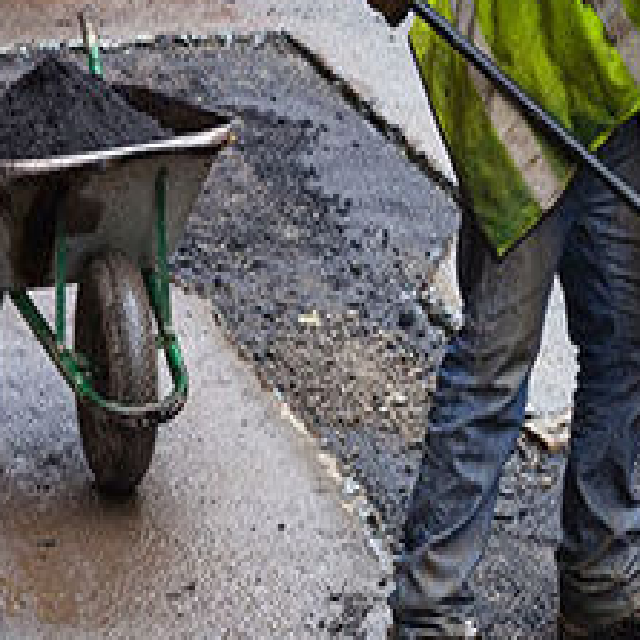

pothole3


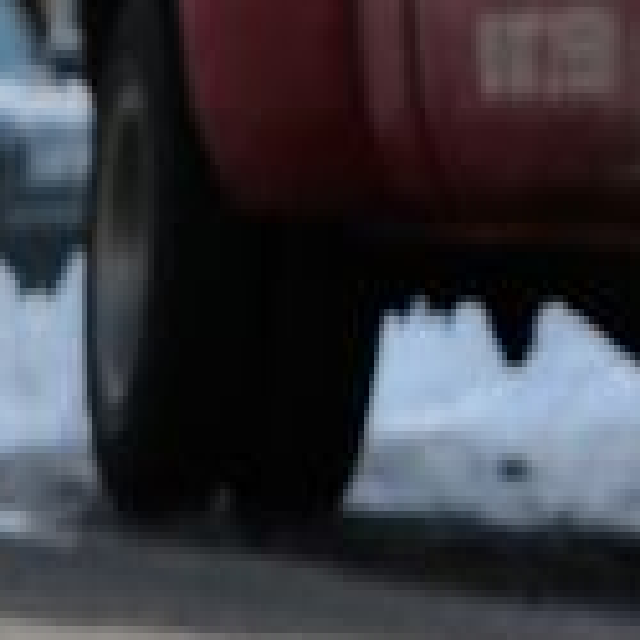

pothole0


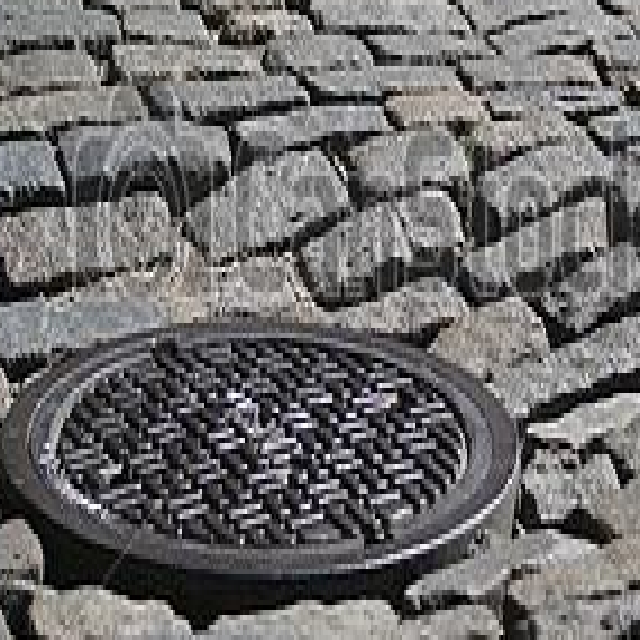

pothole0


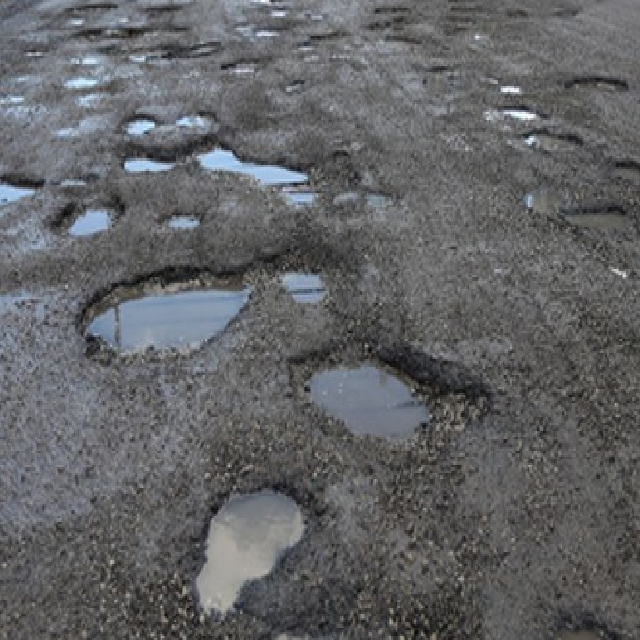

pothole0


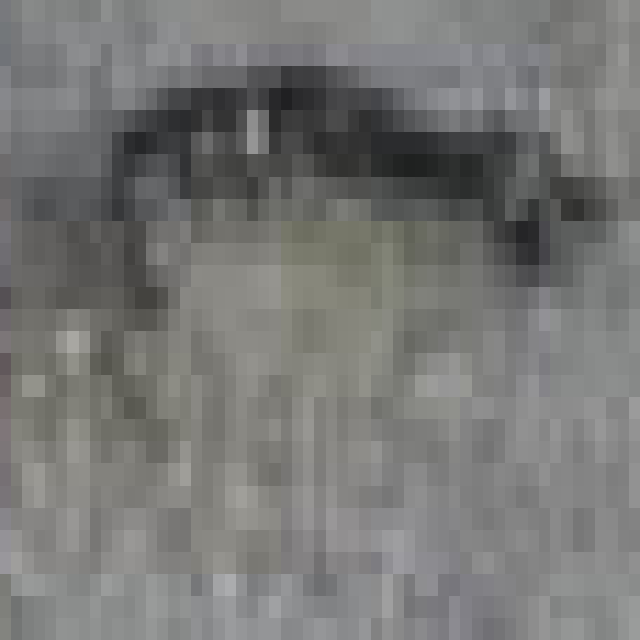

pothole1


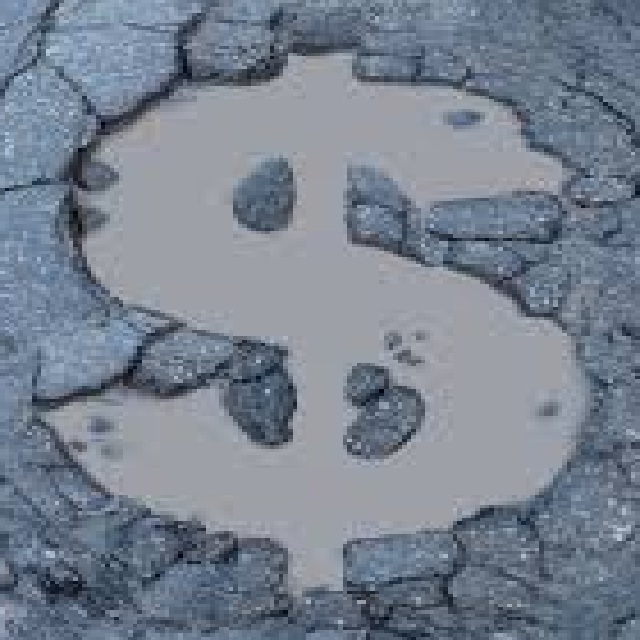

pothole3


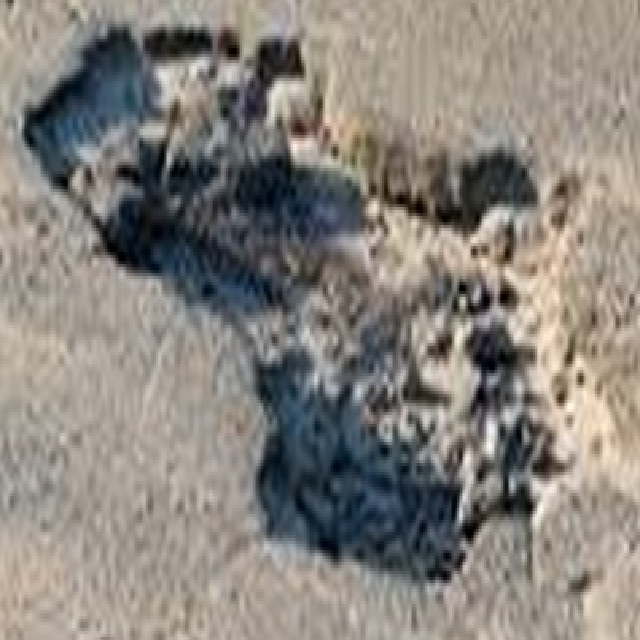

pothole2


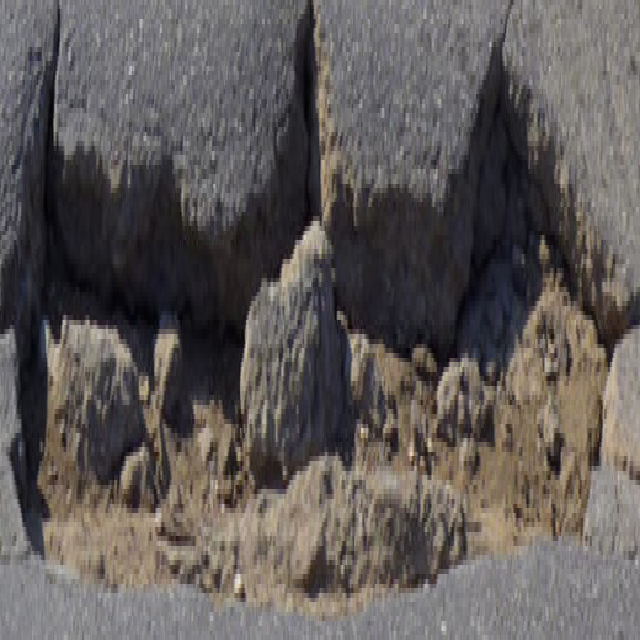

pothole4


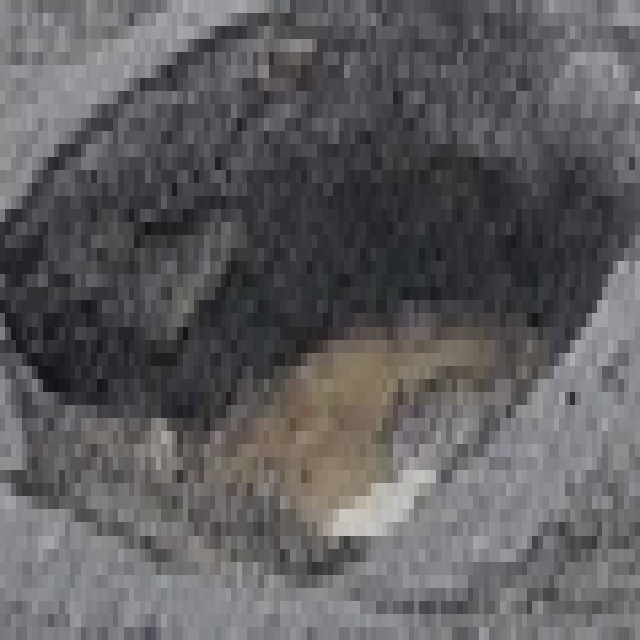

pothole4


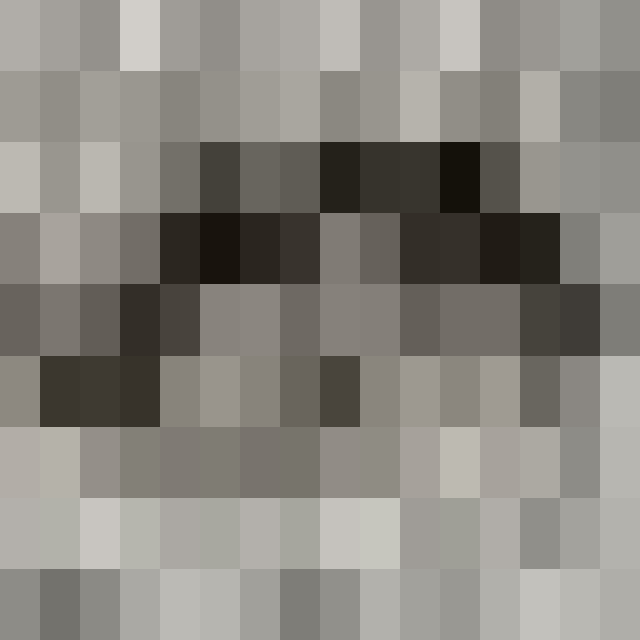

pothole2


In [8]:
import pathlib
import IPython.display as display
from PIL import Image
import os
import random


data_root = pathlib.Path('./')
training_objs = list(data_root.glob('training_objects/*.png'))
training_objs = [str(path) for path in training_objs]
random.shuffle(training_objs)

for i in range(10):
    display.display(display.Image(training_objs[i]))
    print(os.path.basename(training_objs[i])[0:8])

## Prepare testing data

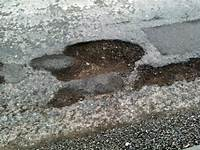

Images\users\kles90105\257_test_data\17p.jpg


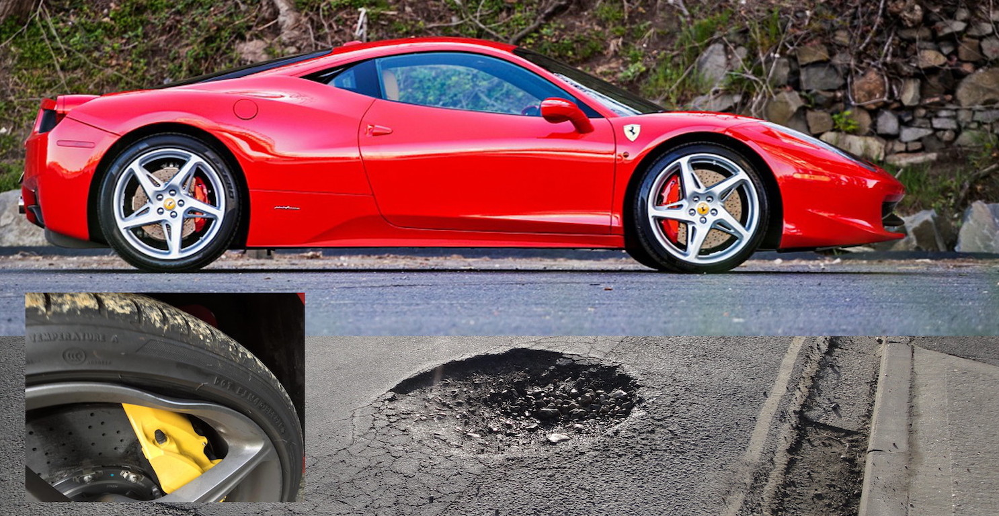

Images\users\kles90105\257_test_data\29p.jpg


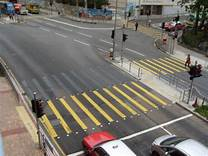

Images\users\kles90105\257_test_data\1n.jpg


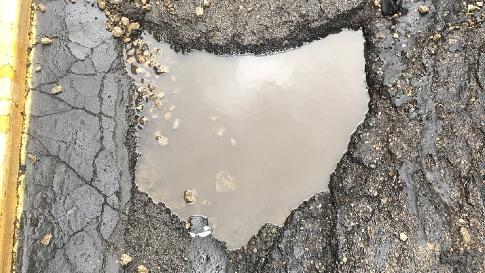

Images\users\kles90105\257_test_data\pothole_pos179.jpg


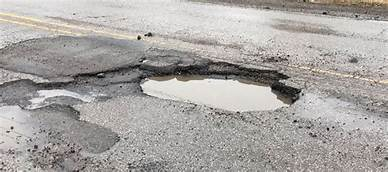

Images\users\kles90105\257_test_data\8p.jpg


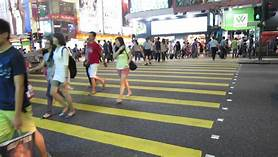

Images\users\kles90105\257_test_data\4n.jpg


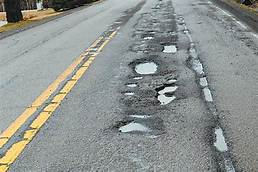

Images\users\kles90105\257_test_data\10p.jpg


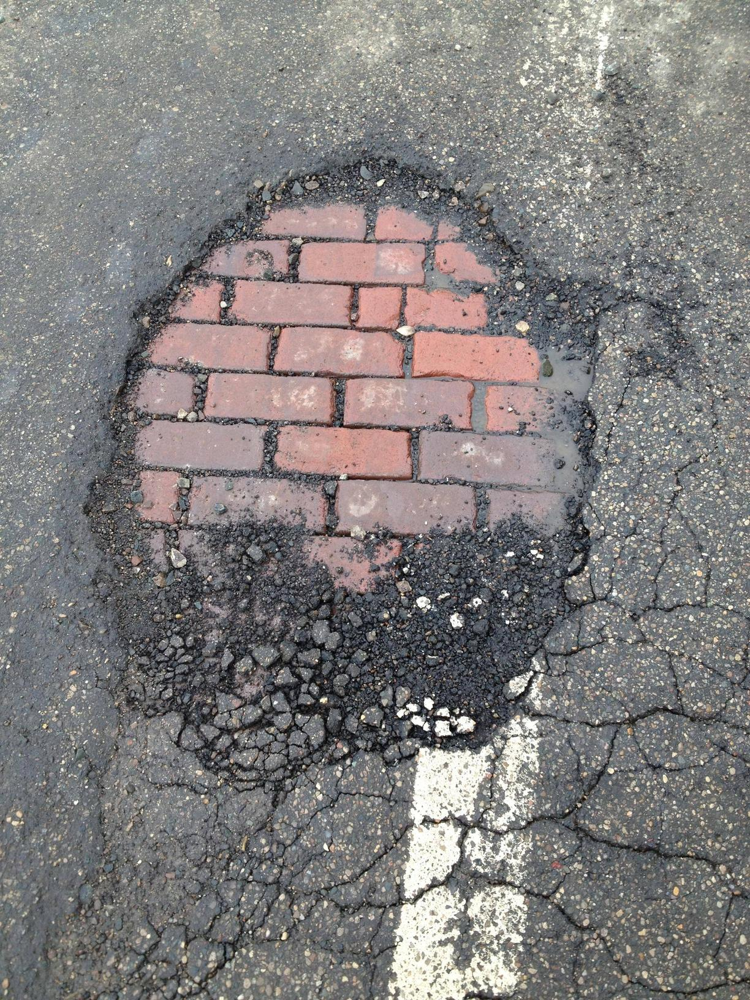

Images\users\kles90105\257_test_data\28p.jpg


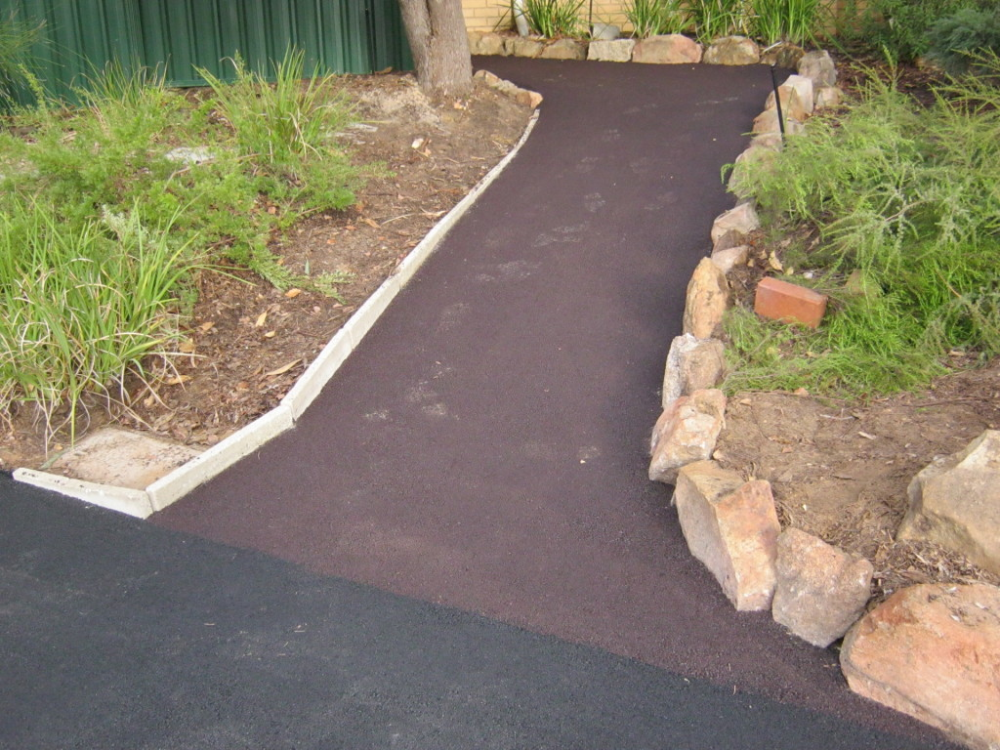

Images\users\kles90105\257_test_data\14n.jpg


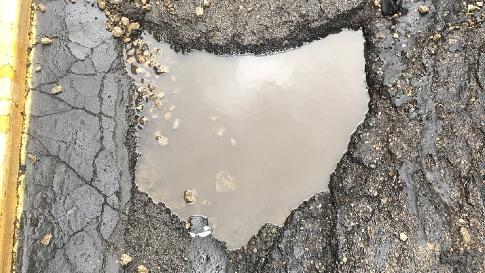

Images\users\kles90105\257_test_data\pothole_pos179.jpg


In [9]:
import pathlib
import IPython.display as display
import random

DATADIR = './test_data'
data_root = pathlib.Path(DATADIR)

all_image_paths = list(data_root.glob('*/*/*/*/*.jpg'))
all_image_paths = [str(path) for path in all_image_paths]
all_xml_paths = list(data_root.glob('*/*/*/*/*.xml'))
all_xml_paths = [str(path) for path in all_xml_paths]

def caption_image(image_path):
    image_rel = pathlib.Path(image_path).relative_to(data_root)
    return image_rel
    
for n in range(10):
  image_path = random.choice(all_image_paths)
  display.display(display.Image(image_path))
  print(caption_image(image_path))


In [10]:
import xml.etree.ElementTree as ET
import numpy as np
from array import *
from PIL import Image
import uuid

def xml_tree(x):
    for child in x:
        if(child.getchildren() == []):
            print(child.tag, ":", child.text)
        else:
            print(child.tag)
            xml_tree(child)

for i in range(len(all_image_paths)):
    tree = ET.parse(all_xml_paths[i])
    root = tree.getroot()
    xml_tree(root)
    print("")

    objs = root.findall("./object")

    url = './test_data/Images/users/kles90105/257_test_data/' + root.find("./filename").text

    x_list = []
    y_list = []
    i = 0
    for co in objs:
        print(co.find("./name").text)
        for node in co.findall("./polygon/pt"):
            print("point")
            children = node.getchildren()
            x = children[0].text
            y = children[1].text
            x_list.append(int(float(x)))
            y_list.append(int(float(y)))
            print(int(float(x)), int(float(y)))
        print("top-left", min(x_list), min(y_list))
        print("bottom-right", max(x_list), max(y_list))
        print()
    
        im = Image.open(url) 
        outfile = 'testing_objects/%s-%s.png' % (str(co.find("./name").text), str(uuid.uuid4()))
        im.crop((min(x_list), min(y_list), max(x_list), max(y_list))).resize((640, 640)).save(outfile)
        print("Save as:", outfile)
        print()
        
        x_list = []
        y_list = []


filename : 10n.jpg
folder : users/kles90105//257_test_data
source
submittedBy : Chen-Feng Huang
imagesize
nrows : 159
ncols : 212
object
name : pothole0
deleted : 0
verified : 0
occluded : no
attributes : None
parts
hasparts : None
ispartof : None
date : 20-Apr-2019 19:02:42
id : 0
type : bounding_box
polygon
username : Bert
pt
x : 47
y : 51
pt
x : 172
y : 51
pt
x : 172
y : 129
pt
x : 47
y : 129

pothole0
point
47 51
point
172 51
point
172 129
point
47 129
top-left 47 51
bottom-right 172 129

Save as: testing_objects/pothole0-0b8ae187-805c-4e93-bb9b-ee9517541d9f.png

filename : 10p.jpg
folder : users/kles90105//257_test_data
source
submittedBy : Chen-Feng Huang
imagesize
nrows : 172
ncols : 258
object
name : pothole3
deleted : 0
verified : 0
occluded : no
attributes : None
parts
hasparts : None
ispartof : None
date : 20-Apr-2019 19:05:19
id : 0
type : bounding_box
polygon
username : Bert
pt
x : 125
y : 54
pt
x : 168
y : 54
pt
x : 168
y : 76
pt
x : 125
y : 76
object
name : pothole3
dele

filename : 16p.jpg
folder : users/kles90105//257_test_data
source
submittedBy : Chen-Feng Huang
imagesize
nrows : 151
ncols : 224
object
name : pothole1
deleted : 0
verified : 0
occluded : no
attributes : None
parts
hasparts : None
ispartof : None
date : 20-Apr-2019 19:06:19
id : 0
type : bounding_box
polygon
username : Bert
pt
x : 27
y : 52
pt
x : 203
y : 52
pt
x : 203
y : 121
pt
x : 27
y : 121

pothole1
point
27 52
point
203 52
point
203 121
point
27 121
top-left 27 52
bottom-right 203 121

Save as: testing_objects/pothole1-210f0d85-669b-4b44-ba6c-7dc0077177ae.png

filename : 17n.jpg
folder : users/kles90105//257_test_data
source
submittedBy : Chen-Feng Huang
imagesize
nrows : 768
ncols : 1024
object
name : pothole0
deleted : 0
verified : 0
occluded : no
attributes : None
parts
hasparts : None
ispartof : None
date : 20-Apr-2019 19:03:36
id : 0
type : bounding_box
polygon
username : Bert
pt
x : 181
y : 406
pt
x : 833
y : 406
pt
x : 833
y : 657
pt
x : 181
y : 657

pothole0
point
181 40

filename : 22p.jpg
folder : users/kles90105//257_test_data
source
submittedBy : Chen-Feng Huang
imagesize
nrows : 151
ncols : 226
object
name : pothole3
deleted : 0
verified : 0
occluded : no
attributes : None
parts
hasparts : None
ispartof : None
date : 20-Apr-2019 19:07:34
id : 0
type : bounding_box
polygon
username : Bert
pt
x : 41
y : 47
pt
x : 183
y : 47
pt
x : 183
y : 93
pt
x : 41
y : 93

pothole3
point
41 47
point
183 47
point
183 93
point
41 93
top-left 41 47
bottom-right 183 93

Save as: testing_objects/pothole3-6089219d-057f-4b08-8233-53610ea8c799.png

filename : 23p.jpg
folder : users/kles90105//257_test_data
source
submittedBy : Chen-Feng Huang
imagesize
nrows : 153
ncols : 204
object
name : pothole2
deleted : 0
verified : 0
occluded : no
attributes : None
parts
hasparts : None
ispartof : None
date : 20-Apr-2019 19:07:43
id : 0
type : bounding_box
polygon
username : Bert
pt
x : 182
y : 128
pt
x : 12
y : 128
pt
x : 12
y : 53
pt
x : 182
y : 53

pothole2
point
182 128
point
12

filename : 5n.jpg
folder : users/kles90105//257_test_data
source
submittedBy : Chen-Feng Huang
imagesize
nrows : 156
ncols : 194
object
name : pothole0
deleted : 0
verified : 0
occluded : no
attributes : None
parts
hasparts : None
ispartof : None
date : 20-Apr-2019 19:02:05
id : 0
type : bounding_box
polygon
username : Bert
pt
x : 42
y : 46
pt
x : 152
y : 46
pt
x : 152
y : 99
pt
x : 42
y : 99

pothole0
point
42 46
point
152 46
point
152 99
point
42 99
top-left 42 46
bottom-right 152 99

Save as: testing_objects/pothole0-56a2b95a-a631-4e1b-8be0-beea7fa73768.png

filename : 5p.jpg
folder : users/kles90105//257_test_data
source
submittedBy : Chen-Feng Huang
imagesize
nrows : 172
ncols : 229
object
name : pothole3
deleted : 0
verified : 0
occluded : no
attributes : None
parts
hasparts : None
ispartof : None
date : 20-Apr-2019 19:04:38
id : 0
type : bounding_box
polygon
username : Bert
pt
x : 53
y : 47
pt
x : 181
y : 47
pt
x : 181
y : 163
pt
x : 53
y : 163

pothole3
point
53 47
point
181 47

Save as: testing_objects/pothole0-6e3af14d-0c18-4118-bec8-0aac2f3051eb.png

filename : pothole_pos151.jpg
folder : users/kles90105//extra_data
source
submittedBy : Chen-Feng Huang
imagesize
nrows : 360
ncols : 640
object
name : pothole3
deleted : 0
verified : 0
occluded : no
attributes : None
parts
hasparts : None
ispartof : None
date : 02-May-2019 23:44:36
id : 0
type : bounding_box
polygon
username : Bert
pt
x : 526
y : 207
pt
x : 96
y : 207
pt
x : 96
y : 17
pt
x : 526
y : 17

pothole3
point
526 207
point
96 207
point
96 17
point
526 17
top-left 96 17
bottom-right 526 207

Save as: testing_objects/pothole3-15ad405b-235a-452a-9a1f-df482330cc5e.png

filename : pothole_pos152.jpg
folder : users/kles90105//extra_data
source
submittedBy : Chen-Feng Huang
imagesize
nrows : 367
ncols : 652
object
name : pothole1
deleted : 0
verified : 0
occluded : no
attributes : None
parts
hasparts : None
ispartof : None
date : 02-May-2019 23:45:23
id : 0
type : bounding_box
polygon
username : Bert
pt
x : 

Save as: testing_objects/pothole3-53a59a8b-2234-4ed2-ab85-a5ffb4ec1425.png

filename : pothole_pos160.jpg
folder : users/kles90105//extra_data
source
submittedBy : Chen-Feng Huang
imagesize
nrows : 1462
ncols : 2048
object
name : pothole3
deleted : 0
verified : 0
occluded : no
attributes : None
parts
hasparts : None
ispartof : None
date : 02-May-2019 23:46:57
id : 0
type : bounding_box
polygon
username : Bert
pt
x : 1672
y : 1396
pt
x : 280
y : 1396
pt
x : 280
y : 622
pt
x : 1672
y : 622

pothole3
point
1672 1396
point
280 1396
point
280 622
point
1672 622
top-left 280 622
bottom-right 1672 1396

Save as: testing_objects/pothole3-911573af-5e88-4b66-bc82-995baded98b1.png

filename : pothole_pos161.jpg
folder : users/kles90105//extra_data
source
submittedBy : Chen-Feng Huang
imagesize
nrows : 338
ncols : 450
object
name : pothole3
deleted : 0
verified : 0
occluded : no
attributes : None
parts
hasparts : None
ispartof : None
date : 02-May-2019 23:47:05
id : 0
type : bounding_box
polygon
u

bottom-right 1215 392

Save as: testing_objects/pothole3-c384b07d-eead-4e9c-8619-19a2af468193.png

pothole3
point
924 254
point
1112 254
point
1112 291
point
924 291
top-left 924 254
bottom-right 1112 291

Save as: testing_objects/pothole3-4d5ab2a7-2f39-4f74-b3a8-ec06b30e7c9b.png

filename : pothole_pos173.jpg
folder : users/kles90105//extra_data
source
submittedBy : Chen-Feng Huang
imagesize
nrows : 720
ncols : 1280
object
name : pothole2
deleted : 0
verified : 0
occluded : no
attributes : None
parts
hasparts : None
ispartof : None
date : 02-May-2019 23:53:09
id : 0
type : bounding_box
polygon
username : Bert
pt
x : 8
y : 442
pt
x : 1127
y : 442
pt
x : 1127
y : 689
pt
x : 8
y : 689

pothole2
point
8 442
point
1127 442
point
1127 689
point
8 689
top-left 8 442
bottom-right 1127 689

Save as: testing_objects/pothole2-936962c6-4996-4bc7-8c66-dc1c087c4f7c.png

filename : pothole_pos174.jpg
folder : users/kles90105//extra_data
source
submittedBy : Chen-Feng Huang
imagesize
nrows : 636
ncol